___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

# WELCOME!

Welcome to the "***Sentiment Analysis and Classification Project***" project, the first and only project of the ***Natural Language Processing (NLP)*** course.

This analysis will focus on using Natural Language techniques to find broad trends in the written thoughts of the customers. 
The goal in this project is to predict whether customers recommend the product they purchased using the information in their review text.

One of the challenges in this project is to extract useful information from the *Review Text* variable using text mining techniques. The other challenge is that you need to convert text files into numeric feature vectors to run machine learning algorithms.

At the end of this project, you will learn how to build sentiment classification models using algorithms ***Logistic Regression, Naive Bayes, Support Vector Machine, Random Forest*** and ***Ada Boosting***.

Before diving into the project, please take a look at the Determines and Tasks.

- ***NOTE:*** *This tutorial assumes that you already know the basics of coding in Python and are familiar with the theory behind the algorithms mentioned above as well as NLP techniques.*



---
---


# #Determines
The data is a collection of 22641 Rows and 10 column variables. Each row includes a written comment as well as additional customer information. 
Also each row corresponds to a customer review, and includes the variables:


**Feature Information:**

**Clothing ID:** Integer Categorical variable that refers to the specific piece being reviewed.

**Age:** Positive Integer variable of the reviewers age.

**Title:** String variable for the title of the review.

**Review Text:** String variable for the review body.

**Rating:** Positive Ordinal Integer variable for the product score granted by the customer from 1 Worst, to 5 Best.

**Recommended IND:** Binary variable stating where the customer recommends the product where 1 is recommended, 0 is not recommended.

**Positive Feedback Count:** Positive Integer documenting the number of other customers who found this review positive.

**Division Name:** Categorical name of the product high level division.

**Department Name:** Categorical name of the product department name.

**Class Name:** Categorical name of the product class name.

---

The basic goal in this project is to predict whether customers recommend the product they purchased using the information in their *Review Text*.
Especially, it should be noted that the expectation in this project is to use only the "Review Text" variable and neglect the other ones. 
Of course, if you want, you can work on other variables individually.

Project Structure is separated in five tasks: ***EDA, Feature Selection and Data Cleaning , Text Mining, Word Cloud*** and ***Sentiment Classification with Machine Learning***.

Classically, you can start to know the data after doing the import and load operations. 
You need to do missing value detection for Review Text, which is the only variable you need to care about. You can drop other variables.

You will need to apply ***noise removal*** and ***lexicon normalization*** processes by using the capabilities of the ***nltk*** library to the data set that is ready for text mining.

Afterwards, you will implement ***Word Cloud*** as a visual analysis of word repetition.

Finally, You will build models with five different algorithms and compare their performance. Thus, you will determine the algorithm that makes the most accurate emotion estimation by using the information obtained from the * Review Text * variable.






---
---


# #Tasks

#### 1. Exploratory Data Analysis

- Import Modules, Load Discover the Data

#### 2. Feature Selection and Data Cleaning

- Feature Selection and Rename Column Name
- Missing Value Detection

#### 3. Text Mining

- Tokenization
- Noise Removal
- Lexicon Normalization

#### 4. WordCloud - Repetition of Words

- Detect Reviews
- Collect Words 
- Create Word Cloud 


#### 5. Sentiment Classification with Machine Learning

- Train - Test Split
- Vectorization
- TF-IDF
- Logistic Regression
- Naive Bayes
- Support Vector Machine
- Random Forest
- AdaBoost
- Model Comparison

---
---


# Sentiment analysis of women's clothes reviews


In this project we used sentiment analysis to determined whether the product is recommended or not. We used different machine learning algorithms to get more accurate predictions. The following classification algorithms have been used: Logistic Regression, Naive Bayes, Support Vector Machine (SVM), Random Forest and Ada Boosting. The dataset comes from Woman Clothing Review that can be find at (https://www.kaggle.com/nicapotato/womens-ecommerce-clothing-reviews. 


## 1. Exploratory Data Analysis

### Import Libraries, Load and Discover the Data

In [15]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from nltk.tokenize import sent_tokenize, word_tokenize
from nltk.corpus import stopwords
from nltk.stem import WordNetLemmatizer
from nltk.stem import PorterStemmer

import cufflinks as cf
import chart_studio.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, iplot, init_notebook_mode
init_notebook_mode(connected=True)
cf.go_offline()

from sklearn import model_selection, preprocessing, linear_model, naive_bayes, metrics
from sklearn.metrics import f1_score

In [16]:
df = pd.read_csv('Womens Clothing E-Commerce Reviews.csv',index_col=0)
df

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses
...,...,...,...,...,...,...,...,...,...,...
23481,1104,34,Great dress for many occasions,I was very happy to snag this dress at such a ...,5,1,0,General Petite,Dresses,Dresses
23482,862,48,Wish it was made of cotton,"It reminds me of maternity clothes. soft, stre...",3,1,0,General Petite,Tops,Knits
23483,1104,31,"Cute, but see through","This fit well, but the top was very see throug...",3,0,1,General Petite,Dresses,Dresses
23484,1084,28,"Very cute dress, perfect for summer parties an...",I bought this dress for a wedding i have this ...,3,1,2,General,Dresses,Dresses


In [117]:
df.loc[2][0]

'high hope dress really wanted work initially ordered petite small usual size found small small fact could zip reordered petite medium overall top half comfortable fit nicely bottom half tight layer several somewhat cheap layer imo major design flaw layer sewn directly zipper c'

In [17]:
df[df.duplicated(subset=['Review Text'])]

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
93,1081,31,NaN,NaN,5,1,0,General,Dresses,Dresses
98,1133,50,NaN,NaN,5,1,0,General,Jackets,Outerwear
135,861,35,NaN,NaN,4,1,0,General Petite,Tops,Knits
142,1126,35,NaN,NaN,5,1,0,General,Jackets,Outerwear
165,829,35,NaN,NaN,3,0,0,General Petite,Tops,Blouses
...,...,...,...,...,...,...,...,...,...,...
23258,862,35,NaN,NaN,4,1,0,General,Tops,Knits
23301,862,52,NaN,NaN,5,1,0,General,Tops,Knits
23303,823,46,NaN,NaN,5,1,0,General,Tops,Blouses
23470,1104,39,NaN,NaN,5,1,0,General Petite,Dresses,Dresses


In [18]:
df[df['Review Text'] == 'Love, love these jeans. being short they come right to my ankle. super soft and don?t require any hemming. i ordered my typical jean size of 26 and they fit like a glove. would love to have these in black and grey.']

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
9447,1022,37,NaN,"Love, love these jeans. being short they come ...",5,1,0,General,Bottoms,Jeans
21888,1022,37,NaN,"Love, love these jeans. being short they come ...",5,1,0,General,Bottoms,Jeans


In [19]:
df

,Clothing ID,Age,Title,Review Text,Rating,Recommended IND,Positive Feedback Count,Division Name,Department Name,Class Name
0,767,33,NaN,Absolutely wonderful - silky and sexy and comf...,4,1,0,Initmates,Intimate,Intimates
1,1080,34,NaN,Love this dress! it's sooo pretty. i happene...,5,1,4,General,Dresses,Dresses
2,1077,60,Some major design flaws,I had such high hopes for this dress and reall...,3,0,0,General,Dresses,Dresses
3,1049,50,My favorite buy!,"I love, love, love this jumpsuit. it's fun, fl...",5,1,0,General Petite,Bottoms,Pants
4,847,47,Flattering shirt,This shirt is very flattering to all due to th...,5,1,6,General,Tops,Blouses
...,...,...,...,...,...,...,...,...,...,...
23481,1104,34,Great dress for many occasions,I was very happy to snag this dress at such a ...,5,1,0,General Petite,Dresses,Dresses
23482,862,48,Wish it was made of cotton,"It reminds me of maternity clothes. soft, stre...",3,1,0,General Petite,Tops,Knits
23483,1104,31,"Cute, but see through","This fit well, but the top was very see throug...",3,0,1,General Petite,Dresses,Dresses
23484,1084,28,"Very cute dress, perfect for summer parties an...",I bought this dress for a wedding i have this ...,3,1,2,General,Dresses,Dresses


### Data Wrangling
Take info

In [20]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 23486 entries, 0 to 23485
Data columns (total 10 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   Clothing ID              23486 non-null  int64 
 1   Age                      23486 non-null  int64 
 2   Title                    19676 non-null  object
 3   Review Text              22641 non-null  object
 4   Rating                   23486 non-null  int64 
 5   Recommended IND          23486 non-null  int64 
 6   Positive Feedback Count  23486 non-null  int64 
 7   Division Name            23472 non-null  object
 8   Department Name          23472 non-null  object
 9   Class Name               23472 non-null  object
dtypes: int64(5), object(5)
memory usage: 2.0+ MB


#### Check Proportion of Target Class Variable:

The target class variable is imbalanced, where "Recommended" values are more dominating then "Not Recommendation".

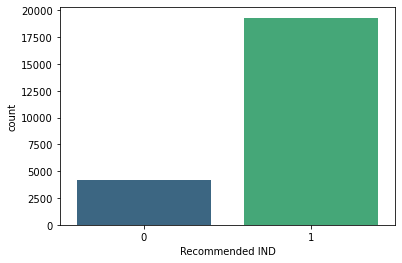

In [21]:
sns.countplot(df['Recommended IND'],palette='viridis')
#data is unbalanced we may use SMOTE or ADASYN

---
---


## 2. Feature Selection and Data Cleaning

From now on, the DataFrame you will work with should contain two columns: **"Review Text"** and **"Recommended IND"**. You can do the missing value detection operations from now on. You can also rename the column names if you want.



### Feature Selection and Rename Column Name

In [22]:
df = df[['Review Text', 'Recommended IND']]
df

,Review Text,Recommended IND
0,Absolutely wonderful - silky and sexy and comf...,1
1,Love this dress! it's sooo pretty. i happene...,1
2,I had such high hopes for this dress and reall...,0
3,"I love, love, love this jumpsuit. it's fun, fl...",1
4,This shirt is very flattering to all due to th...,1
...,...,...
23481,I was very happy to snag this dress at such a ...,1
23482,"It reminds me of maternity clothes. soft, stre...",1
23483,"This fit well, but the top was very see throug...",0
23484,I bought this dress for a wedding i have this ...,1


In [23]:
df.columns = ['sentences','label']
df

,sentences,label
0,Absolutely wonderful - silky and sexy and comf...,1
1,Love this dress! it's sooo pretty. i happene...,1
2,I had such high hopes for this dress and reall...,0
3,"I love, love, love this jumpsuit. it's fun, fl...",1
4,This shirt is very flattering to all due to th...,1
...,...,...
23481,I was very happy to snag this dress at such a ...,1
23482,"It reminds me of maternity clothes. soft, stre...",1
23483,"This fit well, but the top was very see throug...",0
23484,I bought this dress for a wedding i have this ...,1


### Missing Value Detection

In [24]:
df.isnull().sum()
# i will drop null rows, without review i dont need label...

sentences    845
label          0
dtype: int64

In [25]:
df = df.dropna()
df.isnull().sum()


sentences    0
label        0
dtype: int64

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22641 entries, 0 to 23485
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   sentences  22641 non-null  object
 1   label      22641 non-null  int64 
dtypes: int64(1), object(1)
memory usage: 530.6+ KB


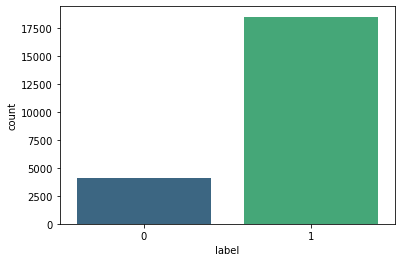

In [27]:
sns.countplot(df['label'],palette='viridis')

In [28]:
df['label'].iplot(kind='histogram')

---
---


## 3. Text Mining

Text is the most unstructured form of all the available data, therefore various types of noise are present in it. This means that the data is not readily analyzable without any pre-processing. The entire process of cleaning and standardization of text, making it noise-free and ready for analysis is known as **text preprocessing**.

The three key steps of text preprocessing:

- **Tokenization:**
This step is one of the top priorities when it comes to working on text mining. Tokenization is essentially splitting a phrase, sentence, paragraph, or an entire text document into smaller units, such as individual words or terms. Each of these smaller units are called tokens.

- **Noise Removal:**
Any piece of text which is not relevant to the context of the data and the end-output can be specified as the noise.
For example – language stopwords (commonly used words of a language – is, am, the, of, in etc), URLs or links, upper and lower case differentiation, punctuations and industry specific words. This step deals with removal of all types of noisy entities present in the text.


- **Lexicon Normalization:**
Another type of textual noise is about the multiple representations exhibited by single word.
For example – “play”, “player”, “played”, “plays” and “playing” are the different variations of the word – “play”. Though they mean different things, contextually they all are similar. This step converts all the disparities of a word into their normalized form (also known as lemma). 
There are two methods of lexicon normalisation; **[Stemming or Lemmatization](https://www.guru99.com/stemming-lemmatization-python-nltk.html)**. Lemmatization is recommended for this case, because Lemmatization as this will return the root form of each word (rather than just stripping suffixes, which is stemming).

As the first step change text to tokens and convertion all of the words to lower case.  Next remove punctuation, bad characters, numbers and stop words. The second step is aimed to normalization them throught the Lemmatization method. 


***Note:*** *Use the functions of the ***[nltk Library](https://www.guru99.com/nltk-tutorial.html)*** for all the above operations.*



### Tokenization

### Noise Removal

### Lexicon Normalization

In [29]:
stop_words = stopwords.words('english')
#stop_words.extend(['film','movie','one','story','make','time'])
lem = WordNetLemmatizer()
def cleaning(data):
    text_tokens = word_tokenize(data.lower()) # 1.Step tokenization.
    text_tokens = [w for w in text_tokens if w.isalpha()]# 2.Step Remove Puncs
    text_tokens = [t for t in text_tokens if t not in stop_words]# 3.Step Remove Stopwords
    text_tokens = [lem.lemmatize(t) for t in text_tokens]# 4.Step Lemmatize
    return " ".join(text_tokens)# Joining

In [30]:
df['sentences'] = df['sentences'].apply(cleaning)
df

,sentences,label
0,absolutely wonderful silky sexy comfortable,1
1,love dress sooo pretty happened find store gla...,1
2,high hope dress really wanted work initially o...,0
3,love love love jumpsuit fun flirty fabulous ev...,1
4,shirt flattering due adjustable front tie perf...,1
...,...,...
23481,happy snag dress great price easy slip flatter...,1
23482,reminds maternity clothes soft stretchy shiny ...,1
23483,fit well top see never would worked glad able ...,0
23484,bought dress wedding summer cute unfortunately...,1


In [31]:
df.reset_index(drop = True)

,sentences,label
0,absolutely wonderful silky sexy comfortable,1
1,love dress sooo pretty happened find store gla...,1
2,high hope dress really wanted work initially o...,0
3,love love love jumpsuit fun flirty fabulous ev...,1
4,shirt flattering due adjustable front tie perf...,1
...,...,...
22636,happy snag dress great price easy slip flatter...,1
22637,reminds maternity clothes soft stretchy shiny ...,1
22638,fit well top see never would worked glad able ...,0
22639,bought dress wedding summer cute unfortunately...,1


In [32]:
#Rare words;
text = df["sentences"].values
text = " ".join(text)
print("letter",len(text))
text_list = text.split()
print("word",len(text_list))

letter 3984004
word 625299


In [33]:
text

'absolutely wonderful silky sexy comfortable love dress sooo pretty happened find store glad bc never would ordered online bc petite bought petite love length hit little knee would definitely true midi someone truly petite high hope dress really wanted work initially ordered petite small usual size found outrageously small small fact could zip reordered petite medium overall top half comfortable fit nicely bottom half tight layer several somewhat cheap net layer imo major design flaw net layer sewn directly zipper c love love love jumpsuit fun flirty fabulous every time wear get nothing great compliment shirt flattering due adjustable front tie perfect length wear legging sleeveless pair well cardigan love shirt love tracy reese dress one petite foot tall usually wear brand dress pretty package lot dress skirt long full overwhelmed small frame stranger alteration shortening narrowing skirt would take away embellishment garment love color idea style work returned dress aded basket hte l

In [34]:
from collections import Counter
Counter(text_list).most_common()[-9500:]

[('buyer', 15),
 ('basket', 14),
 ('carbon', 14),
 ('written', 14),
 ('upset', 14),
 ('moved', 14),
 ('monitor', 14),
 ('eat', 14),
 ('te', 14),
 ('slipping', 14),
 ('sticky', 14),
 ('dimension', 14),
 ('bargain', 14),
 ('needing', 14),
 ('location', 14),
 ('forest', 14),
 ('cheerful', 14),
 ('modesty', 14),
 ('throwing', 14),
 ('popular', 14),
 ('pack', 14),
 ('lacing', 14),
 ('drive', 14),
 ('breath', 14),
 ('nip', 14),
 ('serious', 14),
 ('oatmeal', 14),
 ('ddd', 14),
 ('yikes', 14),
 ('email', 14),
 ('stumbled', 14),
 ('puckered', 14),
 ('fav', 14),
 ('lbd', 14),
 ('page', 14),
 ('steam', 14),
 ('instant', 14),
 ('distracting', 14),
 ('festive', 14),
 ('fallen', 14),
 ('finishing', 14),
 ('exceptionally', 14),
 ('virtually', 14),
 ('friendly', 14),
 ('non', 14),
 ('frequently', 14),
 ('lastly', 14),
 ('stained', 14),
 ('heather', 14),
 ('advantage', 14),
 ('bringing', 14),
 ('tweed', 14),
 ('fuzz', 14),
 ('occasionally', 14),
 ('clung', 14),
 ('hugged', 14),
 ('disaster', 14),
 ('g

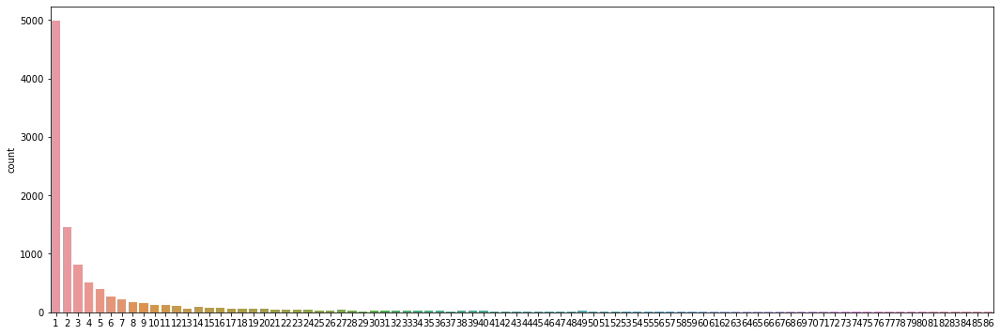

In [35]:
a = list(Counter(text_list).values())
plt.figure(figsize=(18,6))
sns.countplot(sorted(a)[:11000])

In [36]:
one_word_comment = []
for i in df["sentences"].values:
    a = i.split()
    if len(a) < 4:
        one_word_comment.extend(i.split())
        print(i)
print(one_word_comment)        

sweater cute scratchy
great style
initially attracted color
beautiful color
super cute flattering
loved top beautiful
love embroidery
sweater super cute
loved sweater boxy
awesome dress
love top
order size
got green one
would liked small
disappointment price outrageous
fence one pretty
dying skirt picture
beautiful delicate
one timeless sure
dress flattering
comfy cozy
soft sweet
glad got perfect
great fit
love feel comfort
love wear blouse
small loved
totally see
beautiful sweater
love bird
beautiful design fit
pretty romantic
tried store sheer
great style dressed
color beautiful
pretty comfortable love
love dress
love jean dress
great structure
got absolutely love
ordered friend loved
beautiful flattering blouse
fit perfect
skirt flattering comfortable
love dress color
wonderful style
beautiful comfy love
cute dress taller
great dress vacation
soft comfortable
love simple
fit great comfortable
fit perfect
love dress
become short dress
never write review
love jean
perfect
run little s

In [37]:
rare_words = pd.Series(" ".join(df["sentences"]).split()).value_counts()[pd.Series(" ".join(df["sentences"]).split()).value_counts() <=5]

In [38]:
rare_words

conceals       5
bodycon        5
formfitting    5
hike           5
crumpled       5
              ..
erred          1
knox           1
leaned         1
restore        1
hail           1
Length: 8150, dtype: int64

In [39]:
df['sentences'] = df['sentences'].apply(lambda x: " ".join(x for x in x.split() if x not in rare_words))

In [40]:
text_new = df["sentences"].values
text_new = " ".join(text_new)
print("letter",len(text_new))
text_new_list = text_new.split()
print("word",len(text_new_list))

letter 3870596
word 610983


In [41]:
Counter(text_new_list).most_common()[-10:]

[('wearability', 6),
 ('relationship', 6),
 ('merino', 6),
 ('replacing', 6),
 ('purely', 6),
 ('foam', 6),
 ('fortunate', 6),
 ('junk', 6),
 ('forced', 6),
 ('coupled', 6)]

## 4. WordCloud - Repetition of Words

Now you'll create a Word Clouds for reviews, representing most common words in each target class.

Word Cloud is a data visualization technique used for representing text data in which the size of each word indicates its frequency or importance. Significant textual data points can be highlighted using a word cloud.

You are expected to create separate word clouds for positive and negative reviews. You can qualify a review as positive or negative, by looking at its recommended status. You may need to use capabilities of matplotlib for visualizations.

You can follow the steps below:

- Detect Reviews
- Collect Words 
- Create Word Cloud 


### Detect Reviews (positive and negative separately)

In [42]:
pos_words_df = df[df['label'] == 1][['sentences']]
pos_words_df

,sentences
0,absolutely wonderful silky sexy comfortable
1,love dress sooo pretty happened find store gla...
3,love love love jumpsuit fun flirty fabulous ev...
4,shirt flattering due adjustable front tie perf...
6,basket hte last see would look like person sto...
...,...
23479,sure ordering skirt could see person first gla...
23481,happy snag dress great price easy slip flatter...
23482,reminds maternity clothes soft stretchy shiny ...
23484,bought dress wedding summer cute unfortunately...


In [43]:
neg_words_df = df[df['label'] == 0][['sentences']]
neg_words_df

,sentences
2,high hope dress really wanted work initially o...
5,love tracy reese dress one petite foot tall us...
10,dress run small esp zipper area run ordered sp...
22,first pullover styling side zipper would purch...
25,loved material didnt really look long dress pu...
...,...
23449,tried color really pretty fun want pair pant l...
23450,wanted love jacket soft great color unfortunat...
23460,purchased good price typically love maeve fabr...
23478,surprised positive review product terrible cut...


### Collect Words (positive and negative separately)

In [44]:
pos_words = " ".join(pos_words_df['sentences'].values )
neg_words = " ".join(neg_words_df['sentences'].values )

In [45]:
pos_words

'absolutely wonderful silky sexy comfortable love dress sooo pretty happened find store glad bc never would ordered online bc petite bought petite love length hit little knee would definitely true midi someone truly petite love love love jumpsuit fun flirty fabulous every time wear get nothing great compliment shirt flattering due adjustable front tie perfect length wear legging sleeveless pair well cardigan love shirt basket hte last see would look like person store pick went teh color pale hte color really gorgeous turn trying little baggy hte x hte size bummer petite decided though said everything pant skirt trying kept ordered carbon store pick ton stuff always try used top pair skirt pant everything went color really nice charcoal shimmer went well pencil skirt flare pant etc bit big sleeve long go petite also bit loose xx kept wil later since light color already sold hte smallest size love dress usually get x run little snug bust ordered size flattering feminine usual retailer fl

### Create Word Cloud (for most common words in recommended not recommended reviews separately)

Negative


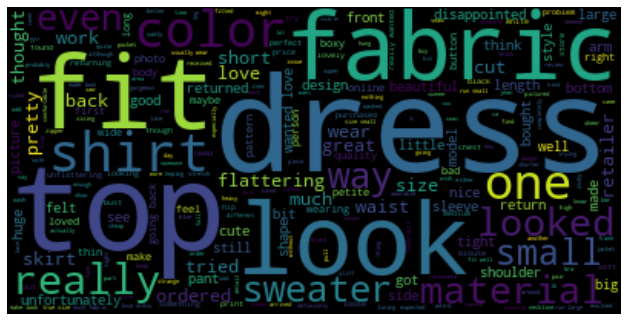

Positive


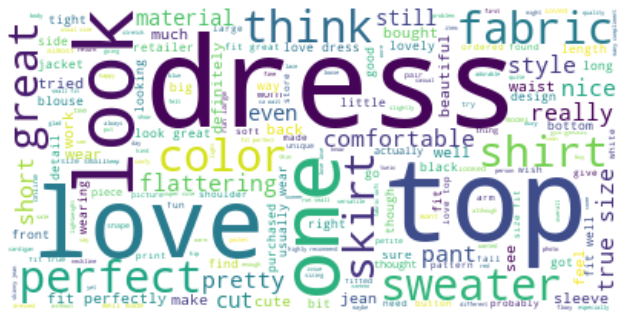

In [46]:
from wordcloud import WordCloud
print('Negative')
wordcloud = WordCloud( max_words = 500)
wordcloud.generate(neg_words)
plt.figure(figsize=(11,11))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

print('Positive')
wordcloud = WordCloud(background_color = 'white', max_words = 500)
wordcloud.generate(pos_words)
plt.figure(figsize=(11,11))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

Negative


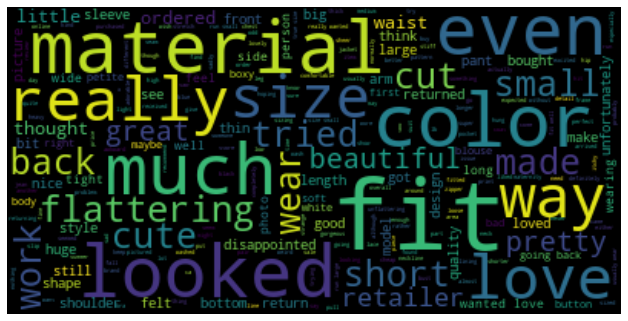

Positive


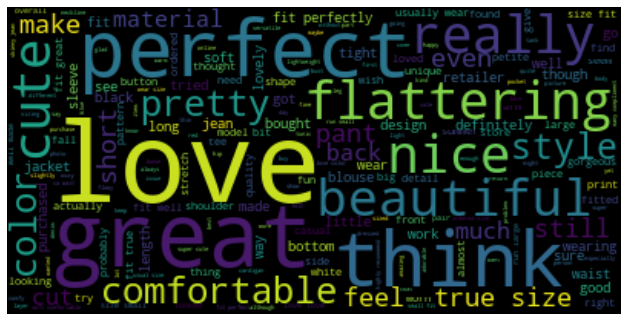

In [47]:
stop_words = stopwords.words('english')
stop_words2 = stop_words
stop_words2.extend(['dress','top','look','fabric','shirt','sweater','skirt','one'])
lem = WordNetLemmatizer()

def cleaning(data):
    text_tokens = word_tokenize(data.lower()) # removed the .lower intentionaly 
    tokens_without_puncs = [w for w in text_tokens if w.isalpha()]
    tokens_without_sw = [t for t in tokens_without_puncs if t not in stop_words2]
    text_cleaned = [lem.lemmatize(t) for t in tokens_without_sw]
    return " ".join(text_cleaned)

print('Negative')
neg_words2 = neg_words_df['sentences'].apply(cleaning)
from wordcloud import WordCloud
original = " ".join(neg_words2)
wordcloud = WordCloud( max_words = 300)
wordcloud.generate(original)
plt.figure(figsize=(11,11))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

print('Positive')
pos_words2 = pos_words_df['sentences'].apply(cleaning)
original = " ".join(pos_words2)
wordcloud = WordCloud( max_words = 300)
wordcloud.generate(original)
plt.figure(figsize=(11,11))
plt.imshow(wordcloud, interpolation = "bilinear")
plt.axis("off")
plt.show()

## 5. Sentiment Classification with Machine Learning

Before moving on to modeling, as data preprocessing steps you will need to perform **[vectorization](https://machinelearningmastery.com/prepare-text-data-machine-learning-scikit-learn/)** and **train-test split**. You have performed many times train test split process before.
But you will perform the vectorization for the first time.

Machine learning algorithms most often take numeric feature vectors as input. Thus, when working with text documents, you need a way to convert each document into a numeric vector. This process is known as text vectorization. Commonly used vectorization approach that you will use here is to represent each text as a vector of word counts.

At this moment, you have your review text column as a token (which has no punctuations and stopwords). You can use Scikit-learn’s CountVectorizer to convert the text collection into a matrix of token counts. You can imagine this resulting matrix as a 2-D matrix, where each row is a unique word, and each column is a review.

Train all models using TFIDF and Count vectorizer data.

After performing data preprocessing, build your models using following classification algorithms:

- Logistic Regression,
- Naive Bayes,
- Support Vector Machine,
- Random Forest,
- Ada Boosting.

### Train - Test Split

In [48]:
X = df["sentences"]
y = df["label"]
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, stratify=y, random_state=42)

### Vectorization & TF-IDF

In [49]:
## VECTORIZER
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
vectorizer = CountVectorizer()
vectorizer.fit(X_train)

X_train_count = vectorizer.transform(X_train)
X_test_count = vectorizer.transform(X_test)

print(vectorizer.get_feature_names()[:5])
print(X_train_count.toarray())


['abdomen', 'ability', 'able', 'absolute', 'absolutely']
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


In [50]:
## TFIDF
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
tfidf_vec = TfidfVectorizer()
tfidf_vec.fit(X_train)

X_train_tfidf = tfidf_vec.transform(X_train)
X_test_tfidf = tfidf_vec.transform(X_test)

print(tfidf_vec.get_feature_names()[:5])
print(X_train_tfidf.toarray())
a = pd.DataFrame(X_train_tfidf.toarray(),columns=tfidf_vec.get_feature_names())
a.head()

['abdomen', 'ability', 'able', 'absolute', 'absolutely']
[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


,abdomen,ability,able,absolute,absolutely,abstract,abt,ac,accent,accentuate,...,youthful,yummy,zero,zip,zipped,zipper,zippered,zipping,zone,zoom
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [126]:
# import sklearn
# sklearn.metrics.SCORERS.keys()

dict_keys(['explained_variance', 'r2', 'max_error', 'neg_median_absolute_error', 'neg_mean_absolute_error', 'neg_mean_squared_error', 'neg_mean_squared_log_error', 'neg_root_mean_squared_error', 'neg_mean_poisson_deviance', 'neg_mean_gamma_deviance', 'accuracy', 'roc_auc', 'roc_auc_ovr', 'roc_auc_ovo', 'roc_auc_ovr_weighted', 'roc_auc_ovo_weighted', 'balanced_accuracy', 'average_precision', 'neg_log_loss', 'neg_brier_score', 'adjusted_rand_score', 'homogeneity_score', 'completeness_score', 'v_measure_score', 'mutual_info_score', 'adjusted_mutual_info_score', 'normalized_mutual_info_score', 'fowlkes_mallows_score', 'precision', 'precision_macro', 'precision_micro', 'precision_samples', 'precision_weighted', 'recall', 'recall_macro', 'recall_micro', 'recall_samples', 'recall_weighted', 'f1', 'f1_macro', 'f1_micro', 'f1_samples', 'f1_weighted', 'jaccard', 'jaccard_macro', 'jaccard_micro', 'jaccard_samples', 'jaccard_weighted'])

In [130]:
# from sklearn.metrics import classification_report, confusion_matrix
# log_classifier = linear_model.LogisticRegression(max_iter=1000)
# log_classifier.fit(X_train_count, y_train)
# y_pred = log_classifier.predict(X_test_count)
# print(confusion_matrix(y_test,y_pred))
# print(classification_report(y_test, y_pred))

# log_accuracy_count = model_selection.cross_val_score(log_classifier,X_test_count,y_test,cv = 10)
# #.mean()
# f2 = model_selection.cross_val_score(log_classifier,X_test_count,y_test,cv = 10,scoring='f1_weighted')

# f1_log_accuracy_count = f1_score(y_test, y_pred,average = 'weighted')
# print("Log Regression Count Vectors f1:",f1_log_accuracy_count)
# print("Log Regression Count Vectors Accuracy:", log_accuracy_count)
# print("f2:", f2)

[[ 492  328]
 [ 204 3505]]
              precision    recall  f1-score   support

           0       0.71      0.60      0.65       820
           1       0.91      0.94      0.93      3709

    accuracy                           0.88      4529
   macro avg       0.81      0.77      0.79      4529
weighted avg       0.88      0.88      0.88      4529

Log Regression Count Vectors f1: 0.8786964274289515
Log Regression Count Vectors Accuracy: [0.89403974 0.87417219 0.85871965 0.86754967 0.84547461 0.86313466
 0.88741722 0.86754967 0.86092715 0.84292035]
f2: [0.88585157 0.87056802 0.83818519 0.86178808 0.83969422 0.86035524
 0.8835402  0.86556601 0.85167497 0.84015456]


### Logistic Regression

In [134]:
from sklearn.metrics import classification_report, confusion_matrix
log_classifier = linear_model.LogisticRegression(max_iter=1000)
log_classifier.fit(X_train_count, y_train)
y_pred = log_classifier.predict(X_test_count)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test, y_pred))

log_classifier = linear_model.LogisticRegression(max_iter=1000)
log_classifier.fit(X_train_count, y_train)
log_accuracy_count = model_selection.cross_val_score(log_classifier,
                                           X_test_count,
                                           y_test,
                                           cv = 10).mean()
f1_log_accuracy_count = f1_score(y_test, y_pred,average = 'weighted')
print("Log Regression Count Vectors f1:",f1_log_accuracy_count)
print("Log Regression Count Vectors Accuracy:", log_accuracy_count)


[[ 492  328]
 [ 204 3505]]
              precision    recall  f1-score   support

           0       0.71      0.60      0.65       820
           1       0.91      0.94      0.93      3709

    accuracy                           0.88      4529
   macro avg       0.81      0.77      0.79      4529
weighted avg       0.88      0.88      0.88      4529

Log Regression Count Vectors f1: 0.8786964274289515
Log Regression Count Vectors Accuracy: 0.866190490144367


In [135]:
from sklearn.metrics import classification_report, confusion_matrix
log_classifier = linear_model.LogisticRegression()
log_classifier.fit(X_train_tfidf, y_train)
y_pred = log_classifier.predict(X_test_tfidf)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test, y_pred))

log_classifier = linear_model.LogisticRegression(max_iter=1000)
log_classifier.fit(X_train_tfidf, y_train)
log_accuracy_tfidf = model_selection.cross_val_score(log_classifier,
                                           X_test_tfidf,
                                           y_test,
                                           cv = 10).mean()
f1_log_accuracy_tfidf = f1_score(y_test, y_pred,average = 'weighted')
print("Log Regression tfidf Vectors f1:",f1_log_accuracy_tfidf)
print("Log Regression tfidf Vectors Accuracy:", log_accuracy_tfidf)

[[ 414  406]
 [ 124 3585]]
              precision    recall  f1-score   support

           0       0.77      0.50      0.61       820
           1       0.90      0.97      0.93      3709

    accuracy                           0.88      4529
   macro avg       0.83      0.74      0.77      4529
weighted avg       0.87      0.88      0.87      4529

Log Regression tfidf Vectors f1: 0.8729688098309105
Log Regression tfidf Vectors Accuracy: 0.8573648635449022


### Decision Tree

In [53]:
from sklearn.tree import DecisionTreeClassifier
dsc_classifier = DecisionTreeClassifier()
dsc_classifier.fit(X_train_count , y_train)
y_pred = dsc_classifier.predict(X_test_count)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

dsc_classifier = DecisionTreeClassifier()
dsc_classifier.fit(X_train_count , y_train)
dsc_accuracy_count = model_selection.cross_val_score(dsc_classifier, 
                                           X_test_count, 
                                           y_test, 
                                           cv = 10).mean()
f1_dsc_accuracy_count = f1_score(y_test, y_pred,average = 'weighted')
print("Decision Tree Count Vectors f1:",f1_dsc_accuracy_count)
print("Decision Tree Count Vectors Accuracy:", dsc_accuracy_count)

[[ 383  437]
 [ 374 3335]]
              precision    recall  f1-score   support

           0       0.51      0.47      0.49       820
           1       0.88      0.90      0.89      3709

    accuracy                           0.82      4529
   macro avg       0.70      0.68      0.69      4529
weighted avg       0.82      0.82      0.82      4529

Decision Tree Count Vectors f1: 0.8181089471538138
Decision Tree Count Vectors Accuracy: 0.7922287991560686


In [54]:
from sklearn.tree import DecisionTreeClassifier
dsc_classifier = DecisionTreeClassifier()
dsc_classifier.fit(X_train_tfidf , y_train)
y_pred = dsc_classifier.predict(X_test_tfidf)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

dsc_classifier = DecisionTreeClassifier()
dsc_classifier.fit(X_train_tfidf , y_train)
dsc_accuracy_tfidf = model_selection.cross_val_score(dsc_classifier, 
                                           X_test_tfidf, 
                                           y_test, 
                                           cv = 10).mean()
f1_dsc_accuracy_tfidf = f1_score(y_test, y_pred,average = 'weighted')
print("Decision Tree tfidf Vectors f1:",f1_dsc_accuracy_tfidf)
print("Decision Tree tfidf Vectors Accuracy:", dsc_accuracy_tfidf)

[[ 381  439]
 [ 425 3284]]
              precision    recall  f1-score   support

           0       0.47      0.46      0.47       820
           1       0.88      0.89      0.88      3709

    accuracy                           0.81      4529
   macro avg       0.68      0.68      0.68      4529
weighted avg       0.81      0.81      0.81      4529

Decision Tree tfidf Vectors f1: 0.8085878165291716
Decision Tree tfidf Vectors Accuracy: 0.7944328859715954


### Naive Bayes 



In [55]:
from sklearn.naive_bayes import GaussianNB, MultinomialNB
mnb_classifier = MultinomialNB()
mnb_classifier.fit(X_train_count , y_train)
y_pred = mnb_classifier.predict(X_test_count)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

mnb_classifier = MultinomialNB()
mnb_classifier.fit(X_train_count , y_train)
mnb_accuracy_count = model_selection.cross_val_score(mnb_classifier, 
                                           X_test_count, 
                                           y_test, 
                                           cv = 10).mean()
f1_mnb_accuracy_count = f1_score(y_test, y_pred,average = 'weighted')
print("MultinomialNB Count Vectors f1:",f1_mnb_accuracy_count)
print("MultinomialNB Count Vectors Accuracy:", mnb_accuracy_count)

[[ 612  208]
 [ 346 3363]]
              precision    recall  f1-score   support

           0       0.64      0.75      0.69       820
           1       0.94      0.91      0.92      3709

    accuracy                           0.88      4529
   macro avg       0.79      0.83      0.81      4529
weighted avg       0.89      0.88      0.88      4529

MultinomialNB Count Vectors f1: 0.8812648737899049
MultinomialNB Count Vectors Accuracy: 0.876348922620094


In [56]:
from sklearn.naive_bayes import GaussianNB, MultinomialNB
mnb_classifier = MultinomialNB()
mnb_classifier.fit(X_train_tfidf , y_train)
y_pred = mnb_classifier.predict(X_test_tfidf)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

mnb_classifier = MultinomialNB()
mnb_classifier.fit(X_train_tfidf , y_train)
mnb_accuracy_tfidf = model_selection.cross_val_score(mnb_classifier, 
                                           X_test_tfidf, 
                                           y_test, 
                                           cv = 10).mean()
f1_mnb_accuracy_tfidf = f1_score(y_test, y_pred,average = 'weighted')
print("MultinomialNB tfidf Vectors f1:",f1_mnb_accuracy_tfidf)
print("MultinomialNB tfidf Vectors Accuracy:", mnb_accuracy_tfidf)

[[ 175  645]
 [  25 3684]]
              precision    recall  f1-score   support

           0       0.88      0.21      0.34       820
           1       0.85      0.99      0.92      3709

    accuracy                           0.85      4529
   macro avg       0.86      0.60      0.63      4529
weighted avg       0.86      0.85      0.81      4529

MultinomialNB tfidf Vectors f1: 0.8128090770930048
MultinomialNB tfidf Vectors Accuracy: 0.8222572232315535


### Support Vector Machine (SVM)

In [57]:
from sklearn.svm import SVC
svm_classifier = SVC()
svm_classifier.fit(X_train_count , y_train)
y_pred = svm_classifier.predict(X_test_count)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

svm_classifier = SVC()
svm_classifier.fit(X_train_count , y_train)
svm_accuracy_count = model_selection.cross_val_score(svm_classifier, 
                                           X_test_count, 
                                           y_test, 
                                           cv = 10).mean()
f1_svm_accuracy_count = f1_score(y_test, y_pred,average = 'weighted')
print("SVM Count Vectors f1:",f1_svm_accuracy_count)
print("SVM Count Vectors Accuracy:", svm_accuracy_count)

[[ 417  403]
 [ 120 3589]]
              precision    recall  f1-score   support

           0       0.78      0.51      0.61       820
           1       0.90      0.97      0.93      3709

    accuracy                           0.88      4529
   macro avg       0.84      0.74      0.77      4529
weighted avg       0.88      0.88      0.87      4529

SVM Count Vectors f1: 0.8746024186056905
SVM Count Vectors Accuracy: 0.8569214088964427


In [58]:
from sklearn.svm import SVC
svm_classifier = SVC()
svm_classifier.fit(X_train_tfidf , y_train)
y_pred = svm_classifier.predict(X_test_tfidf)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

svm_classifier = SVC()
svm_classifier.fit(X_train_tfidf , y_train)
svm_accuracy_tfidf = model_selection.cross_val_score(svm_classifier, 
                                           X_test_tfidf, 
                                           y_test, 
                                           cv = 10).mean()
f1_svm_accuracy_tfidf = f1_score(y_test, y_pred,average = 'weighted')
print("SVM tfidf Vectors f1:",f1_svm_accuracy_tfidf)
print("SVM tfidf Vectors Accuracy:", svm_accuracy_tfidf)

[[ 435  385]
 [ 131 3578]]
              precision    recall  f1-score   support

           0       0.77      0.53      0.63       820
           1       0.90      0.96      0.93      3709

    accuracy                           0.89      4529
   macro avg       0.84      0.75      0.78      4529
weighted avg       0.88      0.89      0.88      4529

SVM tfidf Vectors f1: 0.8775138716788071
SVM tfidf Vectors Accuracy: 0.8597940963878958


### Random Forest

In [59]:
from sklearn.ensemble import RandomForestClassifier
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train_count , y_train)
y_pred = rf_classifier.predict(X_test_count)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train_count , y_train)
rf_accuracy_count = model_selection.cross_val_score(rf_classifier, 
                                           X_test_count, 
                                           y_test, 
                                           cv = 10).mean()
f1_rf_accuracy_count = f1_score(y_test, y_pred,average = 'weighted')
print("RF Count Vectors f1:",f1_rf_accuracy_count)
print("RF Count Vectors Accuracy:", rf_accuracy_count)

[[ 226  594]
 [  53 3656]]
              precision    recall  f1-score   support

           0       0.81      0.28      0.41       820
           1       0.86      0.99      0.92      3709

    accuracy                           0.86      4529
   macro avg       0.84      0.63      0.66      4529
weighted avg       0.85      0.86      0.83      4529

RF Count Vectors f1: 0.8268362619571802
RF Count Vectors Accuracy: 0.8461026783097931


In [60]:
from sklearn.ensemble import RandomForestClassifier
rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train_tfidf , y_train)
y_pred = rf_classifier.predict(X_test_tfidf)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

rf_classifier = RandomForestClassifier()
rf_classifier.fit(X_train_tfidf , y_train)
rf_accuracy_tfidf = model_selection.cross_val_score(rf_classifier, 
                                           X_test_tfidf, 
                                           y_test, 
                                           cv = 10).mean()
f1_rf_accuracy_tfidf = f1_score(y_test, y_pred,average = 'weighted')
print("RF tfidf Vectors f1:",f1_rf_accuracy_tfidf)
print("RF tfidf Vectors Accuracy:", rf_accuracy_tfidf)

[[ 210  610]
 [  42 3667]]
              precision    recall  f1-score   support

           0       0.83      0.26      0.39       820
           1       0.86      0.99      0.92      3709

    accuracy                           0.86      4529
   macro avg       0.85      0.62      0.66      4529
weighted avg       0.85      0.86      0.82      4529

RF tfidf Vectors f1: 0.8230194818338064
RF tfidf Vectors Accuracy: 0.8421306335345484


### XGB

In [61]:
from xgboost import XGBClassifier
xgb_classifier = XGBClassifier()
xgb_classifier.fit(X_train_count , y_train)
y_pred = xgb_classifier.predict(X_test_count)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

xgb_classifier = XGBClassifier()
xgb_classifier.fit(X_train_count , y_train)
xgb_accuracy_count = model_selection.cross_val_score(xgb_classifier, 
                                           X_test_count, 
                                           y_test, 
                                           cv = 10).mean()
f1_xgb_accuracy_count = f1_score(y_test, y_pred,average = 'weighted')
print("XGB Count Vectors f1:",f1_xgb_accuracy_count)
print("XGB Count Vectors Accuracy:", xgb_accuracy_count)

[[ 401  419]
 [ 150 3559]]
              precision    recall  f1-score   support

           0       0.73      0.49      0.58       820
           1       0.89      0.96      0.93      3709

    accuracy                           0.87      4529
   macro avg       0.81      0.72      0.76      4529
weighted avg       0.86      0.87      0.86      4529

XGB Count Vectors f1: 0.8642382205565757
XGB Count Vectors Accuracy: 0.8659712047510209


In [62]:
from xgboost import XGBClassifier
xgb_classifier = XGBClassifier()
xgb_classifier.fit(X_train_tfidf , y_train)
y_pred = xgb_classifier.predict(X_test_tfidf)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

xgb_classifier = XGBClassifier()
xgb_classifier.fit(X_train_tfidf , y_train)
xgb_accuracy_tfidf = model_selection.cross_val_score(xgb_classifier, 
                                           X_test_tfidf, 
                                           y_test, 
                                           cv = 10).mean()
f1_xgb_accuracy_tfidf = f1_score(y_test, y_pred,average = 'weighted')
print("XGB tfidf Vectors f1:",f1_xgb_accuracy_tfidf)
print("XGB tfidf Vectors Accuracy:", xgb_accuracy_tfidf)

[[ 399  421]
 [ 134 3575]]
              precision    recall  f1-score   support

           0       0.75      0.49      0.59       820
           1       0.89      0.96      0.93      3709

    accuracy                           0.88      4529
   macro avg       0.82      0.73      0.76      4529
weighted avg       0.87      0.88      0.87      4529

XGB tfidf Vectors f1: 0.8667416280550128
XGB tfidf Vectors Accuracy: 0.8630990056457442


### Ada  Boosting

In [63]:
from sklearn.ensemble import AdaBoostClassifier
ada_classifier = AdaBoostClassifier()
ada_classifier.fit(X_train_count , y_train)
y_pred = ada_classifier.predict(X_test_count)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

ada_classifier = AdaBoostClassifier()
ada_classifier.fit(X_train_count , y_train)
ada_accuracy_count = model_selection.cross_val_score(ada_classifier, 
                                           X_test_count, 
                                           y_test, 
                                           cv = 10).mean()
f1_ada_accuracy_count = f1_score(y_test, y_pred,average = 'weighted')
print("AdaBoostClassifier Count Vectors f1:",f1_ada_accuracy_count)
print("AdaBoostClassifier Count Vectors Accuracy:", ada_accuracy_count)

[[ 363  457]
 [ 182 3527]]
              precision    recall  f1-score   support

           0       0.67      0.44      0.53       820
           1       0.89      0.95      0.92      3709

    accuracy                           0.86      4529
   macro avg       0.78      0.70      0.72      4529
weighted avg       0.85      0.86      0.85      4529

AdaBoostClassifier Count Vectors f1: 0.8472185836240074
AdaBoostClassifier Count Vectors Accuracy: 0.8525034675418546


In [64]:
from sklearn.ensemble import AdaBoostClassifier
ada_classifier = AdaBoostClassifier()
ada_classifier.fit(X_train_tfidf , y_train)
y_pred = ada_classifier.predict(X_test_tfidf)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

ada_classifier = AdaBoostClassifier()
ada_classifier.fit(X_train_tfidf , y_train)
ada_accuracy_tfidf = model_selection.cross_val_score(ada_classifier, 
                                           X_test_tfidf, 
                                           y_test, 
                                           cv = 10).mean()
f1_ada_accuracy_tfidf = f1_score(y_test, y_pred,average = 'weighted')
print("AdaBoostClassifier tfidf Vectors f1:",f1_ada_accuracy_tfidf)
print("AdaBoostClassifier tfidf Vectors Accuracy:", ada_accuracy_tfidf)

[[ 359  461]
 [ 199 3510]]
              precision    recall  f1-score   support

           0       0.64      0.44      0.52       820
           1       0.88      0.95      0.91      3709

    accuracy                           0.85      4529
   macro avg       0.76      0.69      0.72      4529
weighted avg       0.84      0.85      0.84      4529

AdaBoostClassifier tfidf Vectors f1: 0.8429045499115361
AdaBoostClassifier tfidf Vectors Accuracy: 0.8454423801988709


# CAT BOOST

In [131]:
from catboost import CatBoostClassifier
cat_classifier = CatBoostClassifier()
#cat_classifier.fit(X_train_tfidf , y_train,eval_set=(X_test_tfidf, y_test),plot=True)
cat_classifier.fit(X_train_count , y_train,plot=True)
y_pred = cat_classifier.predict(X_test_count)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

cat_accuracy_count = model_selection.cross_val_score(cat_classifier, X_test_count, y_test, cv = 5).mean()
f1_cat_accuracy_count = model_selection.cross_val_score(cat_classifier, X_test_count, y_test, cv = 5,
                                                        scoring='f1_weighted').mean()
#f1_cat_accuracy_count = f1_score(y_test, y_pred,average = 'weighted')
print("CatBoostClassifier count Vectors f1:",f1_cat_accuracy_count)
print("CatBoostClassifier count Vectors Accuracy:", cat_accuracy_count)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.035488
0:	learn: 0.6748227	total: 133ms	remaining: 2m 13s
1:	learn: 0.6560564	total: 234ms	remaining: 1m 56s
2:	learn: 0.6399525	total: 280ms	remaining: 1m 33s
3:	learn: 0.6252256	total: 327ms	remaining: 1m 21s
4:	learn: 0.6115039	total: 432ms	remaining: 1m 25s
5:	learn: 0.5986725	total: 485ms	remaining: 1m 20s
6:	learn: 0.5865202	total: 537ms	remaining: 1m 16s
7:	learn: 0.5742800	total: 605ms	remaining: 1m 14s
8:	learn: 0.5642174	total: 707ms	remaining: 1m 17s
9:	learn: 0.5523523	total: 1s	remaining: 1m 39s
10:	learn: 0.5434454	total: 1.35s	remaining: 2m 1s
11:	learn: 0.5351975	total: 1.5s	remaining: 2m 3s
12:	learn: 0.5245526	total: 1.57s	remaining: 1m 59s
13:	learn: 0.5172826	total: 1.67s	remaining: 1m 57s
14:	learn: 0.5091093	total: 1.75s	remaining: 1m 55s
15:	learn: 0.5016487	total: 1.85s	remaining: 1m 53s
16:	learn: 0.4943590	total: 1.95s	remaining: 1m 52s
17:	learn: 0.4886828	total: 2.02s	remaining: 1m 50s
18:	learn: 0.4828635	total: 2.08s	remaining: 1m 47

157:	learn: 0.3227417	total: 18.7s	remaining: 1m 39s
158:	learn: 0.3224434	total: 18.8s	remaining: 1m 39s
159:	learn: 0.3220175	total: 18.9s	remaining: 1m 38s
160:	learn: 0.3217391	total: 18.9s	remaining: 1m 38s
161:	learn: 0.3215379	total: 19s	remaining: 1m 38s
162:	learn: 0.3210353	total: 20.1s	remaining: 1m 43s
163:	learn: 0.3207624	total: 20.4s	remaining: 1m 43s
164:	learn: 0.3203551	total: 20.5s	remaining: 1m 43s
165:	learn: 0.3199239	total: 20.6s	remaining: 1m 43s
166:	learn: 0.3195639	total: 20.6s	remaining: 1m 42s
167:	learn: 0.3191517	total: 20.8s	remaining: 1m 43s
168:	learn: 0.3188644	total: 20.9s	remaining: 1m 42s
169:	learn: 0.3186049	total: 21s	remaining: 1m 42s
170:	learn: 0.3182815	total: 21s	remaining: 1m 41s
171:	learn: 0.3179276	total: 21.1s	remaining: 1m 41s
172:	learn: 0.3176648	total: 21.2s	remaining: 1m 41s
173:	learn: 0.3174078	total: 21.3s	remaining: 1m 41s
174:	learn: 0.3170563	total: 21.4s	remaining: 1m 40s
175:	learn: 0.3168147	total: 21.5s	remaining: 1m 40s

315:	learn: 0.2826000	total: 33.1s	remaining: 1m 11s
316:	learn: 0.2824382	total: 33.2s	remaining: 1m 11s
317:	learn: 0.2822441	total: 33.3s	remaining: 1m 11s
318:	learn: 0.2820178	total: 33.4s	remaining: 1m 11s
319:	learn: 0.2817952	total: 33.5s	remaining: 1m 11s
320:	learn: 0.2816007	total: 33.5s	remaining: 1m 10s
321:	learn: 0.2814151	total: 33.6s	remaining: 1m 10s
322:	learn: 0.2812391	total: 33.7s	remaining: 1m 10s
323:	learn: 0.2810546	total: 33.8s	remaining: 1m 10s
324:	learn: 0.2808806	total: 33.9s	remaining: 1m 10s
325:	learn: 0.2806945	total: 33.9s	remaining: 1m 10s
326:	learn: 0.2805006	total: 34s	remaining: 1m 9s
327:	learn: 0.2803495	total: 34s	remaining: 1m 9s
328:	learn: 0.2801865	total: 34.1s	remaining: 1m 9s
329:	learn: 0.2800293	total: 34.2s	remaining: 1m 9s
330:	learn: 0.2798584	total: 34.3s	remaining: 1m 9s
331:	learn: 0.2796878	total: 34.4s	remaining: 1m 9s
332:	learn: 0.2794978	total: 34.4s	remaining: 1m 8s
333:	learn: 0.2793234	total: 34.5s	remaining: 1m 8s
334:	

476:	learn: 0.2557588	total: 45.2s	remaining: 49.5s
477:	learn: 0.2555956	total: 45.3s	remaining: 49.4s
478:	learn: 0.2554548	total: 45.3s	remaining: 49.3s
479:	learn: 0.2553147	total: 45.4s	remaining: 49.2s
480:	learn: 0.2551528	total: 45.5s	remaining: 49.1s
481:	learn: 0.2549624	total: 45.6s	remaining: 49s
482:	learn: 0.2548447	total: 45.6s	remaining: 48.8s
483:	learn: 0.2547149	total: 45.7s	remaining: 48.7s
484:	learn: 0.2546049	total: 45.8s	remaining: 48.6s
485:	learn: 0.2544608	total: 45.8s	remaining: 48.5s
486:	learn: 0.2543080	total: 45.9s	remaining: 48.4s
487:	learn: 0.2541448	total: 46s	remaining: 48.2s
488:	learn: 0.2540220	total: 46.1s	remaining: 48.1s
489:	learn: 0.2538930	total: 46.1s	remaining: 48s
490:	learn: 0.2537437	total: 46.2s	remaining: 47.9s
491:	learn: 0.2536165	total: 46.3s	remaining: 47.8s
492:	learn: 0.2534677	total: 46.3s	remaining: 47.6s
493:	learn: 0.2534145	total: 46.4s	remaining: 47.5s
494:	learn: 0.2533221	total: 46.5s	remaining: 47.5s
495:	learn: 0.2531

635:	learn: 0.2370339	total: 57.7s	remaining: 33s
636:	learn: 0.2369430	total: 57.8s	remaining: 32.9s
637:	learn: 0.2368309	total: 57.8s	remaining: 32.8s
638:	learn: 0.2367935	total: 57.9s	remaining: 32.7s
639:	learn: 0.2367729	total: 58s	remaining: 32.6s
640:	learn: 0.2366388	total: 58s	remaining: 32.5s
641:	learn: 0.2365539	total: 58.1s	remaining: 32.4s
642:	learn: 0.2364336	total: 58.2s	remaining: 32.3s
643:	learn: 0.2363555	total: 58.4s	remaining: 32.3s
644:	learn: 0.2362154	total: 58.5s	remaining: 32.2s
645:	learn: 0.2361115	total: 58.6s	remaining: 32.1s
646:	learn: 0.2360081	total: 58.8s	remaining: 32.1s
647:	learn: 0.2359236	total: 58.9s	remaining: 32s
648:	learn: 0.2358370	total: 59s	remaining: 31.9s
649:	learn: 0.2357287	total: 59.1s	remaining: 31.8s
650:	learn: 0.2356060	total: 59.2s	remaining: 31.7s
651:	learn: 0.2354759	total: 59.4s	remaining: 31.7s
652:	learn: 0.2353926	total: 59.6s	remaining: 31.6s
653:	learn: 0.2352757	total: 59.6s	remaining: 31.5s
654:	learn: 0.2352398	

797:	learn: 0.2219549	total: 1m 11s	remaining: 18s
798:	learn: 0.2218519	total: 1m 11s	remaining: 17.9s
799:	learn: 0.2217563	total: 1m 11s	remaining: 17.9s
800:	learn: 0.2217067	total: 1m 11s	remaining: 17.8s
801:	learn: 0.2216770	total: 1m 11s	remaining: 17.7s
802:	learn: 0.2215658	total: 1m 11s	remaining: 17.6s
803:	learn: 0.2214927	total: 1m 11s	remaining: 17.5s
804:	learn: 0.2214314	total: 1m 11s	remaining: 17.4s
805:	learn: 0.2213573	total: 1m 11s	remaining: 17.3s
806:	learn: 0.2212667	total: 1m 11s	remaining: 17.2s
807:	learn: 0.2212502	total: 1m 12s	remaining: 17.1s
808:	learn: 0.2211183	total: 1m 12s	remaining: 17s
809:	learn: 0.2210359	total: 1m 12s	remaining: 16.9s
810:	learn: 0.2209496	total: 1m 12s	remaining: 16.8s
811:	learn: 0.2208635	total: 1m 12s	remaining: 16.7s
812:	learn: 0.2207578	total: 1m 12s	remaining: 16.6s
813:	learn: 0.2206545	total: 1m 12s	remaining: 16.6s
814:	learn: 0.2206380	total: 1m 12s	remaining: 16.5s
815:	learn: 0.2205379	total: 1m 12s	remaining: 16.

955:	learn: 0.2100339	total: 1m 23s	remaining: 3.85s
956:	learn: 0.2099274	total: 1m 23s	remaining: 3.76s
957:	learn: 0.2098772	total: 1m 23s	remaining: 3.67s
958:	learn: 0.2098638	total: 1m 23s	remaining: 3.59s
959:	learn: 0.2097975	total: 1m 23s	remaining: 3.5s
960:	learn: 0.2097847	total: 1m 24s	remaining: 3.41s
961:	learn: 0.2097108	total: 1m 24s	remaining: 3.32s
962:	learn: 0.2096486	total: 1m 24s	remaining: 3.23s
963:	learn: 0.2095580	total: 1m 24s	remaining: 3.15s
964:	learn: 0.2094795	total: 1m 24s	remaining: 3.06s
965:	learn: 0.2094144	total: 1m 24s	remaining: 2.97s
966:	learn: 0.2093510	total: 1m 24s	remaining: 2.88s
967:	learn: 0.2092619	total: 1m 24s	remaining: 2.79s
968:	learn: 0.2092488	total: 1m 24s	remaining: 2.71s
969:	learn: 0.2091338	total: 1m 24s	remaining: 2.62s
970:	learn: 0.2091219	total: 1m 24s	remaining: 2.53s
971:	learn: 0.2090142	total: 1m 24s	remaining: 2.44s
972:	learn: 0.2089381	total: 1m 24s	remaining: 2.36s
973:	learn: 0.2088591	total: 1m 25s	remaining: 

111:	learn: 0.4052610	total: 3.51s	remaining: 27.8s
112:	learn: 0.4043288	total: 3.55s	remaining: 27.9s
113:	learn: 0.4034910	total: 3.6s	remaining: 27.9s
114:	learn: 0.4029010	total: 3.64s	remaining: 28s
115:	learn: 0.4021807	total: 3.67s	remaining: 27.9s
116:	learn: 0.4012720	total: 3.69s	remaining: 27.8s
117:	learn: 0.4007862	total: 3.71s	remaining: 27.7s
118:	learn: 0.3999558	total: 3.75s	remaining: 27.8s
119:	learn: 0.3994626	total: 3.81s	remaining: 27.9s
120:	learn: 0.3988216	total: 3.85s	remaining: 28s
121:	learn: 0.3980654	total: 3.87s	remaining: 27.9s
122:	learn: 0.3970919	total: 3.89s	remaining: 27.8s
123:	learn: 0.3965093	total: 3.92s	remaining: 27.7s
124:	learn: 0.3959589	total: 3.97s	remaining: 27.8s
125:	learn: 0.3951883	total: 4.02s	remaining: 27.9s
126:	learn: 0.3944200	total: 4.04s	remaining: 27.8s
127:	learn: 0.3936994	total: 4.07s	remaining: 27.7s
128:	learn: 0.3933781	total: 4.09s	remaining: 27.6s
129:	learn: 0.3928805	total: 4.11s	remaining: 27.5s
130:	learn: 0.392

271:	learn: 0.3402651	total: 8.79s	remaining: 23.5s
272:	learn: 0.3399661	total: 8.83s	remaining: 23.5s
273:	learn: 0.3398086	total: 8.87s	remaining: 23.5s
274:	learn: 0.3395225	total: 8.89s	remaining: 23.4s
275:	learn: 0.3391736	total: 8.91s	remaining: 23.4s
276:	learn: 0.3389270	total: 8.94s	remaining: 23.3s
277:	learn: 0.3386989	total: 8.96s	remaining: 23.3s
278:	learn: 0.3384222	total: 8.98s	remaining: 23.2s
279:	learn: 0.3382134	total: 9.02s	remaining: 23.2s
280:	learn: 0.3380574	total: 9.06s	remaining: 23.2s
281:	learn: 0.3377569	total: 9.11s	remaining: 23.2s
282:	learn: 0.3376435	total: 9.14s	remaining: 23.2s
283:	learn: 0.3374010	total: 9.16s	remaining: 23.1s
284:	learn: 0.3371416	total: 9.19s	remaining: 23s
285:	learn: 0.3368454	total: 9.21s	remaining: 23s
286:	learn: 0.3366155	total: 9.23s	remaining: 22.9s
287:	learn: 0.3363162	total: 9.28s	remaining: 22.9s
288:	learn: 0.3361668	total: 9.32s	remaining: 22.9s
289:	learn: 0.3360910	total: 9.36s	remaining: 22.9s
290:	learn: 0.33

432:	learn: 0.3061435	total: 13.9s	remaining: 18.1s
433:	learn: 0.3060672	total: 13.9s	remaining: 18.1s
434:	learn: 0.3058122	total: 13.9s	remaining: 18.1s
435:	learn: 0.3056973	total: 14s	remaining: 18.1s
436:	learn: 0.3055136	total: 14s	remaining: 18s
437:	learn: 0.3053047	total: 14s	remaining: 18s
438:	learn: 0.3051103	total: 14s	remaining: 17.9s
439:	learn: 0.3049158	total: 14.1s	remaining: 17.9s
440:	learn: 0.3047533	total: 14.1s	remaining: 17.9s
441:	learn: 0.3046451	total: 14.1s	remaining: 17.8s
442:	learn: 0.3044964	total: 14.2s	remaining: 17.8s
443:	learn: 0.3043579	total: 14.2s	remaining: 17.8s
444:	learn: 0.3041134	total: 14.2s	remaining: 17.8s
445:	learn: 0.3038926	total: 14.3s	remaining: 17.7s
446:	learn: 0.3036475	total: 14.3s	remaining: 17.7s
447:	learn: 0.3034440	total: 14.3s	remaining: 17.7s
448:	learn: 0.3033150	total: 14.4s	remaining: 17.6s
449:	learn: 0.3031112	total: 14.4s	remaining: 17.6s
450:	learn: 0.3030328	total: 14.4s	remaining: 17.6s
451:	learn: 0.3028651	to

594:	learn: 0.2765312	total: 19s	remaining: 12.9s
595:	learn: 0.2762922	total: 19s	remaining: 12.9s
596:	learn: 0.2759601	total: 19.1s	remaining: 12.9s
597:	learn: 0.2757171	total: 19.1s	remaining: 12.8s
598:	learn: 0.2754797	total: 19.1s	remaining: 12.8s
599:	learn: 0.2752295	total: 19.2s	remaining: 12.8s
600:	learn: 0.2749966	total: 19.2s	remaining: 12.7s
601:	learn: 0.2748258	total: 19.2s	remaining: 12.7s
602:	learn: 0.2747471	total: 19.3s	remaining: 12.7s
603:	learn: 0.2745083	total: 19.3s	remaining: 12.7s
604:	learn: 0.2743565	total: 19.3s	remaining: 12.6s
605:	learn: 0.2742754	total: 19.4s	remaining: 12.6s
606:	learn: 0.2740213	total: 19.4s	remaining: 12.6s
607:	learn: 0.2739361	total: 19.4s	remaining: 12.5s
608:	learn: 0.2738697	total: 19.4s	remaining: 12.5s
609:	learn: 0.2736200	total: 19.5s	remaining: 12.5s
610:	learn: 0.2735490	total: 19.5s	remaining: 12.4s
611:	learn: 0.2732316	total: 19.6s	remaining: 12.4s
612:	learn: 0.2731452	total: 19.6s	remaining: 12.4s
613:	learn: 0.27

755:	learn: 0.2490091	total: 24.1s	remaining: 7.77s
756:	learn: 0.2489645	total: 24.1s	remaining: 7.74s
757:	learn: 0.2487515	total: 24.2s	remaining: 7.71s
758:	learn: 0.2487080	total: 24.2s	remaining: 7.68s
759:	learn: 0.2484862	total: 24.2s	remaining: 7.64s
760:	learn: 0.2484418	total: 24.2s	remaining: 7.61s
761:	learn: 0.2483614	total: 24.3s	remaining: 7.58s
762:	learn: 0.2482020	total: 24.3s	remaining: 7.54s
763:	learn: 0.2479917	total: 24.3s	remaining: 7.51s
764:	learn: 0.2477668	total: 24.4s	remaining: 7.48s
765:	learn: 0.2476847	total: 24.4s	remaining: 7.46s
766:	learn: 0.2474119	total: 24.4s	remaining: 7.43s
767:	learn: 0.2473549	total: 24.5s	remaining: 7.39s
768:	learn: 0.2473100	total: 24.5s	remaining: 7.37s
769:	learn: 0.2472499	total: 24.6s	remaining: 7.33s
770:	learn: 0.2471590	total: 24.6s	remaining: 7.3s
771:	learn: 0.2469052	total: 24.6s	remaining: 7.27s
772:	learn: 0.2468592	total: 24.6s	remaining: 7.24s
773:	learn: 0.2466689	total: 24.7s	remaining: 7.2s
774:	learn: 0.

917:	learn: 0.2302047	total: 29.2s	remaining: 2.6s
918:	learn: 0.2301740	total: 29.2s	remaining: 2.57s
919:	learn: 0.2300022	total: 29.2s	remaining: 2.54s
920:	learn: 0.2297436	total: 29.3s	remaining: 2.51s
921:	learn: 0.2296053	total: 29.3s	remaining: 2.48s
922:	learn: 0.2294300	total: 29.3s	remaining: 2.44s
923:	learn: 0.2292008	total: 29.3s	remaining: 2.41s
924:	learn: 0.2291685	total: 29.4s	remaining: 2.38s
925:	learn: 0.2291383	total: 29.4s	remaining: 2.35s
926:	learn: 0.2290825	total: 29.5s	remaining: 2.32s
927:	learn: 0.2290334	total: 29.5s	remaining: 2.29s
928:	learn: 0.2288577	total: 29.5s	remaining: 2.26s
929:	learn: 0.2288245	total: 29.6s	remaining: 2.22s
930:	learn: 0.2286553	total: 29.6s	remaining: 2.19s
931:	learn: 0.2286239	total: 29.6s	remaining: 2.16s
932:	learn: 0.2285927	total: 29.7s	remaining: 2.13s
933:	learn: 0.2283453	total: 29.7s	remaining: 2.1s
934:	learn: 0.2281627	total: 29.7s	remaining: 2.07s
935:	learn: 0.2281319	total: 29.7s	remaining: 2.03s
936:	learn: 0.

83:	learn: 0.4264569	total: 2.46s	remaining: 26.8s
84:	learn: 0.4252911	total: 2.5s	remaining: 26.9s
85:	learn: 0.4241210	total: 2.54s	remaining: 26.9s
86:	learn: 0.4234906	total: 2.57s	remaining: 27s
87:	learn: 0.4224929	total: 2.6s	remaining: 26.9s
88:	learn: 0.4218446	total: 2.62s	remaining: 26.8s
89:	learn: 0.4208205	total: 2.64s	remaining: 26.7s
90:	learn: 0.4200677	total: 2.67s	remaining: 26.7s
91:	learn: 0.4193933	total: 2.71s	remaining: 26.7s
92:	learn: 0.4187383	total: 2.74s	remaining: 26.8s
93:	learn: 0.4180033	total: 2.79s	remaining: 26.9s
94:	learn: 0.4168802	total: 2.81s	remaining: 26.8s
95:	learn: 0.4158549	total: 2.84s	remaining: 26.7s
96:	learn: 0.4151130	total: 2.86s	remaining: 26.6s
97:	learn: 0.4141453	total: 2.9s	remaining: 26.7s
98:	learn: 0.4129196	total: 2.95s	remaining: 26.8s
99:	learn: 0.4115980	total: 2.98s	remaining: 26.9s
100:	learn: 0.4107632	total: 3.01s	remaining: 26.8s
101:	learn: 0.4100310	total: 3.03s	remaining: 26.7s
102:	learn: 0.4092427	total: 3.05s

248:	learn: 0.3432579	total: 7.39s	remaining: 22.3s
249:	learn: 0.3430771	total: 7.43s	remaining: 22.3s
250:	learn: 0.3427097	total: 7.48s	remaining: 22.3s
251:	learn: 0.3424143	total: 7.52s	remaining: 22.3s
252:	learn: 0.3422310	total: 7.54s	remaining: 22.3s
253:	learn: 0.3419296	total: 7.56s	remaining: 22.2s
254:	learn: 0.3415927	total: 7.58s	remaining: 22.2s
255:	learn: 0.3414076	total: 7.62s	remaining: 22.1s
256:	learn: 0.3411252	total: 7.66s	remaining: 22.1s
257:	learn: 0.3408343	total: 7.71s	remaining: 22.2s
258:	learn: 0.3405587	total: 7.74s	remaining: 22.1s
259:	learn: 0.3402503	total: 7.76s	remaining: 22.1s
260:	learn: 0.3398867	total: 7.78s	remaining: 22s
261:	learn: 0.3397065	total: 7.8s	remaining: 22s
262:	learn: 0.3394759	total: 7.84s	remaining: 22s
263:	learn: 0.3393155	total: 7.88s	remaining: 22s
264:	learn: 0.3390112	total: 7.92s	remaining: 22s
265:	learn: 0.3388240	total: 7.94s	remaining: 21.9s
266:	learn: 0.3385907	total: 7.96s	remaining: 21.9s
267:	learn: 0.3382823	t

413:	learn: 0.3052462	total: 12.3s	remaining: 17.4s
414:	learn: 0.3051129	total: 12.3s	remaining: 17.4s
415:	learn: 0.3048930	total: 12.4s	remaining: 17.4s
416:	learn: 0.3048157	total: 12.4s	remaining: 17.4s
417:	learn: 0.3046184	total: 12.4s	remaining: 17.3s
418:	learn: 0.3044592	total: 12.5s	remaining: 17.3s
419:	learn: 0.3042211	total: 12.5s	remaining: 17.2s
420:	learn: 0.3040719	total: 12.5s	remaining: 17.2s
421:	learn: 0.3038668	total: 12.5s	remaining: 17.2s
422:	learn: 0.3033277	total: 12.6s	remaining: 17.2s
423:	learn: 0.3030804	total: 12.6s	remaining: 17.2s
424:	learn: 0.3028777	total: 12.7s	remaining: 17.1s
425:	learn: 0.3025672	total: 12.7s	remaining: 17.1s
426:	learn: 0.3023912	total: 12.7s	remaining: 17.1s
427:	learn: 0.3021344	total: 12.7s	remaining: 17s
428:	learn: 0.3019420	total: 12.8s	remaining: 17s
429:	learn: 0.3018168	total: 12.8s	remaining: 17s
430:	learn: 0.3015414	total: 12.9s	remaining: 17s
431:	learn: 0.3014245	total: 12.9s	remaining: 16.9s
432:	learn: 0.301236

577:	learn: 0.2757601	total: 17.2s	remaining: 12.6s
578:	learn: 0.2754975	total: 17.3s	remaining: 12.6s
579:	learn: 0.2754289	total: 17.3s	remaining: 12.5s
580:	learn: 0.2753563	total: 17.3s	remaining: 12.5s
581:	learn: 0.2751239	total: 17.4s	remaining: 12.5s
582:	learn: 0.2749576	total: 17.4s	remaining: 12.4s
583:	learn: 0.2748225	total: 17.4s	remaining: 12.4s
584:	learn: 0.2746019	total: 17.4s	remaining: 12.4s
585:	learn: 0.2743451	total: 17.5s	remaining: 12.3s
586:	learn: 0.2740877	total: 17.5s	remaining: 12.3s
587:	learn: 0.2739420	total: 17.6s	remaining: 12.3s
588:	learn: 0.2735766	total: 17.6s	remaining: 12.3s
589:	learn: 0.2733549	total: 17.6s	remaining: 12.2s
590:	learn: 0.2732890	total: 17.6s	remaining: 12.2s
591:	learn: 0.2730330	total: 17.7s	remaining: 12.2s
592:	learn: 0.2729635	total: 17.7s	remaining: 12.1s
593:	learn: 0.2728028	total: 17.7s	remaining: 12.1s
594:	learn: 0.2725722	total: 17.8s	remaining: 12.1s
595:	learn: 0.2723287	total: 17.8s	remaining: 12.1s
596:	learn: 

738:	learn: 0.2484426	total: 22s	remaining: 7.77s
739:	learn: 0.2483988	total: 22s	remaining: 7.75s
740:	learn: 0.2483531	total: 22.1s	remaining: 7.72s
741:	learn: 0.2481623	total: 22.1s	remaining: 7.69s
742:	learn: 0.2480626	total: 22.2s	remaining: 7.66s
743:	learn: 0.2478589	total: 22.2s	remaining: 7.63s
744:	learn: 0.2476533	total: 22.2s	remaining: 7.6s
745:	learn: 0.2476119	total: 22.2s	remaining: 7.57s
746:	learn: 0.2475706	total: 22.3s	remaining: 7.54s
747:	learn: 0.2473580	total: 22.3s	remaining: 7.52s
748:	learn: 0.2473147	total: 22.3s	remaining: 7.49s
749:	learn: 0.2471234	total: 22.4s	remaining: 7.46s
750:	learn: 0.2469357	total: 22.4s	remaining: 7.42s
751:	learn: 0.2466662	total: 22.4s	remaining: 7.39s
752:	learn: 0.2465029	total: 22.4s	remaining: 7.36s
753:	learn: 0.2463269	total: 22.5s	remaining: 7.33s
754:	learn: 0.2461343	total: 22.5s	remaining: 7.31s
755:	learn: 0.2460743	total: 22.6s	remaining: 7.28s
756:	learn: 0.2458898	total: 22.6s	remaining: 7.25s
757:	learn: 0.245

898:	learn: 0.2298157	total: 26.9s	remaining: 3.02s
899:	learn: 0.2297811	total: 26.9s	remaining: 2.99s
900:	learn: 0.2296482	total: 26.9s	remaining: 2.96s
901:	learn: 0.2295979	total: 27s	remaining: 2.93s
902:	learn: 0.2295528	total: 27s	remaining: 2.9s
903:	learn: 0.2293628	total: 27s	remaining: 2.87s
904:	learn: 0.2291305	total: 27s	remaining: 2.84s
905:	learn: 0.2290974	total: 27.1s	remaining: 2.81s
906:	learn: 0.2288279	total: 27.1s	remaining: 2.78s
907:	learn: 0.2287917	total: 27.2s	remaining: 2.75s
908:	learn: 0.2286388	total: 27.2s	remaining: 2.72s
909:	learn: 0.2285123	total: 27.2s	remaining: 2.69s
910:	learn: 0.2282957	total: 27.3s	remaining: 2.66s
911:	learn: 0.2282596	total: 27.3s	remaining: 2.63s
912:	learn: 0.2282297	total: 27.3s	remaining: 2.6s
913:	learn: 0.2281883	total: 27.3s	remaining: 2.57s
914:	learn: 0.2280495	total: 27.4s	remaining: 2.54s
915:	learn: 0.2279927	total: 27.4s	remaining: 2.51s
916:	learn: 0.2278215	total: 27.4s	remaining: 2.48s
917:	learn: 0.2276602	

64:	learn: 0.4500481	total: 1.95s	remaining: 28s
65:	learn: 0.4483871	total: 1.99s	remaining: 28.1s
66:	learn: 0.4471393	total: 2.03s	remaining: 28.3s
67:	learn: 0.4459554	total: 2.06s	remaining: 28.2s
68:	learn: 0.4447887	total: 2.08s	remaining: 28.1s
69:	learn: 0.4435679	total: 2.1s	remaining: 27.9s
70:	learn: 0.4422770	total: 2.12s	remaining: 27.8s
71:	learn: 0.4410073	total: 2.15s	remaining: 27.7s
72:	learn: 0.4395789	total: 2.19s	remaining: 27.8s
73:	learn: 0.4382736	total: 2.23s	remaining: 27.9s
74:	learn: 0.4372630	total: 2.28s	remaining: 28.1s
75:	learn: 0.4357031	total: 2.3s	remaining: 28s
76:	learn: 0.4348199	total: 2.33s	remaining: 27.9s
77:	learn: 0.4340634	total: 2.35s	remaining: 27.8s
78:	learn: 0.4331298	total: 2.37s	remaining: 27.7s
79:	learn: 0.4319495	total: 2.4s	remaining: 27.6s
80:	learn: 0.4307223	total: 2.44s	remaining: 27.7s
81:	learn: 0.4297925	total: 2.49s	remaining: 27.8s
82:	learn: 0.4284575	total: 2.51s	remaining: 27.8s
83:	learn: 0.4276076	total: 2.53s	rema

226:	learn: 0.3480789	total: 6.95s	remaining: 23.7s
227:	learn: 0.3475190	total: 6.99s	remaining: 23.7s
228:	learn: 0.3470301	total: 7.04s	remaining: 23.7s
229:	learn: 0.3468422	total: 7.07s	remaining: 23.7s
230:	learn: 0.3464619	total: 7.09s	remaining: 23.6s
231:	learn: 0.3461607	total: 7.11s	remaining: 23.6s
232:	learn: 0.3458468	total: 7.13s	remaining: 23.5s
233:	learn: 0.3454144	total: 7.17s	remaining: 23.5s
234:	learn: 0.3451877	total: 7.21s	remaining: 23.5s
235:	learn: 0.3449215	total: 7.26s	remaining: 23.5s
236:	learn: 0.3446855	total: 7.3s	remaining: 23.5s
237:	learn: 0.3444876	total: 7.32s	remaining: 23.4s
238:	learn: 0.3441582	total: 7.34s	remaining: 23.4s
239:	learn: 0.3438397	total: 7.37s	remaining: 23.3s
240:	learn: 0.3436391	total: 7.41s	remaining: 23.3s
241:	learn: 0.3433489	total: 7.45s	remaining: 23.3s
242:	learn: 0.3429905	total: 7.48s	remaining: 23.3s
243:	learn: 0.3427688	total: 7.51s	remaining: 23.3s
244:	learn: 0.3426026	total: 7.53s	remaining: 23.2s
245:	learn: 0

390:	learn: 0.3109295	total: 11.9s	remaining: 18.5s
391:	learn: 0.3106218	total: 11.9s	remaining: 18.5s
392:	learn: 0.3104633	total: 12s	remaining: 18.5s
393:	learn: 0.3101482	total: 12s	remaining: 18.4s
394:	learn: 0.3100267	total: 12s	remaining: 18.4s
395:	learn: 0.3098812	total: 12s	remaining: 18.3s
396:	learn: 0.3095858	total: 12.1s	remaining: 18.3s
397:	learn: 0.3094389	total: 12.1s	remaining: 18.3s
398:	learn: 0.3092558	total: 12.1s	remaining: 18.2s
399:	learn: 0.3089069	total: 12.2s	remaining: 18.2s
400:	learn: 0.3087970	total: 12.2s	remaining: 18.2s
401:	learn: 0.3085015	total: 12.2s	remaining: 18.2s
402:	learn: 0.3083686	total: 12.2s	remaining: 18.1s
403:	learn: 0.3082397	total: 12.3s	remaining: 18.1s
404:	learn: 0.3080417	total: 12.3s	remaining: 18.1s
405:	learn: 0.3076506	total: 12.3s	remaining: 18.1s
406:	learn: 0.3075529	total: 12.4s	remaining: 18.1s
407:	learn: 0.3074275	total: 12.4s	remaining: 18s
408:	learn: 0.3072917	total: 12.4s	remaining: 18s
409:	learn: 0.3069431	to

552:	learn: 0.2786404	total: 16.8s	remaining: 13.6s
553:	learn: 0.2783045	total: 16.8s	remaining: 13.6s
554:	learn: 0.2782145	total: 16.9s	remaining: 13.5s
555:	learn: 0.2779922	total: 16.9s	remaining: 13.5s
556:	learn: 0.2779109	total: 16.9s	remaining: 13.5s
557:	learn: 0.2778235	total: 17s	remaining: 13.4s
558:	learn: 0.2776029	total: 17s	remaining: 13.4s
559:	learn: 0.2773040	total: 17s	remaining: 13.4s
560:	learn: 0.2770407	total: 17.1s	remaining: 13.3s
561:	learn: 0.2769599	total: 17.1s	remaining: 13.3s
562:	learn: 0.2768696	total: 17.2s	remaining: 13.3s
563:	learn: 0.2767551	total: 17.2s	remaining: 13.3s
564:	learn: 0.2766891	total: 17.2s	remaining: 13.2s
565:	learn: 0.2763377	total: 17.2s	remaining: 13.2s
566:	learn: 0.2761777	total: 17.3s	remaining: 13.2s
567:	learn: 0.2760885	total: 17.3s	remaining: 13.2s
568:	learn: 0.2757923	total: 17.3s	remaining: 13.1s
569:	learn: 0.2755084	total: 17.4s	remaining: 13.1s
570:	learn: 0.2753972	total: 17.4s	remaining: 13.1s
571:	learn: 0.2752

717:	learn: 0.2514768	total: 22s	remaining: 8.65s
718:	learn: 0.2514288	total: 22.1s	remaining: 8.62s
719:	learn: 0.2512112	total: 22.1s	remaining: 8.6s
720:	learn: 0.2510278	total: 22.1s	remaining: 8.56s
721:	learn: 0.2509851	total: 22.2s	remaining: 8.53s
722:	learn: 0.2507475	total: 22.2s	remaining: 8.5s
723:	learn: 0.2505274	total: 22.2s	remaining: 8.47s
724:	learn: 0.2503758	total: 22.2s	remaining: 8.44s
725:	learn: 0.2501858	total: 22.3s	remaining: 8.41s
726:	learn: 0.2501397	total: 22.4s	remaining: 8.39s
727:	learn: 0.2500815	total: 22.4s	remaining: 8.36s
728:	learn: 0.2498381	total: 22.4s	remaining: 8.33s
729:	learn: 0.2497144	total: 22.4s	remaining: 8.29s
730:	learn: 0.2494898	total: 22.4s	remaining: 8.26s
731:	learn: 0.2494481	total: 22.5s	remaining: 8.23s
732:	learn: 0.2494077	total: 22.5s	remaining: 8.21s
733:	learn: 0.2492033	total: 22.6s	remaining: 8.18s
734:	learn: 0.2489309	total: 22.6s	remaining: 8.14s
735:	learn: 0.2486925	total: 22.6s	remaining: 8.11s
736:	learn: 0.24

878:	learn: 0.2297881	total: 29.6s	remaining: 4.07s
879:	learn: 0.2297419	total: 29.7s	remaining: 4.04s
880:	learn: 0.2295411	total: 29.7s	remaining: 4.01s
881:	learn: 0.2294799	total: 29.8s	remaining: 3.98s
882:	learn: 0.2293024	total: 29.8s	remaining: 3.95s
883:	learn: 0.2291653	total: 29.9s	remaining: 3.92s
884:	learn: 0.2291296	total: 29.9s	remaining: 3.89s
885:	learn: 0.2290917	total: 30s	remaining: 3.86s
886:	learn: 0.2288898	total: 30s	remaining: 3.82s
887:	learn: 0.2288453	total: 30s	remaining: 3.79s
888:	learn: 0.2288079	total: 30.1s	remaining: 3.75s
889:	learn: 0.2286913	total: 30.1s	remaining: 3.72s
890:	learn: 0.2286337	total: 30.2s	remaining: 3.7s
891:	learn: 0.2285734	total: 30.3s	remaining: 3.66s
892:	learn: 0.2285382	total: 30.3s	remaining: 3.63s
893:	learn: 0.2284148	total: 30.3s	remaining: 3.59s
894:	learn: 0.2282273	total: 30.4s	remaining: 3.56s
895:	learn: 0.2281682	total: 30.4s	remaining: 3.53s
896:	learn: 0.2281255	total: 30.5s	remaining: 3.5s
897:	learn: 0.228016

40:	learn: 0.4952842	total: 2.92s	remaining: 1m 8s
41:	learn: 0.4929073	total: 2.98s	remaining: 1m 7s
42:	learn: 0.4902445	total: 3.02s	remaining: 1m 7s
43:	learn: 0.4884412	total: 3.04s	remaining: 1m 5s
44:	learn: 0.4863632	total: 3.07s	remaining: 1m 5s
45:	learn: 0.4840370	total: 3.12s	remaining: 1m 4s
46:	learn: 0.4818015	total: 3.17s	remaining: 1m 4s
47:	learn: 0.4798248	total: 3.23s	remaining: 1m 4s
48:	learn: 0.4774022	total: 3.25s	remaining: 1m 3s
49:	learn: 0.4753882	total: 3.28s	remaining: 1m 2s
50:	learn: 0.4734927	total: 3.3s	remaining: 1m 1s
51:	learn: 0.4718253	total: 3.33s	remaining: 1m
52:	learn: 0.4700168	total: 3.37s	remaining: 1m
53:	learn: 0.4685293	total: 3.42s	remaining: 59.9s
54:	learn: 0.4669468	total: 3.44s	remaining: 59.2s
55:	learn: 0.4650005	total: 3.46s	remaining: 58.4s
56:	learn: 0.4627789	total: 3.49s	remaining: 57.7s
57:	learn: 0.4609532	total: 3.51s	remaining: 57s
58:	learn: 0.4592067	total: 3.53s	remaining: 56.4s
59:	learn: 0.4578534	total: 3.6s	remaini

202:	learn: 0.3583186	total: 10.3s	remaining: 40.5s
203:	learn: 0.3580171	total: 10.4s	remaining: 40.4s
204:	learn: 0.3577722	total: 10.4s	remaining: 40.3s
205:	learn: 0.3574308	total: 10.4s	remaining: 40.2s
206:	learn: 0.3569830	total: 10.5s	remaining: 40.2s
207:	learn: 0.3567758	total: 10.9s	remaining: 41.3s
208:	learn: 0.3562966	total: 11s	remaining: 41.6s
209:	learn: 0.3561317	total: 11.4s	remaining: 42.8s
210:	learn: 0.3556683	total: 11.4s	remaining: 42.6s
211:	learn: 0.3553364	total: 11.5s	remaining: 42.6s
212:	learn: 0.3549075	total: 11.5s	remaining: 42.6s
213:	learn: 0.3546409	total: 11.7s	remaining: 42.8s
214:	learn: 0.3544277	total: 11.7s	remaining: 42.7s
215:	learn: 0.3539393	total: 11.7s	remaining: 42.6s
216:	learn: 0.3536441	total: 11.8s	remaining: 42.5s
217:	learn: 0.3534147	total: 11.8s	remaining: 42.3s
218:	learn: 0.3531513	total: 11.8s	remaining: 42.1s
219:	learn: 0.3527955	total: 11.8s	remaining: 42s
220:	learn: 0.3525781	total: 11.9s	remaining: 41.8s
221:	learn: 0.35

361:	learn: 0.3210328	total: 19.1s	remaining: 33.7s
362:	learn: 0.3209552	total: 19.1s	remaining: 33.6s
363:	learn: 0.3208366	total: 19.2s	remaining: 33.6s
364:	learn: 0.3206196	total: 19.2s	remaining: 33.5s
365:	learn: 0.3202961	total: 19.3s	remaining: 33.4s
366:	learn: 0.3200223	total: 19.3s	remaining: 33.3s
367:	learn: 0.3199154	total: 19.3s	remaining: 33.2s
368:	learn: 0.3195961	total: 19.4s	remaining: 33.1s
369:	learn: 0.3193232	total: 19.4s	remaining: 33.1s
370:	learn: 0.3191681	total: 19.4s	remaining: 33s
371:	learn: 0.3188753	total: 19.5s	remaining: 32.9s
372:	learn: 0.3185612	total: 19.5s	remaining: 32.8s
373:	learn: 0.3183313	total: 19.5s	remaining: 32.7s
374:	learn: 0.3181260	total: 19.5s	remaining: 32.6s
375:	learn: 0.3178383	total: 19.6s	remaining: 32.5s
376:	learn: 0.3177131	total: 19.6s	remaining: 32.4s
377:	learn: 0.3175422	total: 19.7s	remaining: 32.4s
378:	learn: 0.3172476	total: 19.7s	remaining: 32.3s
379:	learn: 0.3169763	total: 19.7s	remaining: 32.2s
380:	learn: 0.

522:	learn: 0.2901732	total: 25.7s	remaining: 23.4s
523:	learn: 0.2899481	total: 25.7s	remaining: 23.4s
524:	learn: 0.2898432	total: 25.7s	remaining: 23.3s
525:	learn: 0.2897064	total: 25.8s	remaining: 23.3s
526:	learn: 0.2896061	total: 25.9s	remaining: 23.3s
527:	learn: 0.2894709	total: 26s	remaining: 23.2s
528:	learn: 0.2893665	total: 26s	remaining: 23.2s
529:	learn: 0.2890941	total: 26.1s	remaining: 23.1s
530:	learn: 0.2890079	total: 26.2s	remaining: 23.2s
531:	learn: 0.2889083	total: 26.3s	remaining: 23.1s
532:	learn: 0.2888155	total: 26.3s	remaining: 23s
533:	learn: 0.2885310	total: 26.3s	remaining: 23s
534:	learn: 0.2882888	total: 26.3s	remaining: 22.9s
535:	learn: 0.2882069	total: 26.4s	remaining: 22.8s
536:	learn: 0.2878832	total: 26.4s	remaining: 22.8s
537:	learn: 0.2875781	total: 26.4s	remaining: 22.7s
538:	learn: 0.2874978	total: 26.5s	remaining: 22.6s
539:	learn: 0.2872550	total: 26.5s	remaining: 22.6s
540:	learn: 0.2871753	total: 26.5s	remaining: 22.5s
541:	learn: 0.286954

682:	learn: 0.2611599	total: 30.3s	remaining: 14.1s
683:	learn: 0.2610277	total: 30.3s	remaining: 14s
684:	learn: 0.2609742	total: 30.4s	remaining: 14s
685:	learn: 0.2608475	total: 30.4s	remaining: 13.9s
686:	learn: 0.2606272	total: 30.4s	remaining: 13.9s
687:	learn: 0.2604615	total: 30.4s	remaining: 13.8s
688:	learn: 0.2602939	total: 30.5s	remaining: 13.8s
689:	learn: 0.2600851	total: 30.5s	remaining: 13.7s
690:	learn: 0.2598511	total: 30.5s	remaining: 13.6s
691:	learn: 0.2598007	total: 30.5s	remaining: 13.6s
692:	learn: 0.2597376	total: 30.6s	remaining: 13.5s
693:	learn: 0.2595430	total: 30.6s	remaining: 13.5s
694:	learn: 0.2593812	total: 30.6s	remaining: 13.4s
695:	learn: 0.2591265	total: 30.6s	remaining: 13.4s
696:	learn: 0.2588551	total: 30.7s	remaining: 13.3s
697:	learn: 0.2586310	total: 30.7s	remaining: 13.3s
698:	learn: 0.2585783	total: 30.7s	remaining: 13.2s
699:	learn: 0.2584249	total: 30.8s	remaining: 13.2s
700:	learn: 0.2582309	total: 30.8s	remaining: 13.1s
701:	learn: 0.25

847:	learn: 0.2386339	total: 34.6s	remaining: 6.2s
848:	learn: 0.2385916	total: 34.6s	remaining: 6.15s
849:	learn: 0.2385359	total: 34.6s	remaining: 6.11s
850:	learn: 0.2384054	total: 34.6s	remaining: 6.07s
851:	learn: 0.2382283	total: 34.7s	remaining: 6.02s
852:	learn: 0.2380343	total: 34.7s	remaining: 5.98s
853:	learn: 0.2378644	total: 34.7s	remaining: 5.94s
854:	learn: 0.2378178	total: 34.8s	remaining: 5.9s
855:	learn: 0.2376859	total: 34.8s	remaining: 5.86s
856:	learn: 0.2375690	total: 34.8s	remaining: 5.81s
857:	learn: 0.2373144	total: 34.9s	remaining: 5.77s
858:	learn: 0.2372739	total: 34.9s	remaining: 5.72s
859:	learn: 0.2372362	total: 34.9s	remaining: 5.68s
860:	learn: 0.2371967	total: 34.9s	remaining: 5.64s
861:	learn: 0.2370189	total: 34.9s	remaining: 5.59s
862:	learn: 0.2369598	total: 35s	remaining: 5.55s
863:	learn: 0.2369090	total: 35s	remaining: 5.51s
864:	learn: 0.2366926	total: 35s	remaining: 5.46s
865:	learn: 0.2366429	total: 35s	remaining: 5.42s
866:	learn: 0.2365809	

7:	learn: 0.6307607	total: 175ms	remaining: 21.7s
8:	learn: 0.6242250	total: 212ms	remaining: 23.4s
9:	learn: 0.6182904	total: 233ms	remaining: 23.1s
10:	learn: 0.6124131	total: 254ms	remaining: 22.8s
11:	learn: 0.6069213	total: 274ms	remaining: 22.6s
12:	learn: 0.6015010	total: 298ms	remaining: 22.6s
13:	learn: 0.5957390	total: 319ms	remaining: 22.4s
14:	learn: 0.5901117	total: 346ms	remaining: 22.7s
15:	learn: 0.5850258	total: 366ms	remaining: 22.5s
16:	learn: 0.5799994	total: 403ms	remaining: 23.3s
17:	learn: 0.5750297	total: 428ms	remaining: 23.4s
18:	learn: 0.5690779	total: 451ms	remaining: 23.3s
19:	learn: 0.5646621	total: 472ms	remaining: 23.1s
20:	learn: 0.5608811	total: 493ms	remaining: 23s
21:	learn: 0.5566609	total: 515ms	remaining: 22.9s
22:	learn: 0.5522754	total: 536ms	remaining: 22.8s
23:	learn: 0.5483029	total: 557ms	remaining: 22.7s
24:	learn: 0.5443795	total: 578ms	remaining: 22.6s
25:	learn: 0.5405232	total: 602ms	remaining: 22.5s
26:	learn: 0.5367839	total: 645ms	re

170:	learn: 0.3712934	total: 4.15s	remaining: 20.1s
171:	learn: 0.3708588	total: 4.18s	remaining: 20.2s
172:	learn: 0.3700605	total: 4.21s	remaining: 20.1s
173:	learn: 0.3696385	total: 4.23s	remaining: 20.1s
174:	learn: 0.3693391	total: 4.25s	remaining: 20.1s
175:	learn: 0.3688396	total: 4.27s	remaining: 20s
176:	learn: 0.3684776	total: 4.3s	remaining: 20s
177:	learn: 0.3679048	total: 4.32s	remaining: 19.9s
178:	learn: 0.3674738	total: 4.34s	remaining: 19.9s
179:	learn: 0.3671300	total: 4.37s	remaining: 19.9s
180:	learn: 0.3666147	total: 4.4s	remaining: 19.9s
181:	learn: 0.3662394	total: 4.42s	remaining: 19.9s
182:	learn: 0.3658768	total: 4.45s	remaining: 19.9s
183:	learn: 0.3655319	total: 4.47s	remaining: 19.8s
184:	learn: 0.3650583	total: 4.49s	remaining: 19.8s
185:	learn: 0.3647329	total: 4.51s	remaining: 19.7s
186:	learn: 0.3644126	total: 4.53s	remaining: 19.7s
187:	learn: 0.3639649	total: 4.55s	remaining: 19.7s
188:	learn: 0.3634225	total: 4.57s	remaining: 19.6s
189:	learn: 0.3632

334:	learn: 0.3220909	total: 8.12s	remaining: 16.1s
335:	learn: 0.3219251	total: 8.14s	remaining: 16.1s
336:	learn: 0.3218087	total: 8.16s	remaining: 16.1s
337:	learn: 0.3215938	total: 8.18s	remaining: 16s
338:	learn: 0.3214092	total: 8.2s	remaining: 16s
339:	learn: 0.3211556	total: 8.22s	remaining: 16s
340:	learn: 0.3209474	total: 8.25s	remaining: 15.9s
341:	learn: 0.3207513	total: 8.27s	remaining: 15.9s
342:	learn: 0.3206298	total: 8.29s	remaining: 15.9s
343:	learn: 0.3202635	total: 8.31s	remaining: 15.8s
344:	learn: 0.3200787	total: 8.34s	remaining: 15.8s
345:	learn: 0.3199333	total: 8.37s	remaining: 15.8s
346:	learn: 0.3195520	total: 8.39s	remaining: 15.8s
347:	learn: 0.3193312	total: 8.42s	remaining: 15.8s
348:	learn: 0.3190616	total: 8.44s	remaining: 15.7s
349:	learn: 0.3189562	total: 8.46s	remaining: 15.7s
350:	learn: 0.3187094	total: 8.48s	remaining: 15.7s
351:	learn: 0.3185541	total: 8.5s	remaining: 15.7s
352:	learn: 0.3184176	total: 8.53s	remaining: 15.6s
353:	learn: 0.318264

493:	learn: 0.2909596	total: 11.9s	remaining: 12.2s
494:	learn: 0.2907910	total: 11.9s	remaining: 12.2s
495:	learn: 0.2905810	total: 12s	remaining: 12.1s
496:	learn: 0.2904338	total: 12s	remaining: 12.1s
497:	learn: 0.2902394	total: 12s	remaining: 12.1s
498:	learn: 0.2901268	total: 12s	remaining: 12.1s
499:	learn: 0.2899508	total: 12s	remaining: 12s
500:	learn: 0.2898447	total: 12.1s	remaining: 12s
501:	learn: 0.2896829	total: 12.1s	remaining: 12s
502:	learn: 0.2893960	total: 12.1s	remaining: 12s
503:	learn: 0.2891298	total: 12.2s	remaining: 12s
504:	learn: 0.2889473	total: 12.2s	remaining: 11.9s
505:	learn: 0.2886393	total: 12.2s	remaining: 11.9s
506:	learn: 0.2883910	total: 12.2s	remaining: 11.9s
507:	learn: 0.2882067	total: 12.2s	remaining: 11.9s
508:	learn: 0.2879960	total: 12.3s	remaining: 11.8s
509:	learn: 0.2878165	total: 12.3s	remaining: 11.8s
510:	learn: 0.2875821	total: 12.3s	remaining: 11.8s
511:	learn: 0.2873543	total: 12.3s	remaining: 11.7s
512:	learn: 0.2871757	total: 12.

658:	learn: 0.2625163	total: 15.9s	remaining: 8.21s
659:	learn: 0.2623426	total: 15.9s	remaining: 8.18s
660:	learn: 0.2621418	total: 15.9s	remaining: 8.16s
661:	learn: 0.2620715	total: 15.9s	remaining: 8.13s
662:	learn: 0.2620059	total: 16s	remaining: 8.11s
663:	learn: 0.2618137	total: 16s	remaining: 8.09s
664:	learn: 0.2617642	total: 16s	remaining: 8.06s
665:	learn: 0.2615805	total: 16s	remaining: 8.04s
666:	learn: 0.2614015	total: 16s	remaining: 8.01s
667:	learn: 0.2613408	total: 16.1s	remaining: 7.99s
668:	learn: 0.2611244	total: 16.1s	remaining: 7.97s
669:	learn: 0.2609632	total: 16.1s	remaining: 7.94s
670:	learn: 0.2607475	total: 16.2s	remaining: 7.92s
671:	learn: 0.2606969	total: 16.2s	remaining: 7.89s
672:	learn: 0.2605363	total: 16.2s	remaining: 7.87s
673:	learn: 0.2602380	total: 16.2s	remaining: 7.84s
674:	learn: 0.2599449	total: 16.2s	remaining: 7.82s
675:	learn: 0.2598949	total: 16.3s	remaining: 7.79s
676:	learn: 0.2598476	total: 16.3s	remaining: 7.78s
677:	learn: 0.2595563	

817:	learn: 0.2403023	total: 19.7s	remaining: 4.38s
818:	learn: 0.2401145	total: 19.7s	remaining: 4.35s
819:	learn: 0.2400653	total: 19.7s	remaining: 4.33s
820:	learn: 0.2397046	total: 19.7s	remaining: 4.3s
821:	learn: 0.2395439	total: 19.8s	remaining: 4.28s
822:	learn: 0.2395028	total: 19.8s	remaining: 4.26s
823:	learn: 0.2393729	total: 19.8s	remaining: 4.23s
824:	learn: 0.2393334	total: 19.8s	remaining: 4.21s
825:	learn: 0.2392927	total: 19.9s	remaining: 4.18s
826:	learn: 0.2391686	total: 19.9s	remaining: 4.16s
827:	learn: 0.2391283	total: 19.9s	remaining: 4.14s
828:	learn: 0.2389262	total: 19.9s	remaining: 4.11s
829:	learn: 0.2388766	total: 20s	remaining: 4.09s
830:	learn: 0.2388246	total: 20s	remaining: 4.07s
831:	learn: 0.2385518	total: 20s	remaining: 4.04s
832:	learn: 0.2382251	total: 20s	remaining: 4.02s
833:	learn: 0.2379313	total: 20.1s	remaining: 3.99s
834:	learn: 0.2378806	total: 20.1s	remaining: 3.97s
835:	learn: 0.2378405	total: 20.1s	remaining: 3.94s
836:	learn: 0.2377315

979:	learn: 0.2221755	total: 23.6s	remaining: 481ms
980:	learn: 0.2221415	total: 23.6s	remaining: 457ms
981:	learn: 0.2219972	total: 23.6s	remaining: 433ms
982:	learn: 0.2219662	total: 23.7s	remaining: 409ms
983:	learn: 0.2219368	total: 23.7s	remaining: 385ms
984:	learn: 0.2217802	total: 23.7s	remaining: 361ms
985:	learn: 0.2215825	total: 23.7s	remaining: 337ms
986:	learn: 0.2214017	total: 23.7s	remaining: 313ms
987:	learn: 0.2213681	total: 23.8s	remaining: 289ms
988:	learn: 0.2211898	total: 23.8s	remaining: 265ms
989:	learn: 0.2209878	total: 23.8s	remaining: 241ms
990:	learn: 0.2208327	total: 23.9s	remaining: 217ms
991:	learn: 0.2207143	total: 23.9s	remaining: 193ms
992:	learn: 0.2205333	total: 23.9s	remaining: 168ms
993:	learn: 0.2203092	total: 23.9s	remaining: 144ms
994:	learn: 0.2201170	total: 23.9s	remaining: 120ms
995:	learn: 0.2200867	total: 24s	remaining: 96.3ms
996:	learn: 0.2199982	total: 24s	remaining: 72.2ms
997:	learn: 0.2198734	total: 24s	remaining: 48.1ms
998:	learn: 0.2

146:	learn: 0.3838913	total: 3.62s	remaining: 21s
147:	learn: 0.3836375	total: 3.65s	remaining: 21s
148:	learn: 0.3832650	total: 3.67s	remaining: 20.9s
149:	learn: 0.3828284	total: 3.69s	remaining: 20.9s
150:	learn: 0.3823122	total: 3.71s	remaining: 20.9s
151:	learn: 0.3819189	total: 3.73s	remaining: 20.8s
152:	learn: 0.3813799	total: 3.76s	remaining: 20.8s
153:	learn: 0.3807440	total: 3.78s	remaining: 20.8s
154:	learn: 0.3800320	total: 3.8s	remaining: 20.7s
155:	learn: 0.3794224	total: 3.83s	remaining: 20.7s
156:	learn: 0.3789312	total: 3.87s	remaining: 20.8s
157:	learn: 0.3787678	total: 3.89s	remaining: 20.8s
158:	learn: 0.3784817	total: 3.92s	remaining: 20.7s
159:	learn: 0.3779579	total: 3.94s	remaining: 20.7s
160:	learn: 0.3774012	total: 3.96s	remaining: 20.6s
161:	learn: 0.3771148	total: 3.98s	remaining: 20.6s
162:	learn: 0.3766358	total: 4s	remaining: 20.6s
163:	learn: 0.3763653	total: 4.03s	remaining: 20.5s
164:	learn: 0.3759250	total: 4.06s	remaining: 20.5s
165:	learn: 0.375388

312:	learn: 0.3309422	total: 7.72s	remaining: 16.9s
313:	learn: 0.3307468	total: 7.76s	remaining: 17s
314:	learn: 0.3305501	total: 7.78s	remaining: 16.9s
315:	learn: 0.3301793	total: 7.8s	remaining: 16.9s
316:	learn: 0.3300034	total: 7.83s	remaining: 16.9s
317:	learn: 0.3297560	total: 7.85s	remaining: 16.8s
318:	learn: 0.3295593	total: 7.87s	remaining: 16.8s
319:	learn: 0.3294055	total: 7.89s	remaining: 16.8s
320:	learn: 0.3291360	total: 7.92s	remaining: 16.7s
321:	learn: 0.3289710	total: 7.96s	remaining: 16.8s
322:	learn: 0.3285243	total: 7.98s	remaining: 16.7s
323:	learn: 0.3284042	total: 8s	remaining: 16.7s
324:	learn: 0.3281768	total: 8.02s	remaining: 16.7s
325:	learn: 0.3280139	total: 8.04s	remaining: 16.6s
326:	learn: 0.3278671	total: 8.07s	remaining: 16.6s
327:	learn: 0.3276095	total: 8.1s	remaining: 16.6s
328:	learn: 0.3273493	total: 8.12s	remaining: 16.6s
329:	learn: 0.3270574	total: 8.14s	remaining: 16.5s
330:	learn: 0.3268606	total: 8.17s	remaining: 16.5s
331:	learn: 0.32649

474:	learn: 0.2984850	total: 11.7s	remaining: 12.9s
475:	learn: 0.2982697	total: 11.7s	remaining: 12.9s
476:	learn: 0.2979961	total: 11.8s	remaining: 12.9s
477:	learn: 0.2976274	total: 11.8s	remaining: 12.9s
478:	learn: 0.2975067	total: 11.8s	remaining: 12.8s
479:	learn: 0.2973635	total: 11.8s	remaining: 12.8s
480:	learn: 0.2972297	total: 11.9s	remaining: 12.8s
481:	learn: 0.2969751	total: 11.9s	remaining: 12.8s
482:	learn: 0.2968752	total: 11.9s	remaining: 12.7s
483:	learn: 0.2967242	total: 11.9s	remaining: 12.7s
484:	learn: 0.2964506	total: 12s	remaining: 12.7s
485:	learn: 0.2962314	total: 12s	remaining: 12.7s
486:	learn: 0.2961585	total: 12s	remaining: 12.7s
487:	learn: 0.2958747	total: 12.1s	remaining: 12.7s
488:	learn: 0.2956602	total: 12.2s	remaining: 12.7s
489:	learn: 0.2954337	total: 12.2s	remaining: 12.7s
490:	learn: 0.2953050	total: 12.2s	remaining: 12.7s
491:	learn: 0.2951844	total: 12.2s	remaining: 12.6s
492:	learn: 0.2951017	total: 12.3s	remaining: 12.6s
493:	learn: 0.2950

634:	learn: 0.2687809	total: 16.1s	remaining: 9.27s
635:	learn: 0.2685689	total: 16.1s	remaining: 9.24s
636:	learn: 0.2683493	total: 16.2s	remaining: 9.21s
637:	learn: 0.2682873	total: 16.2s	remaining: 9.19s
638:	learn: 0.2680436	total: 16.2s	remaining: 9.16s
639:	learn: 0.2678694	total: 16.2s	remaining: 9.13s
640:	learn: 0.2676279	total: 16.3s	remaining: 9.1s
641:	learn: 0.2673461	total: 16.3s	remaining: 9.08s
642:	learn: 0.2672755	total: 16.3s	remaining: 9.05s
643:	learn: 0.2670685	total: 16.3s	remaining: 9.02s
644:	learn: 0.2668761	total: 16.4s	remaining: 9.01s
645:	learn: 0.2666464	total: 16.4s	remaining: 8.98s
646:	learn: 0.2664370	total: 16.4s	remaining: 8.95s
647:	learn: 0.2663729	total: 16.4s	remaining: 8.93s
648:	learn: 0.2662881	total: 16.5s	remaining: 8.9s
649:	learn: 0.2661786	total: 16.5s	remaining: 8.87s
650:	learn: 0.2660054	total: 16.5s	remaining: 8.84s
651:	learn: 0.2657679	total: 16.5s	remaining: 8.82s
652:	learn: 0.2655258	total: 16.6s	remaining: 8.8s
653:	learn: 0.2

794:	learn: 0.2435952	total: 20s	remaining: 5.16s
795:	learn: 0.2434020	total: 20.1s	remaining: 5.14s
796:	learn: 0.2432571	total: 20.1s	remaining: 5.12s
797:	learn: 0.2431631	total: 20.1s	remaining: 5.09s
798:	learn: 0.2429226	total: 20.1s	remaining: 5.07s
799:	learn: 0.2428213	total: 20.2s	remaining: 5.04s
800:	learn: 0.2426761	total: 20.2s	remaining: 5.01s
801:	learn: 0.2425551	total: 20.2s	remaining: 4.99s
802:	learn: 0.2423918	total: 20.2s	remaining: 4.96s
803:	learn: 0.2422171	total: 20.3s	remaining: 4.94s
804:	learn: 0.2421786	total: 20.3s	remaining: 4.91s
805:	learn: 0.2419935	total: 20.3s	remaining: 4.89s
806:	learn: 0.2418417	total: 20.3s	remaining: 4.86s
807:	learn: 0.2416205	total: 20.4s	remaining: 4.84s
808:	learn: 0.2415761	total: 20.4s	remaining: 4.81s
809:	learn: 0.2414586	total: 20.4s	remaining: 4.78s
810:	learn: 0.2414203	total: 20.4s	remaining: 4.76s
811:	learn: 0.2412659	total: 20.4s	remaining: 4.73s
812:	learn: 0.2412259	total: 20.5s	remaining: 4.71s
813:	learn: 0.

960:	learn: 0.2254064	total: 24.2s	remaining: 982ms
961:	learn: 0.2252651	total: 24.2s	remaining: 957ms
962:	learn: 0.2252142	total: 24.2s	remaining: 932ms
963:	learn: 0.2251837	total: 24.3s	remaining: 906ms
964:	learn: 0.2250679	total: 24.3s	remaining: 881ms
965:	learn: 0.2249805	total: 24.3s	remaining: 856ms
966:	learn: 0.2248339	total: 24.3s	remaining: 830ms
967:	learn: 0.2246982	total: 24.4s	remaining: 805ms
968:	learn: 0.2246662	total: 24.4s	remaining: 780ms
969:	learn: 0.2246351	total: 24.4s	remaining: 755ms
970:	learn: 0.2246007	total: 24.4s	remaining: 730ms
971:	learn: 0.2245524	total: 24.5s	remaining: 705ms
972:	learn: 0.2244612	total: 24.5s	remaining: 679ms
973:	learn: 0.2242760	total: 24.5s	remaining: 654ms
974:	learn: 0.2240922	total: 24.5s	remaining: 629ms
975:	learn: 0.2240492	total: 24.5s	remaining: 604ms
976:	learn: 0.2239036	total: 24.6s	remaining: 578ms
977:	learn: 0.2238752	total: 24.6s	remaining: 553ms
978:	learn: 0.2236269	total: 24.6s	remaining: 528ms
979:	learn: 

120:	learn: 0.3964062	total: 2.96s	remaining: 21.5s
121:	learn: 0.3958396	total: 3s	remaining: 21.6s
122:	learn: 0.3948938	total: 3.03s	remaining: 21.6s
123:	learn: 0.3940436	total: 3.05s	remaining: 21.6s
124:	learn: 0.3933848	total: 3.08s	remaining: 21.5s
125:	learn: 0.3929140	total: 3.1s	remaining: 21.5s
126:	learn: 0.3923866	total: 3.12s	remaining: 21.4s
127:	learn: 0.3917486	total: 3.14s	remaining: 21.4s
128:	learn: 0.3910780	total: 3.16s	remaining: 21.4s
129:	learn: 0.3903566	total: 3.2s	remaining: 21.4s
130:	learn: 0.3897630	total: 3.23s	remaining: 21.4s
131:	learn: 0.3894033	total: 3.25s	remaining: 21.3s
132:	learn: 0.3889034	total: 3.27s	remaining: 21.3s
133:	learn: 0.3884027	total: 3.29s	remaining: 21.3s
134:	learn: 0.3880350	total: 3.31s	remaining: 21.2s
135:	learn: 0.3872992	total: 3.33s	remaining: 21.2s
136:	learn: 0.3865872	total: 3.36s	remaining: 21.1s
137:	learn: 0.3859870	total: 3.38s	remaining: 21.1s
138:	learn: 0.3853991	total: 3.41s	remaining: 21.1s
139:	learn: 0.384

280:	learn: 0.3348929	total: 6.92s	remaining: 17.7s
281:	learn: 0.3344461	total: 6.94s	remaining: 17.7s
282:	learn: 0.3342691	total: 6.97s	remaining: 17.6s
283:	learn: 0.3340973	total: 6.99s	remaining: 17.6s
284:	learn: 0.3337589	total: 7.01s	remaining: 17.6s
285:	learn: 0.3334463	total: 7.04s	remaining: 17.6s
286:	learn: 0.3331626	total: 7.06s	remaining: 17.5s
287:	learn: 0.3329034	total: 7.08s	remaining: 17.5s
288:	learn: 0.3326278	total: 7.1s	remaining: 17.5s
289:	learn: 0.3324631	total: 7.13s	remaining: 17.5s
290:	learn: 0.3322095	total: 7.16s	remaining: 17.4s
291:	learn: 0.3318758	total: 7.19s	remaining: 17.4s
292:	learn: 0.3315318	total: 7.21s	remaining: 17.4s
293:	learn: 0.3313434	total: 7.23s	remaining: 17.4s
294:	learn: 0.3311143	total: 7.25s	remaining: 17.3s
295:	learn: 0.3308495	total: 7.27s	remaining: 17.3s
296:	learn: 0.3306290	total: 7.3s	remaining: 17.3s
297:	learn: 0.3303157	total: 7.36s	remaining: 17.3s
298:	learn: 0.3300638	total: 7.39s	remaining: 17.3s
299:	learn: 0.

441:	learn: 0.2996743	total: 11s	remaining: 13.9s
442:	learn: 0.2994348	total: 11s	remaining: 13.8s
443:	learn: 0.2993733	total: 11s	remaining: 13.8s
444:	learn: 0.2992276	total: 11s	remaining: 13.8s
445:	learn: 0.2989823	total: 11.1s	remaining: 13.7s
446:	learn: 0.2987160	total: 11.1s	remaining: 13.7s
447:	learn: 0.2986229	total: 11.1s	remaining: 13.7s
448:	learn: 0.2982373	total: 11.1s	remaining: 13.7s
449:	learn: 0.2981540	total: 11.2s	remaining: 13.6s
450:	learn: 0.2980142	total: 11.2s	remaining: 13.6s
451:	learn: 0.2977789	total: 11.2s	remaining: 13.6s
452:	learn: 0.2976180	total: 11.2s	remaining: 13.6s
453:	learn: 0.2975127	total: 11.3s	remaining: 13.6s
454:	learn: 0.2974482	total: 11.3s	remaining: 13.5s
455:	learn: 0.2971968	total: 11.3s	remaining: 13.5s
456:	learn: 0.2969732	total: 11.3s	remaining: 13.5s
457:	learn: 0.2967190	total: 11.4s	remaining: 13.4s
458:	learn: 0.2966401	total: 11.4s	remaining: 13.4s
459:	learn: 0.2964686	total: 11.4s	remaining: 13.4s
460:	learn: 0.296290

603:	learn: 0.2709848	total: 14.9s	remaining: 9.79s
604:	learn: 0.2707358	total: 15s	remaining: 9.77s
605:	learn: 0.2706623	total: 15s	remaining: 9.74s
606:	learn: 0.2703545	total: 15s	remaining: 9.71s
607:	learn: 0.2702775	total: 15s	remaining: 9.69s
608:	learn: 0.2700012	total: 15s	remaining: 9.66s
609:	learn: 0.2697541	total: 15.1s	remaining: 9.63s
610:	learn: 0.2694723	total: 15.1s	remaining: 9.61s
611:	learn: 0.2691768	total: 15.1s	remaining: 9.58s
612:	learn: 0.2688891	total: 15.1s	remaining: 9.55s
613:	learn: 0.2685738	total: 15.2s	remaining: 9.54s
614:	learn: 0.2683109	total: 15.2s	remaining: 9.52s
615:	learn: 0.2679739	total: 15.2s	remaining: 9.49s
616:	learn: 0.2677763	total: 15.2s	remaining: 9.46s
617:	learn: 0.2675828	total: 15.3s	remaining: 9.44s
618:	learn: 0.2674377	total: 15.3s	remaining: 9.41s
619:	learn: 0.2672029	total: 15.3s	remaining: 9.38s
620:	learn: 0.2669269	total: 15.3s	remaining: 9.36s
621:	learn: 0.2668605	total: 15.4s	remaining: 9.33s
622:	learn: 0.2667006	

766:	learn: 0.2444279	total: 19.7s	remaining: 5.97s
767:	learn: 0.2443872	total: 19.7s	remaining: 5.95s
768:	learn: 0.2443445	total: 19.7s	remaining: 5.92s
769:	learn: 0.2442923	total: 19.7s	remaining: 5.9s
770:	learn: 0.2442315	total: 19.8s	remaining: 5.87s
771:	learn: 0.2441902	total: 19.8s	remaining: 5.85s
772:	learn: 0.2440778	total: 19.8s	remaining: 5.82s
773:	learn: 0.2440034	total: 19.8s	remaining: 5.79s
774:	learn: 0.2438130	total: 19.9s	remaining: 5.77s
775:	learn: 0.2436098	total: 19.9s	remaining: 5.75s
776:	learn: 0.2434371	total: 20s	remaining: 5.73s
777:	learn: 0.2433828	total: 20s	remaining: 5.7s
778:	learn: 0.2432706	total: 20s	remaining: 5.67s
779:	learn: 0.2431368	total: 20s	remaining: 5.65s
780:	learn: 0.2429178	total: 20s	remaining: 5.62s
781:	learn: 0.2428741	total: 20.1s	remaining: 5.59s
782:	learn: 0.2427988	total: 20.1s	remaining: 5.58s
783:	learn: 0.2425417	total: 20.2s	remaining: 5.55s
784:	learn: 0.2425006	total: 20.2s	remaining: 5.53s
785:	learn: 0.2422894	to

931:	learn: 0.2262306	total: 24.2s	remaining: 1.76s
932:	learn: 0.2260709	total: 24.2s	remaining: 1.74s
933:	learn: 0.2260401	total: 24.2s	remaining: 1.71s
934:	learn: 0.2258372	total: 24.2s	remaining: 1.68s
935:	learn: 0.2257153	total: 24.3s	remaining: 1.66s
936:	learn: 0.2255526	total: 24.3s	remaining: 1.63s
937:	learn: 0.2254666	total: 24.3s	remaining: 1.61s
938:	learn: 0.2253217	total: 24.3s	remaining: 1.58s
939:	learn: 0.2251571	total: 24.3s	remaining: 1.55s
940:	learn: 0.2250526	total: 24.4s	remaining: 1.53s
941:	learn: 0.2250214	total: 24.4s	remaining: 1.5s
942:	learn: 0.2249911	total: 24.4s	remaining: 1.48s
943:	learn: 0.2247450	total: 24.5s	remaining: 1.45s
944:	learn: 0.2247145	total: 24.5s	remaining: 1.42s
945:	learn: 0.2246186	total: 24.5s	remaining: 1.4s
946:	learn: 0.2245005	total: 24.5s	remaining: 1.37s
947:	learn: 0.2244258	total: 24.5s	remaining: 1.34s
948:	learn: 0.2243287	total: 24.6s	remaining: 1.32s
949:	learn: 0.2241097	total: 24.6s	remaining: 1.29s
950:	learn: 0.

91:	learn: 0.4190856	total: 2.32s	remaining: 22.9s
92:	learn: 0.4186684	total: 2.37s	remaining: 23.1s
93:	learn: 0.4176855	total: 2.39s	remaining: 23s
94:	learn: 0.4169405	total: 2.41s	remaining: 23s
95:	learn: 0.4160107	total: 2.43s	remaining: 22.9s
96:	learn: 0.4149342	total: 2.46s	remaining: 22.9s
97:	learn: 0.4140628	total: 2.48s	remaining: 22.8s
98:	learn: 0.4131162	total: 2.5s	remaining: 22.7s
99:	learn: 0.4119148	total: 2.52s	remaining: 22.7s
100:	learn: 0.4111215	total: 2.56s	remaining: 22.7s
101:	learn: 0.4102117	total: 2.58s	remaining: 22.8s
102:	learn: 0.4092527	total: 2.6s	remaining: 22.7s
103:	learn: 0.4080882	total: 2.63s	remaining: 22.7s
104:	learn: 0.4074033	total: 2.65s	remaining: 22.6s
105:	learn: 0.4065460	total: 2.67s	remaining: 22.6s
106:	learn: 0.4058603	total: 2.69s	remaining: 22.5s
107:	learn: 0.4051337	total: 2.72s	remaining: 22.5s
108:	learn: 0.4044925	total: 2.74s	remaining: 22.4s
109:	learn: 0.4036944	total: 2.77s	remaining: 22.4s
110:	learn: 0.4033469	total

250:	learn: 0.3408657	total: 6.33s	remaining: 18.9s
251:	learn: 0.3404837	total: 6.36s	remaining: 18.9s
252:	learn: 0.3403084	total: 6.38s	remaining: 18.9s
253:	learn: 0.3398615	total: 6.41s	remaining: 18.8s
254:	learn: 0.3395882	total: 6.43s	remaining: 18.8s
255:	learn: 0.3394410	total: 6.45s	remaining: 18.7s
256:	learn: 0.3392443	total: 6.47s	remaining: 18.7s
257:	learn: 0.3391110	total: 6.49s	remaining: 18.7s
258:	learn: 0.3387848	total: 6.51s	remaining: 18.6s
259:	learn: 0.3385468	total: 6.54s	remaining: 18.6s
260:	learn: 0.3380657	total: 6.57s	remaining: 18.6s
261:	learn: 0.3378976	total: 6.6s	remaining: 18.6s
262:	learn: 0.3376751	total: 6.62s	remaining: 18.6s
263:	learn: 0.3373360	total: 6.64s	remaining: 18.5s
264:	learn: 0.3369873	total: 6.66s	remaining: 18.5s
265:	learn: 0.3366550	total: 6.68s	remaining: 18.4s
266:	learn: 0.3362826	total: 6.71s	remaining: 18.4s
267:	learn: 0.3360350	total: 6.73s	remaining: 18.4s
268:	learn: 0.3358204	total: 6.76s	remaining: 18.4s
269:	learn: 0

414:	learn: 0.3056590	total: 10.6s	remaining: 14.9s
415:	learn: 0.3054595	total: 10.6s	remaining: 14.9s
416:	learn: 0.3052096	total: 10.6s	remaining: 14.9s
417:	learn: 0.3048744	total: 10.7s	remaining: 14.8s
418:	learn: 0.3047593	total: 10.7s	remaining: 14.8s
419:	learn: 0.3044478	total: 10.7s	remaining: 14.8s
420:	learn: 0.3041927	total: 10.7s	remaining: 14.7s
421:	learn: 0.3039097	total: 10.7s	remaining: 14.7s
422:	learn: 0.3037045	total: 10.8s	remaining: 14.7s
423:	learn: 0.3035349	total: 10.8s	remaining: 14.7s
424:	learn: 0.3033401	total: 10.8s	remaining: 14.6s
425:	learn: 0.3030128	total: 10.9s	remaining: 14.6s
426:	learn: 0.3028211	total: 10.9s	remaining: 14.6s
427:	learn: 0.3026929	total: 10.9s	remaining: 14.6s
428:	learn: 0.3023987	total: 10.9s	remaining: 14.5s
429:	learn: 0.3020505	total: 10.9s	remaining: 14.5s
430:	learn: 0.3018627	total: 11s	remaining: 14.5s
431:	learn: 0.3017817	total: 11s	remaining: 14.5s
432:	learn: 0.3015634	total: 11s	remaining: 14.4s
433:	learn: 0.3013

577:	learn: 0.2743001	total: 14.5s	remaining: 10.6s
578:	learn: 0.2739773	total: 14.6s	remaining: 10.6s
579:	learn: 0.2737524	total: 14.6s	remaining: 10.6s
580:	learn: 0.2736644	total: 14.6s	remaining: 10.5s
581:	learn: 0.2733288	total: 14.6s	remaining: 10.5s
582:	learn: 0.2731485	total: 14.7s	remaining: 10.5s
583:	learn: 0.2730016	total: 14.7s	remaining: 10.5s
584:	learn: 0.2727941	total: 14.7s	remaining: 10.4s
585:	learn: 0.2727079	total: 14.7s	remaining: 10.4s
586:	learn: 0.2724839	total: 14.7s	remaining: 10.4s
587:	learn: 0.2723888	total: 14.8s	remaining: 10.4s
588:	learn: 0.2723060	total: 14.8s	remaining: 10.3s
589:	learn: 0.2722361	total: 14.8s	remaining: 10.3s
590:	learn: 0.2721751	total: 14.8s	remaining: 10.3s
591:	learn: 0.2718743	total: 14.9s	remaining: 10.3s
592:	learn: 0.2717995	total: 14.9s	remaining: 10.2s
593:	learn: 0.2717198	total: 14.9s	remaining: 10.2s
594:	learn: 0.2716488	total: 14.9s	remaining: 10.2s
595:	learn: 0.2715833	total: 15s	remaining: 10.2s
596:	learn: 0.

739:	learn: 0.2477186	total: 18.5s	remaining: 6.5s
740:	learn: 0.2476729	total: 18.5s	remaining: 6.47s
741:	learn: 0.2474842	total: 18.5s	remaining: 6.45s
742:	learn: 0.2473448	total: 18.6s	remaining: 6.42s
743:	learn: 0.2472100	total: 18.6s	remaining: 6.4s
744:	learn: 0.2470136	total: 18.6s	remaining: 6.37s
745:	learn: 0.2467595	total: 18.6s	remaining: 6.34s
746:	learn: 0.2467174	total: 18.7s	remaining: 6.32s
747:	learn: 0.2466754	total: 18.7s	remaining: 6.29s
748:	learn: 0.2466331	total: 18.7s	remaining: 6.27s
749:	learn: 0.2464616	total: 18.7s	remaining: 6.25s
750:	learn: 0.2464063	total: 18.8s	remaining: 6.22s
751:	learn: 0.2462544	total: 18.8s	remaining: 6.2s
752:	learn: 0.2460175	total: 18.8s	remaining: 6.17s
753:	learn: 0.2458008	total: 18.8s	remaining: 6.14s
754:	learn: 0.2457617	total: 18.9s	remaining: 6.12s
755:	learn: 0.2457033	total: 18.9s	remaining: 6.09s
756:	learn: 0.2455092	total: 18.9s	remaining: 6.07s
757:	learn: 0.2453875	total: 18.9s	remaining: 6.05s
758:	learn: 0.2

904:	learn: 0.2268854	total: 22.9s	remaining: 2.4s
905:	learn: 0.2268485	total: 22.9s	remaining: 2.38s
906:	learn: 0.2268135	total: 23s	remaining: 2.35s
907:	learn: 0.2267612	total: 23s	remaining: 2.33s
908:	learn: 0.2267265	total: 23s	remaining: 2.3s
909:	learn: 0.2265812	total: 23s	remaining: 2.28s
910:	learn: 0.2264159	total: 23.1s	remaining: 2.25s
911:	learn: 0.2263823	total: 23.1s	remaining: 2.23s
912:	learn: 0.2263365	total: 23.1s	remaining: 2.2s
913:	learn: 0.2261930	total: 23.1s	remaining: 2.17s
914:	learn: 0.2260738	total: 23.2s	remaining: 2.15s
915:	learn: 0.2258885	total: 23.2s	remaining: 2.13s
916:	learn: 0.2257214	total: 23.2s	remaining: 2.1s
917:	learn: 0.2255680	total: 23.2s	remaining: 2.07s
918:	learn: 0.2253767	total: 23.2s	remaining: 2.05s
919:	learn: 0.2252812	total: 23.3s	remaining: 2.02s
920:	learn: 0.2252453	total: 23.3s	remaining: 2s
921:	learn: 0.2251056	total: 23.3s	remaining: 1.97s
922:	learn: 0.2249896	total: 23.3s	remaining: 1.95s
923:	learn: 0.2248583	total

69:	learn: 0.4427006	total: 1.73s	remaining: 23s
70:	learn: 0.4415830	total: 1.76s	remaining: 23s
71:	learn: 0.4406692	total: 1.78s	remaining: 23s
72:	learn: 0.4393956	total: 1.8s	remaining: 22.9s
73:	learn: 0.4385057	total: 1.82s	remaining: 22.8s
74:	learn: 0.4372974	total: 1.85s	remaining: 22.8s
75:	learn: 0.4356617	total: 1.87s	remaining: 22.7s
76:	learn: 0.4343963	total: 1.89s	remaining: 22.7s
77:	learn: 0.4333506	total: 1.92s	remaining: 22.7s
78:	learn: 0.4320749	total: 1.95s	remaining: 22.7s
79:	learn: 0.4306613	total: 1.98s	remaining: 22.8s
80:	learn: 0.4294764	total: 2s	remaining: 22.7s
81:	learn: 0.4285256	total: 2.02s	remaining: 22.7s
82:	learn: 0.4277839	total: 2.04s	remaining: 22.6s
83:	learn: 0.4270090	total: 2.07s	remaining: 22.5s
84:	learn: 0.4263897	total: 2.09s	remaining: 22.5s
85:	learn: 0.4253381	total: 2.12s	remaining: 22.5s
86:	learn: 0.4244788	total: 2.14s	remaining: 22.4s
87:	learn: 0.4236567	total: 2.17s	remaining: 22.5s
88:	learn: 0.4228097	total: 2.2s	remainin

231:	learn: 0.3496875	total: 5.71s	remaining: 18.9s
232:	learn: 0.3494285	total: 5.75s	remaining: 18.9s
233:	learn: 0.3491252	total: 5.77s	remaining: 18.9s
234:	learn: 0.3488035	total: 5.79s	remaining: 18.9s
235:	learn: 0.3484454	total: 5.81s	remaining: 18.8s
236:	learn: 0.3480088	total: 5.83s	remaining: 18.8s
237:	learn: 0.3478893	total: 5.86s	remaining: 18.8s
238:	learn: 0.3477168	total: 5.88s	remaining: 18.7s
239:	learn: 0.3473409	total: 5.91s	remaining: 18.7s
240:	learn: 0.3471633	total: 5.95s	remaining: 18.7s
241:	learn: 0.3468630	total: 5.97s	remaining: 18.7s
242:	learn: 0.3466745	total: 5.99s	remaining: 18.7s
243:	learn: 0.3463178	total: 6.01s	remaining: 18.6s
244:	learn: 0.3460823	total: 6.03s	remaining: 18.6s
245:	learn: 0.3459713	total: 6.05s	remaining: 18.6s
246:	learn: 0.3457872	total: 6.08s	remaining: 18.5s
247:	learn: 0.3454628	total: 6.1s	remaining: 18.5s
248:	learn: 0.3452095	total: 6.14s	remaining: 18.5s
249:	learn: 0.3449672	total: 6.16s	remaining: 18.5s
250:	learn: 0

390:	learn: 0.3150810	total: 9.58s	remaining: 14.9s
391:	learn: 0.3148829	total: 9.64s	remaining: 14.9s
392:	learn: 0.3146993	total: 9.66s	remaining: 14.9s
393:	learn: 0.3144995	total: 9.69s	remaining: 14.9s
394:	learn: 0.3142769	total: 9.71s	remaining: 14.9s
395:	learn: 0.3140935	total: 9.73s	remaining: 14.8s
396:	learn: 0.3139670	total: 9.75s	remaining: 14.8s
397:	learn: 0.3138276	total: 9.77s	remaining: 14.8s
398:	learn: 0.3136680	total: 9.8s	remaining: 14.8s
399:	learn: 0.3134268	total: 9.83s	remaining: 14.7s
400:	learn: 0.3132369	total: 9.85s	remaining: 14.7s
401:	learn: 0.3130029	total: 9.87s	remaining: 14.7s
402:	learn: 0.3127852	total: 9.89s	remaining: 14.7s
403:	learn: 0.3124380	total: 9.91s	remaining: 14.6s
404:	learn: 0.3120831	total: 9.94s	remaining: 14.6s
405:	learn: 0.3118304	total: 9.96s	remaining: 14.6s
406:	learn: 0.3116191	total: 9.98s	remaining: 14.5s
407:	learn: 0.3115077	total: 10s	remaining: 14.5s
408:	learn: 0.3113222	total: 10s	remaining: 14.5s
409:	learn: 0.311

554:	learn: 0.2842762	total: 13.6s	remaining: 10.9s
555:	learn: 0.2840721	total: 13.6s	remaining: 10.9s
556:	learn: 0.2838228	total: 13.6s	remaining: 10.8s
557:	learn: 0.2836009	total: 13.6s	remaining: 10.8s
558:	learn: 0.2835240	total: 13.7s	remaining: 10.8s
559:	learn: 0.2832624	total: 13.7s	remaining: 10.8s
560:	learn: 0.2831025	total: 13.7s	remaining: 10.7s
561:	learn: 0.2828549	total: 13.7s	remaining: 10.7s
562:	learn: 0.2826208	total: 13.8s	remaining: 10.7s
563:	learn: 0.2824502	total: 13.8s	remaining: 10.7s
564:	learn: 0.2823671	total: 13.8s	remaining: 10.6s
565:	learn: 0.2821184	total: 13.8s	remaining: 10.6s
566:	learn: 0.2820214	total: 13.9s	remaining: 10.6s
567:	learn: 0.2818088	total: 13.9s	remaining: 10.6s
568:	learn: 0.2815613	total: 13.9s	remaining: 10.5s
569:	learn: 0.2813692	total: 13.9s	remaining: 10.5s
570:	learn: 0.2812951	total: 14s	remaining: 10.5s
571:	learn: 0.2809512	total: 14s	remaining: 10.5s
572:	learn: 0.2807562	total: 14s	remaining: 10.4s
573:	learn: 0.2804

717:	learn: 0.2560481	total: 17.7s	remaining: 6.97s
718:	learn: 0.2558167	total: 17.8s	remaining: 6.95s
719:	learn: 0.2555967	total: 17.8s	remaining: 6.92s
720:	learn: 0.2555373	total: 17.8s	remaining: 6.89s
721:	learn: 0.2553346	total: 17.8s	remaining: 6.87s
722:	learn: 0.2552850	total: 17.9s	remaining: 6.84s
723:	learn: 0.2551782	total: 17.9s	remaining: 6.82s
724:	learn: 0.2551075	total: 17.9s	remaining: 6.79s
725:	learn: 0.2549161	total: 17.9s	remaining: 6.76s
726:	learn: 0.2548591	total: 18s	remaining: 6.74s
727:	learn: 0.2546259	total: 18s	remaining: 6.72s
728:	learn: 0.2544174	total: 18s	remaining: 6.7s
729:	learn: 0.2541037	total: 18s	remaining: 6.67s
730:	learn: 0.2540478	total: 18.1s	remaining: 6.64s
731:	learn: 0.2539255	total: 18.1s	remaining: 6.62s
732:	learn: 0.2538326	total: 18.1s	remaining: 6.59s
733:	learn: 0.2535513	total: 18.1s	remaining: 6.57s
734:	learn: 0.2533835	total: 18.1s	remaining: 6.54s
735:	learn: 0.2532783	total: 18.2s	remaining: 6.52s
736:	learn: 0.2530769

879:	learn: 0.2350799	total: 22s	remaining: 3s
880:	learn: 0.2348924	total: 22s	remaining: 2.97s
881:	learn: 0.2348541	total: 22s	remaining: 2.95s
882:	learn: 0.2348157	total: 22.1s	remaining: 2.92s
883:	learn: 0.2347769	total: 22.1s	remaining: 2.9s
884:	learn: 0.2346769	total: 22.1s	remaining: 2.87s
885:	learn: 0.2344980	total: 22.1s	remaining: 2.85s
886:	learn: 0.2343643	total: 22.1s	remaining: 2.82s
887:	learn: 0.2343118	total: 22.2s	remaining: 2.8s
888:	learn: 0.2342784	total: 22.2s	remaining: 2.77s
889:	learn: 0.2340106	total: 22.2s	remaining: 2.75s
890:	learn: 0.2338603	total: 22.3s	remaining: 2.72s
891:	learn: 0.2338237	total: 22.3s	remaining: 2.7s
892:	learn: 0.2336866	total: 22.3s	remaining: 2.67s
893:	learn: 0.2335358	total: 22.3s	remaining: 2.65s
894:	learn: 0.2335026	total: 22.3s	remaining: 2.62s
895:	learn: 0.2334059	total: 22.4s	remaining: 2.6s
896:	learn: 0.2332348	total: 22.4s	remaining: 2.57s
897:	learn: 0.2330549	total: 22.4s	remaining: 2.54s
898:	learn: 0.2328826	tot

39:	learn: 0.4978749	total: 1.01s	remaining: 24.2s
40:	learn: 0.4955671	total: 1.04s	remaining: 24.3s
41:	learn: 0.4936047	total: 1.06s	remaining: 24.1s
42:	learn: 0.4913263	total: 1.08s	remaining: 24s
43:	learn: 0.4888979	total: 1.1s	remaining: 23.9s
44:	learn: 0.4867254	total: 1.12s	remaining: 23.8s
45:	learn: 0.4850351	total: 1.14s	remaining: 23.7s
46:	learn: 0.4826355	total: 1.17s	remaining: 23.7s
47:	learn: 0.4802090	total: 1.19s	remaining: 23.6s
48:	learn: 0.4781103	total: 1.22s	remaining: 23.7s
49:	learn: 0.4767058	total: 1.25s	remaining: 23.8s
50:	learn: 0.4749642	total: 1.27s	remaining: 23.7s
51:	learn: 0.4730894	total: 1.3s	remaining: 23.7s
52:	learn: 0.4715531	total: 1.32s	remaining: 23.6s
53:	learn: 0.4696809	total: 1.35s	remaining: 23.6s
54:	learn: 0.4681159	total: 1.37s	remaining: 23.5s
55:	learn: 0.4657401	total: 1.39s	remaining: 23.4s
56:	learn: 0.4646342	total: 1.41s	remaining: 23.4s
57:	learn: 0.4629359	total: 1.45s	remaining: 23.5s
58:	learn: 0.4613836	total: 1.47s	r

203:	learn: 0.3573751	total: 5.03s	remaining: 19.6s
204:	learn: 0.3570428	total: 5.06s	remaining: 19.6s
205:	learn: 0.3566094	total: 5.08s	remaining: 19.6s
206:	learn: 0.3563201	total: 5.1s	remaining: 19.6s
207:	learn: 0.3560618	total: 5.13s	remaining: 19.5s
208:	learn: 0.3557214	total: 5.15s	remaining: 19.5s
209:	learn: 0.3552098	total: 5.17s	remaining: 19.4s
210:	learn: 0.3548099	total: 5.19s	remaining: 19.4s
211:	learn: 0.3542554	total: 5.21s	remaining: 19.4s
212:	learn: 0.3540297	total: 5.24s	remaining: 19.4s
213:	learn: 0.3537183	total: 5.27s	remaining: 19.4s
214:	learn: 0.3533343	total: 5.3s	remaining: 19.3s
215:	learn: 0.3529961	total: 5.32s	remaining: 19.3s
216:	learn: 0.3525887	total: 5.34s	remaining: 19.3s
217:	learn: 0.3522376	total: 5.36s	remaining: 19.2s
218:	learn: 0.3518973	total: 5.38s	remaining: 19.2s
219:	learn: 0.3514977	total: 5.4s	remaining: 19.2s
220:	learn: 0.3512131	total: 5.43s	remaining: 19.1s
221:	learn: 0.3508622	total: 5.45s	remaining: 19.1s
222:	learn: 0.3

363:	learn: 0.3160757	total: 8.94s	remaining: 15.6s
364:	learn: 0.3159562	total: 8.98s	remaining: 15.6s
365:	learn: 0.3158345	total: 9s	remaining: 15.6s
366:	learn: 0.3157237	total: 9.02s	remaining: 15.6s
367:	learn: 0.3154829	total: 9.04s	remaining: 15.5s
368:	learn: 0.3152732	total: 9.07s	remaining: 15.5s
369:	learn: 0.3150336	total: 9.09s	remaining: 15.5s
370:	learn: 0.3149103	total: 9.11s	remaining: 15.4s
371:	learn: 0.3147123	total: 9.13s	remaining: 15.4s
372:	learn: 0.3144415	total: 9.16s	remaining: 15.4s
373:	learn: 0.3142665	total: 9.19s	remaining: 15.4s
374:	learn: 0.3141210	total: 9.21s	remaining: 15.4s
375:	learn: 0.3139066	total: 9.24s	remaining: 15.3s
376:	learn: 0.3137115	total: 9.26s	remaining: 15.3s
377:	learn: 0.3135129	total: 9.29s	remaining: 15.3s
378:	learn: 0.3132636	total: 9.31s	remaining: 15.2s
379:	learn: 0.3130501	total: 9.33s	remaining: 15.2s
380:	learn: 0.3129678	total: 9.35s	remaining: 15.2s
381:	learn: 0.3128053	total: 9.38s	remaining: 15.2s
382:	learn: 0.3

524:	learn: 0.2849071	total: 12.9s	remaining: 11.7s
525:	learn: 0.2848213	total: 13s	remaining: 11.7s
526:	learn: 0.2847195	total: 13s	remaining: 11.6s
527:	learn: 0.2846002	total: 13s	remaining: 11.6s
528:	learn: 0.2845177	total: 13s	remaining: 11.6s
529:	learn: 0.2844187	total: 13s	remaining: 11.6s
530:	learn: 0.2841960	total: 13.1s	remaining: 11.5s
531:	learn: 0.2841047	total: 13.1s	remaining: 11.5s
532:	learn: 0.2840010	total: 13.1s	remaining: 11.5s
533:	learn: 0.2837543	total: 13.1s	remaining: 11.5s
534:	learn: 0.2833841	total: 13.2s	remaining: 11.4s
535:	learn: 0.2833009	total: 13.2s	remaining: 11.4s
536:	learn: 0.2830557	total: 13.2s	remaining: 11.4s
537:	learn: 0.2829799	total: 13.2s	remaining: 11.4s
538:	learn: 0.2827988	total: 13.3s	remaining: 11.3s
539:	learn: 0.2826216	total: 13.3s	remaining: 11.3s
540:	learn: 0.2825421	total: 13.3s	remaining: 11.3s
541:	learn: 0.2824342	total: 13.3s	remaining: 11.3s
542:	learn: 0.2822157	total: 13.3s	remaining: 11.2s
543:	learn: 0.2821198	

686:	learn: 0.2582246	total: 17.5s	remaining: 7.98s
687:	learn: 0.2581774	total: 17.5s	remaining: 7.96s
688:	learn: 0.2581308	total: 17.6s	remaining: 7.93s
689:	learn: 0.2579016	total: 17.6s	remaining: 7.91s
690:	learn: 0.2577493	total: 17.6s	remaining: 7.88s
691:	learn: 0.2575960	total: 17.6s	remaining: 7.86s
692:	learn: 0.2574448	total: 17.7s	remaining: 7.83s
693:	learn: 0.2572268	total: 17.7s	remaining: 7.8s
694:	learn: 0.2569706	total: 17.7s	remaining: 7.78s
695:	learn: 0.2569218	total: 17.8s	remaining: 7.75s
696:	learn: 0.2566606	total: 17.8s	remaining: 7.73s
697:	learn: 0.2564963	total: 17.8s	remaining: 7.7s
698:	learn: 0.2562991	total: 17.8s	remaining: 7.67s
699:	learn: 0.2561265	total: 17.8s	remaining: 7.65s
700:	learn: 0.2560694	total: 17.9s	remaining: 7.62s
701:	learn: 0.2558868	total: 17.9s	remaining: 7.59s
702:	learn: 0.2557423	total: 17.9s	remaining: 7.57s
703:	learn: 0.2556980	total: 17.9s	remaining: 7.54s
704:	learn: 0.2556515	total: 18s	remaining: 7.52s
705:	learn: 0.25

850:	learn: 0.2363247	total: 21.7s	remaining: 3.8s
851:	learn: 0.2361710	total: 21.7s	remaining: 3.78s
852:	learn: 0.2360363	total: 21.8s	remaining: 3.75s
853:	learn: 0.2358396	total: 21.8s	remaining: 3.72s
854:	learn: 0.2358015	total: 21.8s	remaining: 3.7s
855:	learn: 0.2356241	total: 21.8s	remaining: 3.67s
856:	learn: 0.2354143	total: 21.8s	remaining: 3.65s
857:	learn: 0.2352516	total: 21.9s	remaining: 3.62s
858:	learn: 0.2350192	total: 21.9s	remaining: 3.59s
859:	learn: 0.2349703	total: 21.9s	remaining: 3.57s
860:	learn: 0.2349329	total: 21.9s	remaining: 3.54s
861:	learn: 0.2348087	total: 22s	remaining: 3.52s
862:	learn: 0.2346538	total: 22s	remaining: 3.49s
863:	learn: 0.2346172	total: 22s	remaining: 3.47s
864:	learn: 0.2345824	total: 22s	remaining: 3.44s
865:	learn: 0.2345459	total: 22.1s	remaining: 3.42s
866:	learn: 0.2344994	total: 22.1s	remaining: 3.39s
867:	learn: 0.2342468	total: 22.1s	remaining: 3.36s
868:	learn: 0.2342113	total: 22.1s	remaining: 3.34s
869:	learn: 0.2339722	

In [122]:
from catboost import CatBoostClassifier
cat_classifier = CatBoostClassifier()
#cat_classifier.fit(X_train_tfidf , y_train,eval_set=(X_test_tfidf, y_test),plot=True)
cat_classifier.fit(X_train_tfidf , y_train,plot=True)
y_pred = cat_classifier.predict(X_test_tfidf)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

cat_accuracy_tfidf = model_selection.cross_val_score(cat_classifier, 
                                           X_test_tfidf, 
                                           y_test, 
                                           cv = 10).mean()
f1_cat_accuracy_tfidf = f1_score(y_test, y_pred,average = 'weighted')
print("CatBoostClassifier tfidf Vectors f1:",f1_cat_accuracy_tfidf)
print("CatBoostClassifier tfidf Vectors Accuracy:", cat_accuracy_tfidf)
#categorical_features_indices = np.where(X.dtypes != np.float)[0]

#importing library and building model
#from catboost import CatBoostRegressormodel=CatBoostRegressor(iterations=50, depth=3, learning_rate=0.1, loss_function='RMSE')


MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.064808
0:	learn: 0.6580008	test: 0.6581643	best: 0.6581643 (0)	total: 748ms	remaining: 12m 27s
1:	learn: 0.6253387	test: 0.6261813	best: 0.6261813 (1)	total: 2.31s	remaining: 19m 14s
2:	learn: 0.5976501	test: 0.5987958	best: 0.5987958 (2)	total: 2.52s	remaining: 13m 57s
3:	learn: 0.5764871	test: 0.5777568	best: 0.5777568 (3)	total: 2.87s	remaining: 11m 54s
4:	learn: 0.5559226	test: 0.5574469	best: 0.5574469 (4)	total: 3.03s	remaining: 10m 3s
5:	learn: 0.5396728	test: 0.5414469	best: 0.5414469 (5)	total: 3.26s	remaining: 9m
6:	learn: 0.5244506	test: 0.5264120	best: 0.5264120 (6)	total: 3.78s	remaining: 8m 56s
7:	learn: 0.5102613	test: 0.5127704	best: 0.5127704 (7)	total: 4.01s	remaining: 8m 17s
8:	learn: 0.4984694	test: 0.5013031	best: 0.5013031 (8)	total: 4.32s	remaining: 7m 55s
9:	learn: 0.4850686	test: 0.4883609	best: 0.4883609 (9)	total: 4.67s	remaining: 7m 42s
10:	learn: 0.4745970	test: 0.4779203	best: 0.4779203 (10)	total: 5.06s	remaining: 7m 35s
11:	learn: 

93:	learn: 0.3160059	test: 0.3380409	best: 0.3380409 (93)	total: 26.7s	remaining: 4m 17s
94:	learn: 0.3154884	test: 0.3375453	best: 0.3375453 (94)	total: 26.9s	remaining: 4m 16s
95:	learn: 0.3149345	test: 0.3372676	best: 0.3372676 (95)	total: 27.1s	remaining: 4m 15s
96:	learn: 0.3144338	test: 0.3369299	best: 0.3369299 (96)	total: 27.3s	remaining: 4m 14s
97:	learn: 0.3139280	test: 0.3364928	best: 0.3364928 (97)	total: 27.5s	remaining: 4m 13s
98:	learn: 0.3133999	test: 0.3361127	best: 0.3361127 (98)	total: 27.8s	remaining: 4m 13s
99:	learn: 0.3128996	test: 0.3357321	best: 0.3357321 (99)	total: 28s	remaining: 4m 12s
100:	learn: 0.3122152	test: 0.3351552	best: 0.3351552 (100)	total: 28.3s	remaining: 4m 11s
101:	learn: 0.3117117	test: 0.3347342	best: 0.3347342 (101)	total: 28.5s	remaining: 4m 10s
102:	learn: 0.3112953	test: 0.3344749	best: 0.3344749 (102)	total: 29.7s	remaining: 4m 18s
103:	learn: 0.3107451	test: 0.3339588	best: 0.3339588 (103)	total: 30.3s	remaining: 4m 20s
104:	learn: 0.3

184:	learn: 0.2766878	test: 0.3113986	best: 0.3113986 (184)	total: 58.6s	remaining: 4m 18s
185:	learn: 0.2764669	test: 0.3113177	best: 0.3113177 (185)	total: 58.8s	remaining: 4m 17s
186:	learn: 0.2760711	test: 0.3110952	best: 0.3110952 (186)	total: 59s	remaining: 4m 16s
187:	learn: 0.2756638	test: 0.3110820	best: 0.3110820 (187)	total: 59.3s	remaining: 4m 16s
188:	learn: 0.2752915	test: 0.3109174	best: 0.3109174 (188)	total: 59.5s	remaining: 4m 15s
189:	learn: 0.2749353	test: 0.3109102	best: 0.3109102 (189)	total: 59.8s	remaining: 4m 14s
190:	learn: 0.2746200	test: 0.3108692	best: 0.3108692 (190)	total: 59.9s	remaining: 4m 13s
191:	learn: 0.2741771	test: 0.3107103	best: 0.3107103 (191)	total: 1m	remaining: 4m 13s
192:	learn: 0.2739048	test: 0.3105859	best: 0.3105859 (192)	total: 1m	remaining: 4m 12s
193:	learn: 0.2734585	test: 0.3105081	best: 0.3105081 (193)	total: 1m	remaining: 4m 12s
194:	learn: 0.2729946	test: 0.3102270	best: 0.3102270 (194)	total: 1m	remaining: 4m 11s
195:	learn: 0

274:	learn: 0.2474348	test: 0.2994235	best: 0.2994235 (274)	total: 1m 19s	remaining: 3m 30s
275:	learn: 0.2472146	test: 0.2992809	best: 0.2992809 (275)	total: 1m 19s	remaining: 3m 29s
276:	learn: 0.2468867	test: 0.2991347	best: 0.2991347 (276)	total: 1m 20s	remaining: 3m 29s
277:	learn: 0.2465971	test: 0.2991213	best: 0.2991213 (277)	total: 1m 20s	remaining: 3m 28s
278:	learn: 0.2462606	test: 0.2988801	best: 0.2988801 (278)	total: 1m 20s	remaining: 3m 28s
279:	learn: 0.2461422	test: 0.2988585	best: 0.2988585 (279)	total: 1m 20s	remaining: 3m 27s
280:	learn: 0.2458272	test: 0.2987104	best: 0.2987104 (280)	total: 1m 21s	remaining: 3m 27s
281:	learn: 0.2455284	test: 0.2987166	best: 0.2987104 (280)	total: 1m 21s	remaining: 3m 26s
282:	learn: 0.2452629	test: 0.2986579	best: 0.2986579 (282)	total: 1m 21s	remaining: 3m 26s
283:	learn: 0.2449756	test: 0.2985229	best: 0.2985229 (283)	total: 1m 21s	remaining: 3m 26s
284:	learn: 0.2447758	test: 0.2984513	best: 0.2984513 (284)	total: 1m 21s	remain

364:	learn: 0.2280834	test: 0.2928267	best: 0.2928267 (364)	total: 1m 40s	remaining: 2m 54s
365:	learn: 0.2278797	test: 0.2927555	best: 0.2927555 (365)	total: 1m 40s	remaining: 2m 54s
366:	learn: 0.2276730	test: 0.2926032	best: 0.2926032 (366)	total: 1m 40s	remaining: 2m 54s
367:	learn: 0.2274851	test: 0.2925388	best: 0.2925388 (367)	total: 1m 41s	remaining: 2m 53s
368:	learn: 0.2273058	test: 0.2925262	best: 0.2925262 (368)	total: 1m 41s	remaining: 2m 53s
369:	learn: 0.2271300	test: 0.2925387	best: 0.2925262 (368)	total: 1m 41s	remaining: 2m 53s
370:	learn: 0.2270298	test: 0.2924565	best: 0.2924565 (370)	total: 1m 41s	remaining: 2m 52s
371:	learn: 0.2268281	test: 0.2923263	best: 0.2923263 (371)	total: 1m 42s	remaining: 2m 52s
372:	learn: 0.2264787	test: 0.2921633	best: 0.2921633 (372)	total: 1m 42s	remaining: 2m 52s
373:	learn: 0.2262510	test: 0.2921667	best: 0.2921633 (372)	total: 1m 42s	remaining: 2m 51s
374:	learn: 0.2260438	test: 0.2922290	best: 0.2921633 (372)	total: 1m 42s	remain

455:	learn: 0.2122280	test: 0.2884353	best: 0.2884353 (455)	total: 2m 14s	remaining: 2m 41s
456:	learn: 0.2121714	test: 0.2884412	best: 0.2884353 (455)	total: 2m 15s	remaining: 2m 40s
457:	learn: 0.2120579	test: 0.2884731	best: 0.2884353 (455)	total: 2m 15s	remaining: 2m 40s
458:	learn: 0.2119069	test: 0.2883892	best: 0.2883892 (458)	total: 2m 15s	remaining: 2m 39s
459:	learn: 0.2117028	test: 0.2883281	best: 0.2883281 (459)	total: 2m 16s	remaining: 2m 39s
460:	learn: 0.2115472	test: 0.2882586	best: 0.2882586 (460)	total: 2m 16s	remaining: 2m 39s
461:	learn: 0.2113788	test: 0.2882309	best: 0.2882309 (461)	total: 2m 16s	remaining: 2m 38s
462:	learn: 0.2112018	test: 0.2881754	best: 0.2881754 (462)	total: 2m 16s	remaining: 2m 38s
463:	learn: 0.2110428	test: 0.2880875	best: 0.2880875 (463)	total: 2m 17s	remaining: 2m 38s
464:	learn: 0.2108793	test: 0.2880248	best: 0.2880248 (464)	total: 2m 17s	remaining: 2m 37s
465:	learn: 0.2106993	test: 0.2880467	best: 0.2880248 (464)	total: 2m 17s	remain

545:	learn: 0.1995681	test: 0.2850607	best: 0.2850607 (545)	total: 2m 40s	remaining: 2m 13s
546:	learn: 0.1994187	test: 0.2849547	best: 0.2849547 (546)	total: 2m 41s	remaining: 2m 13s
547:	learn: 0.1993341	test: 0.2848839	best: 0.2848839 (547)	total: 2m 41s	remaining: 2m 13s
548:	learn: 0.1991594	test: 0.2848667	best: 0.2848667 (548)	total: 2m 41s	remaining: 2m 12s
549:	learn: 0.1990104	test: 0.2848323	best: 0.2848323 (549)	total: 2m 41s	remaining: 2m 12s
550:	learn: 0.1989119	test: 0.2847866	best: 0.2847866 (550)	total: 2m 41s	remaining: 2m 11s
551:	learn: 0.1987955	test: 0.2847775	best: 0.2847775 (551)	total: 2m 42s	remaining: 2m 11s
552:	learn: 0.1986441	test: 0.2847532	best: 0.2847532 (552)	total: 2m 42s	remaining: 2m 11s
553:	learn: 0.1985329	test: 0.2847603	best: 0.2847532 (552)	total: 2m 42s	remaining: 2m 10s
554:	learn: 0.1984123	test: 0.2847517	best: 0.2847517 (554)	total: 2m 42s	remaining: 2m 10s
555:	learn: 0.1983778	test: 0.2847613	best: 0.2847517 (554)	total: 2m 43s	remain

636:	learn: 0.1886127	test: 0.2826366	best: 0.2826315 (635)	total: 3m 2s	remaining: 1m 43s
637:	learn: 0.1884842	test: 0.2826859	best: 0.2826315 (635)	total: 3m 2s	remaining: 1m 43s
638:	learn: 0.1882876	test: 0.2826302	best: 0.2826302 (638)	total: 3m 2s	remaining: 1m 43s
639:	learn: 0.1882556	test: 0.2826419	best: 0.2826302 (638)	total: 3m 2s	remaining: 1m 42s
640:	learn: 0.1881005	test: 0.2825749	best: 0.2825749 (640)	total: 3m 3s	remaining: 1m 42s
641:	learn: 0.1880376	test: 0.2825891	best: 0.2825749 (640)	total: 3m 3s	remaining: 1m 42s
642:	learn: 0.1878945	test: 0.2825346	best: 0.2825346 (642)	total: 3m 3s	remaining: 1m 41s
643:	learn: 0.1878619	test: 0.2825430	best: 0.2825346 (642)	total: 3m 3s	remaining: 1m 41s
644:	learn: 0.1877041	test: 0.2825194	best: 0.2825194 (644)	total: 3m 3s	remaining: 1m 41s
645:	learn: 0.1875557	test: 0.2825823	best: 0.2825194 (644)	total: 3m 4s	remaining: 1m 40s
646:	learn: 0.1875138	test: 0.2825904	best: 0.2825194 (644)	total: 3m 4s	remaining: 1m 40s

727:	learn: 0.1788354	test: 0.2811962	best: 0.2811962 (727)	total: 3m 23s	remaining: 1m 16s
728:	learn: 0.1786697	test: 0.2812305	best: 0.2811962 (727)	total: 3m 24s	remaining: 1m 15s
729:	learn: 0.1786428	test: 0.2812393	best: 0.2811962 (727)	total: 3m 24s	remaining: 1m 15s
730:	learn: 0.1784821	test: 0.2812656	best: 0.2811962 (727)	total: 3m 24s	remaining: 1m 15s
731:	learn: 0.1784379	test: 0.2812769	best: 0.2811962 (727)	total: 3m 24s	remaining: 1m 14s
732:	learn: 0.1783071	test: 0.2812291	best: 0.2811962 (727)	total: 3m 25s	remaining: 1m 14s
733:	learn: 0.1781571	test: 0.2812063	best: 0.2811962 (727)	total: 3m 25s	remaining: 1m 14s
734:	learn: 0.1780373	test: 0.2811893	best: 0.2811893 (734)	total: 3m 25s	remaining: 1m 14s
735:	learn: 0.1778911	test: 0.2811455	best: 0.2811455 (735)	total: 3m 25s	remaining: 1m 13s
736:	learn: 0.1778642	test: 0.2811486	best: 0.2811455 (735)	total: 3m 25s	remaining: 1m 13s
737:	learn: 0.1777869	test: 0.2811598	best: 0.2811455 (735)	total: 3m 26s	remain

817:	learn: 0.1701504	test: 0.2802253	best: 0.2800219 (811)	total: 3m 45s	remaining: 50.1s
818:	learn: 0.1700308	test: 0.2802068	best: 0.2800219 (811)	total: 3m 45s	remaining: 49.8s
819:	learn: 0.1699539	test: 0.2801329	best: 0.2800219 (811)	total: 3m 45s	remaining: 49.5s
820:	learn: 0.1698000	test: 0.2800509	best: 0.2800219 (811)	total: 3m 45s	remaining: 49.2s
821:	learn: 0.1697187	test: 0.2800742	best: 0.2800219 (811)	total: 3m 45s	remaining: 48.9s
822:	learn: 0.1695913	test: 0.2800801	best: 0.2800219 (811)	total: 3m 46s	remaining: 48.6s
823:	learn: 0.1694455	test: 0.2801152	best: 0.2800219 (811)	total: 3m 46s	remaining: 48.4s
824:	learn: 0.1693693	test: 0.2801177	best: 0.2800219 (811)	total: 3m 46s	remaining: 48.1s
825:	learn: 0.1692714	test: 0.2800932	best: 0.2800219 (811)	total: 3m 47s	remaining: 47.8s
826:	learn: 0.1691578	test: 0.2799895	best: 0.2799895 (826)	total: 3m 47s	remaining: 47.5s
827:	learn: 0.1691137	test: 0.2800080	best: 0.2799895 (826)	total: 3m 47s	remaining: 47.3s

908:	learn: 0.1622629	test: 0.2792256	best: 0.2791435 (881)	total: 4m 8s	remaining: 24.9s
909:	learn: 0.1621417	test: 0.2791458	best: 0.2791435 (881)	total: 4m 8s	remaining: 24.6s
910:	learn: 0.1620368	test: 0.2791571	best: 0.2791435 (881)	total: 4m 8s	remaining: 24.3s
911:	learn: 0.1619293	test: 0.2791307	best: 0.2791307 (911)	total: 4m 9s	remaining: 24s
912:	learn: 0.1617963	test: 0.2791241	best: 0.2791241 (912)	total: 4m 9s	remaining: 23.8s
913:	learn: 0.1616890	test: 0.2791446	best: 0.2791241 (912)	total: 4m 9s	remaining: 23.5s
914:	learn: 0.1615766	test: 0.2791186	best: 0.2791186 (914)	total: 4m 9s	remaining: 23.2s
915:	learn: 0.1614412	test: 0.2791154	best: 0.2791154 (915)	total: 4m 10s	remaining: 22.9s
916:	learn: 0.1614061	test: 0.2791205	best: 0.2791154 (915)	total: 4m 10s	remaining: 22.7s
917:	learn: 0.1613836	test: 0.2791361	best: 0.2791154 (915)	total: 4m 10s	remaining: 22.4s
918:	learn: 0.1611975	test: 0.2790530	best: 0.2790530 (918)	total: 4m 10s	remaining: 22.1s
919:	lea

999:	learn: 0.1541018	test: 0.2783747	best: 0.2783358 (992)	total: 4m 31s	remaining: 0us

bestTest = 0.2783357642
bestIteration = 992

Shrink model to first 993 iterations.
[[ 406  414]
 [ 127 3582]]
              precision    recall  f1-score   support

           0       0.76      0.50      0.60       820
           1       0.90      0.97      0.93      3709

    accuracy                           0.88      4529
   macro avg       0.83      0.73      0.76      4529
weighted avg       0.87      0.88      0.87      4529

Learning rate set to 0.035488
0:	learn: 0.6735357	total: 328ms	remaining: 5m 27s
1:	learn: 0.6540893	total: 502ms	remaining: 4m 10s
2:	learn: 0.6368557	total: 727ms	remaining: 4m 1s
3:	learn: 0.6222757	total: 886ms	remaining: 3m 40s
4:	learn: 0.6081040	total: 1.11s	remaining: 3m 41s
5:	learn: 0.5955588	total: 1.31s	remaining: 3m 37s
6:	learn: 0.5834921	total: 1.59s	remaining: 3m 45s
7:	learn: 0.5716478	total: 1.75s	remaining: 3m 37s
8:	learn: 0.5611344	total: 1.98s	rem

149:	learn: 0.3245310	total: 30.5s	remaining: 2m 52s
150:	learn: 0.3241652	total: 30.6s	remaining: 2m 52s
151:	learn: 0.3238411	total: 30.9s	remaining: 2m 52s
152:	learn: 0.3235579	total: 31s	remaining: 2m 51s
153:	learn: 0.3232689	total: 31.3s	remaining: 2m 51s
154:	learn: 0.3229303	total: 31.4s	remaining: 2m 51s
155:	learn: 0.3226270	total: 31.6s	remaining: 2m 51s
156:	learn: 0.3222156	total: 31.8s	remaining: 2m 50s
157:	learn: 0.3219497	total: 32s	remaining: 2m 50s
158:	learn: 0.3216146	total: 32.2s	remaining: 2m 50s
159:	learn: 0.3212468	total: 32.4s	remaining: 2m 50s
160:	learn: 0.3208370	total: 32.6s	remaining: 2m 49s
161:	learn: 0.3203303	total: 32.8s	remaining: 2m 49s
162:	learn: 0.3200176	total: 33s	remaining: 2m 49s
163:	learn: 0.3197689	total: 33.2s	remaining: 2m 49s
164:	learn: 0.3195450	total: 33.4s	remaining: 2m 48s
165:	learn: 0.3191582	total: 33.6s	remaining: 2m 48s
166:	learn: 0.3188713	total: 33.7s	remaining: 2m 48s
167:	learn: 0.3185301	total: 34s	remaining: 2m 48s
1

306:	learn: 0.2832156	total: 1m 1s	remaining: 2m 19s
307:	learn: 0.2830119	total: 1m 1s	remaining: 2m 18s
308:	learn: 0.2828323	total: 1m 2s	remaining: 2m 18s
309:	learn: 0.2825949	total: 1m 2s	remaining: 2m 18s
310:	learn: 0.2823730	total: 1m 2s	remaining: 2m 18s
311:	learn: 0.2821785	total: 1m 2s	remaining: 2m 18s
312:	learn: 0.2819436	total: 1m 2s	remaining: 2m 18s
313:	learn: 0.2817856	total: 1m 3s	remaining: 2m 17s
314:	learn: 0.2815919	total: 1m 3s	remaining: 2m 17s
315:	learn: 0.2813533	total: 1m 3s	remaining: 2m 17s
316:	learn: 0.2811611	total: 1m 3s	remaining: 2m 17s
317:	learn: 0.2809037	total: 1m 3s	remaining: 2m 16s
318:	learn: 0.2806562	total: 1m 4s	remaining: 2m 16s
319:	learn: 0.2805177	total: 1m 4s	remaining: 2m 16s
320:	learn: 0.2802427	total: 1m 4s	remaining: 2m 16s
321:	learn: 0.2800866	total: 1m 4s	remaining: 2m 16s
322:	learn: 0.2798876	total: 1m 5s	remaining: 2m 16s
323:	learn: 0.2796346	total: 1m 5s	remaining: 2m 16s
324:	learn: 0.2794636	total: 1m 5s	remaining: 

461:	learn: 0.2537849	total: 1m 35s	remaining: 1m 50s
462:	learn: 0.2536296	total: 1m 36s	remaining: 1m 52s
463:	learn: 0.2534436	total: 1m 37s	remaining: 1m 52s
464:	learn: 0.2532398	total: 1m 37s	remaining: 1m 52s
465:	learn: 0.2530750	total: 1m 38s	remaining: 1m 52s
466:	learn: 0.2528957	total: 1m 39s	remaining: 1m 53s
467:	learn: 0.2528039	total: 1m 39s	remaining: 1m 52s
468:	learn: 0.2526233	total: 1m 39s	remaining: 1m 52s
469:	learn: 0.2524597	total: 1m 39s	remaining: 1m 52s
470:	learn: 0.2523040	total: 1m 39s	remaining: 1m 52s
471:	learn: 0.2521435	total: 1m 40s	remaining: 1m 52s
472:	learn: 0.2519848	total: 1m 40s	remaining: 1m 52s
473:	learn: 0.2518454	total: 1m 41s	remaining: 1m 52s
474:	learn: 0.2516923	total: 1m 41s	remaining: 1m 52s
475:	learn: 0.2515283	total: 1m 41s	remaining: 1m 51s
476:	learn: 0.2514643	total: 1m 41s	remaining: 1m 51s
477:	learn: 0.2512686	total: 1m 42s	remaining: 1m 51s
478:	learn: 0.2511033	total: 1m 42s	remaining: 1m 51s
479:	learn: 0.2509352	total:

614:	learn: 0.2332277	total: 2m 15s	remaining: 1m 24s
615:	learn: 0.2331850	total: 2m 15s	remaining: 1m 24s
616:	learn: 0.2330481	total: 2m 15s	remaining: 1m 24s
617:	learn: 0.2329085	total: 2m 15s	remaining: 1m 23s
618:	learn: 0.2327207	total: 2m 16s	remaining: 1m 23s
619:	learn: 0.2326092	total: 2m 16s	remaining: 1m 23s
620:	learn: 0.2325704	total: 2m 16s	remaining: 1m 23s
621:	learn: 0.2324212	total: 2m 16s	remaining: 1m 23s
622:	learn: 0.2323687	total: 2m 16s	remaining: 1m 22s
623:	learn: 0.2323023	total: 2m 17s	remaining: 1m 22s
624:	learn: 0.2321805	total: 2m 17s	remaining: 1m 22s
625:	learn: 0.2320722	total: 2m 17s	remaining: 1m 22s
626:	learn: 0.2319635	total: 2m 18s	remaining: 1m 22s
627:	learn: 0.2318330	total: 2m 18s	remaining: 1m 21s
628:	learn: 0.2317620	total: 2m 18s	remaining: 1m 21s
629:	learn: 0.2316158	total: 2m 19s	remaining: 1m 21s
630:	learn: 0.2314749	total: 2m 19s	remaining: 1m 21s
631:	learn: 0.2313408	total: 2m 20s	remaining: 1m 21s
632:	learn: 0.2312158	total:

769:	learn: 0.2169469	total: 2m 56s	remaining: 52.8s
770:	learn: 0.2168630	total: 2m 56s	remaining: 52.5s
771:	learn: 0.2167859	total: 2m 57s	remaining: 52.3s
772:	learn: 0.2166668	total: 2m 57s	remaining: 52.1s
773:	learn: 0.2166328	total: 2m 57s	remaining: 51.9s
774:	learn: 0.2166056	total: 2m 57s	remaining: 51.6s
775:	learn: 0.2165097	total: 2m 57s	remaining: 51.4s
776:	learn: 0.2163684	total: 2m 58s	remaining: 51.1s
777:	learn: 0.2162723	total: 2m 58s	remaining: 50.9s
778:	learn: 0.2161288	total: 2m 58s	remaining: 50.6s
779:	learn: 0.2160577	total: 2m 58s	remaining: 50.4s
780:	learn: 0.2159512	total: 2m 58s	remaining: 50.2s
781:	learn: 0.2158067	total: 2m 59s	remaining: 49.9s
782:	learn: 0.2156981	total: 2m 59s	remaining: 49.7s
783:	learn: 0.2156077	total: 2m 59s	remaining: 49.5s
784:	learn: 0.2154893	total: 2m 59s	remaining: 49.2s
785:	learn: 0.2154032	total: 2m 59s	remaining: 49s
786:	learn: 0.2153756	total: 3m	remaining: 48.7s
787:	learn: 0.2152775	total: 3m	remaining: 48.5s
788

926:	learn: 0.2040495	total: 3m 30s	remaining: 16.5s
927:	learn: 0.2040079	total: 3m 30s	remaining: 16.3s
928:	learn: 0.2039200	total: 3m 30s	remaining: 16.1s
929:	learn: 0.2038489	total: 3m 30s	remaining: 15.8s
930:	learn: 0.2038284	total: 3m 30s	remaining: 15.6s
931:	learn: 0.2036923	total: 3m 30s	remaining: 15.4s
932:	learn: 0.2036701	total: 3m 31s	remaining: 15.2s
933:	learn: 0.2035571	total: 3m 31s	remaining: 14.9s
934:	learn: 0.2034731	total: 3m 31s	remaining: 14.7s
935:	learn: 0.2033860	total: 3m 31s	remaining: 14.5s
936:	learn: 0.2032742	total: 3m 31s	remaining: 14.3s
937:	learn: 0.2031436	total: 3m 32s	remaining: 14s
938:	learn: 0.2030290	total: 3m 32s	remaining: 13.8s
939:	learn: 0.2029692	total: 3m 32s	remaining: 13.6s
940:	learn: 0.2029484	total: 3m 32s	remaining: 13.3s
941:	learn: 0.2028272	total: 3m 32s	remaining: 13.1s
942:	learn: 0.2027605	total: 3m 33s	remaining: 12.9s
943:	learn: 0.2026898	total: 3m 33s	remaining: 12.7s
944:	learn: 0.2025917	total: 3m 33s	remaining: 1

84:	learn: 0.4156791	total: 7.44s	remaining: 1m 20s
85:	learn: 0.4145822	total: 7.51s	remaining: 1m 19s
86:	learn: 0.4137182	total: 7.57s	remaining: 1m 19s
87:	learn: 0.4124747	total: 7.64s	remaining: 1m 19s
88:	learn: 0.4114684	total: 7.76s	remaining: 1m 19s
89:	learn: 0.4104693	total: 7.83s	remaining: 1m 19s
90:	learn: 0.4096787	total: 7.97s	remaining: 1m 19s
91:	learn: 0.4087665	total: 8.03s	remaining: 1m 19s
92:	learn: 0.4081802	total: 8.1s	remaining: 1m 18s
93:	learn: 0.4072403	total: 8.16s	remaining: 1m 18s
94:	learn: 0.4065589	total: 8.29s	remaining: 1m 18s
95:	learn: 0.4056604	total: 8.36s	remaining: 1m 18s
96:	learn: 0.4050235	total: 8.42s	remaining: 1m 18s
97:	learn: 0.4041141	total: 8.48s	remaining: 1m 18s
98:	learn: 0.4032731	total: 8.61s	remaining: 1m 18s
99:	learn: 0.4025005	total: 8.68s	remaining: 1m 18s
100:	learn: 0.4016060	total: 8.74s	remaining: 1m 17s
101:	learn: 0.4006034	total: 8.8s	remaining: 1m 17s
102:	learn: 0.3996979	total: 8.94s	remaining: 1m 17s
103:	learn:

240:	learn: 0.3366008	total: 22.8s	remaining: 1m 11s
241:	learn: 0.3364006	total: 22.9s	remaining: 1m 11s
242:	learn: 0.3362097	total: 22.9s	remaining: 1m 11s
243:	learn: 0.3358657	total: 23s	remaining: 1m 11s
244:	learn: 0.3355393	total: 23.1s	remaining: 1m 11s
245:	learn: 0.3353351	total: 23.2s	remaining: 1m 11s
246:	learn: 0.3350685	total: 23.3s	remaining: 1m 11s
247:	learn: 0.3346601	total: 23.4s	remaining: 1m 10s
248:	learn: 0.3344404	total: 23.5s	remaining: 1m 10s
249:	learn: 0.3342274	total: 23.6s	remaining: 1m 10s
250:	learn: 0.3339299	total: 23.7s	remaining: 1m 10s
251:	learn: 0.3337392	total: 23.9s	remaining: 1m 10s
252:	learn: 0.3335481	total: 24s	remaining: 1m 10s
253:	learn: 0.3331986	total: 24s	remaining: 1m 10s
254:	learn: 0.3327941	total: 24.1s	remaining: 1m 10s
255:	learn: 0.3325653	total: 24.2s	remaining: 1m 10s
256:	learn: 0.3322334	total: 24.3s	remaining: 1m 10s
257:	learn: 0.3318095	total: 24.4s	remaining: 1m 10s
258:	learn: 0.3314214	total: 24.5s	remaining: 1m 10s

400:	learn: 0.2976490	total: 40.4s	remaining: 1m
401:	learn: 0.2974035	total: 40.6s	remaining: 1m
402:	learn: 0.2972104	total: 40.6s	remaining: 1m
403:	learn: 0.2970336	total: 40.8s	remaining: 1m
404:	learn: 0.2969096	total: 40.9s	remaining: 1m
405:	learn: 0.2968326	total: 41s	remaining: 59.9s
406:	learn: 0.2966118	total: 41.1s	remaining: 59.9s
407:	learn: 0.2963926	total: 41.2s	remaining: 59.8s
408:	learn: 0.2961778	total: 41.3s	remaining: 59.6s
409:	learn: 0.2958531	total: 41.4s	remaining: 59.5s
410:	learn: 0.2956751	total: 41.5s	remaining: 59.4s
411:	learn: 0.2954552	total: 41.5s	remaining: 59.3s
412:	learn: 0.2952671	total: 41.7s	remaining: 59.2s
413:	learn: 0.2949897	total: 41.8s	remaining: 59.1s
414:	learn: 0.2948209	total: 41.8s	remaining: 58.9s
415:	learn: 0.2945546	total: 41.9s	remaining: 58.8s
416:	learn: 0.2943913	total: 42s	remaining: 58.8s
417:	learn: 0.2941356	total: 42.1s	remaining: 58.6s
418:	learn: 0.2939226	total: 42.2s	remaining: 58.6s
419:	learn: 0.2937629	total: 42

562:	learn: 0.2674193	total: 1m 9s	remaining: 54s
563:	learn: 0.2672878	total: 1m 9s	remaining: 54s
564:	learn: 0.2669785	total: 1m 10s	remaining: 54.1s
565:	learn: 0.2668743	total: 1m 10s	remaining: 54.3s
566:	learn: 0.2667579	total: 1m 10s	remaining: 54.2s
567:	learn: 0.2665293	total: 1m 11s	remaining: 54.1s
568:	learn: 0.2664213	total: 1m 11s	remaining: 54s
569:	learn: 0.2662144	total: 1m 11s	remaining: 54.1s
570:	learn: 0.2660988	total: 1m 12s	remaining: 54.1s
571:	learn: 0.2659835	total: 1m 12s	remaining: 54.1s
572:	learn: 0.2658920	total: 1m 12s	remaining: 54s
573:	learn: 0.2656551	total: 1m 12s	remaining: 53.9s
574:	learn: 0.2654162	total: 1m 12s	remaining: 53.7s
575:	learn: 0.2653338	total: 1m 12s	remaining: 53.6s
576:	learn: 0.2652178	total: 1m 12s	remaining: 53.5s
577:	learn: 0.2650257	total: 1m 13s	remaining: 53.7s
578:	learn: 0.2647856	total: 1m 13s	remaining: 53.6s
579:	learn: 0.2646080	total: 1m 13s	remaining: 53.5s
580:	learn: 0.2643337	total: 1m 13s	remaining: 53.4s
581

719:	learn: 0.2400252	total: 1m 35s	remaining: 37s
720:	learn: 0.2399183	total: 1m 35s	remaining: 36.8s
721:	learn: 0.2396579	total: 1m 35s	remaining: 36.7s
722:	learn: 0.2394580	total: 1m 35s	remaining: 36.5s
723:	learn: 0.2392378	total: 1m 35s	remaining: 36.4s
724:	learn: 0.2391686	total: 1m 35s	remaining: 36.3s
725:	learn: 0.2389377	total: 1m 35s	remaining: 36.1s
726:	learn: 0.2388660	total: 1m 36s	remaining: 36.2s
727:	learn: 0.2386803	total: 1m 36s	remaining: 36s
728:	learn: 0.2384069	total: 1m 37s	remaining: 36.2s
729:	learn: 0.2381926	total: 1m 37s	remaining: 36s
730:	learn: 0.2380131	total: 1m 37s	remaining: 35.9s
731:	learn: 0.2378231	total: 1m 37s	remaining: 35.7s
732:	learn: 0.2375726	total: 1m 38s	remaining: 35.8s
733:	learn: 0.2373819	total: 1m 38s	remaining: 35.7s
734:	learn: 0.2373070	total: 1m 38s	remaining: 35.6s
735:	learn: 0.2371003	total: 1m 38s	remaining: 35.4s
736:	learn: 0.2370307	total: 1m 39s	remaining: 35.3s
737:	learn: 0.2369535	total: 1m 39s	remaining: 35.2s

875:	learn: 0.2181608	total: 1m 57s	remaining: 16.6s
876:	learn: 0.2180722	total: 1m 57s	remaining: 16.4s
877:	learn: 0.2178911	total: 1m 57s	remaining: 16.3s
878:	learn: 0.2178295	total: 1m 57s	remaining: 16.2s
879:	learn: 0.2176397	total: 1m 57s	remaining: 16s
880:	learn: 0.2175739	total: 1m 57s	remaining: 15.9s
881:	learn: 0.2173619	total: 1m 57s	remaining: 15.7s
882:	learn: 0.2171078	total: 1m 57s	remaining: 15.6s
883:	learn: 0.2169529	total: 1m 57s	remaining: 15.5s
884:	learn: 0.2167541	total: 1m 57s	remaining: 15.3s
885:	learn: 0.2165818	total: 1m 57s	remaining: 15.2s
886:	learn: 0.2163877	total: 1m 58s	remaining: 15s
887:	learn: 0.2162183	total: 1m 58s	remaining: 14.9s
888:	learn: 0.2161710	total: 1m 58s	remaining: 14.8s
889:	learn: 0.2160879	total: 1m 58s	remaining: 14.6s
890:	learn: 0.2159357	total: 1m 58s	remaining: 14.5s
891:	learn: 0.2157542	total: 1m 58s	remaining: 14.3s
892:	learn: 0.2156858	total: 1m 58s	remaining: 14.2s
893:	learn: 0.2156257	total: 1m 58s	remaining: 14.

33:	learn: 0.5029281	total: 3.44s	remaining: 1m 37s
34:	learn: 0.5000852	total: 3.55s	remaining: 1m 37s
35:	learn: 0.4972962	total: 3.61s	remaining: 1m 36s
36:	learn: 0.4946698	total: 3.71s	remaining: 1m 36s
37:	learn: 0.4921790	total: 3.8s	remaining: 1m 36s
38:	learn: 0.4902991	total: 3.87s	remaining: 1m 35s
39:	learn: 0.4876099	total: 3.94s	remaining: 1m 34s
40:	learn: 0.4851141	total: 4.17s	remaining: 1m 37s
41:	learn: 0.4827537	total: 4.3s	remaining: 1m 38s
42:	learn: 0.4801725	total: 4.37s	remaining: 1m 37s
43:	learn: 0.4781067	total: 4.49s	remaining: 1m 37s
44:	learn: 0.4761986	total: 4.56s	remaining: 1m 36s
45:	learn: 0.4738689	total: 4.62s	remaining: 1m 35s
46:	learn: 0.4718856	total: 4.69s	remaining: 1m 35s
47:	learn: 0.4692969	total: 4.82s	remaining: 1m 35s
48:	learn: 0.4674505	total: 4.88s	remaining: 1m 34s
49:	learn: 0.4656617	total: 5s	remaining: 1m 35s
50:	learn: 0.4637572	total: 5.08s	remaining: 1m 34s
51:	learn: 0.4618913	total: 5.14s	remaining: 1m 33s
52:	learn: 0.4599

190:	learn: 0.3528219	total: 20.4s	remaining: 1m 26s
191:	learn: 0.3524240	total: 20.4s	remaining: 1m 26s
192:	learn: 0.3521262	total: 20.5s	remaining: 1m 25s
193:	learn: 0.3517305	total: 20.6s	remaining: 1m 25s
194:	learn: 0.3511533	total: 20.7s	remaining: 1m 25s
195:	learn: 0.3507958	total: 20.8s	remaining: 1m 25s
196:	learn: 0.3502746	total: 20.9s	remaining: 1m 25s
197:	learn: 0.3499078	total: 21s	remaining: 1m 25s
198:	learn: 0.3496004	total: 21.1s	remaining: 1m 24s
199:	learn: 0.3492190	total: 21.2s	remaining: 1m 24s
200:	learn: 0.3488372	total: 21.3s	remaining: 1m 24s
201:	learn: 0.3485446	total: 21.4s	remaining: 1m 24s
202:	learn: 0.3481995	total: 21.5s	remaining: 1m 24s
203:	learn: 0.3478311	total: 21.6s	remaining: 1m 24s
204:	learn: 0.3475196	total: 21.6s	remaining: 1m 23s
205:	learn: 0.3471110	total: 21.7s	remaining: 1m 23s
206:	learn: 0.3466785	total: 21.8s	remaining: 1m 23s
207:	learn: 0.3462182	total: 21.9s	remaining: 1m 23s
208:	learn: 0.3459740	total: 22s	remaining: 1m 2

346:	learn: 0.3080215	total: 38.8s	remaining: 1m 12s
347:	learn: 0.3078033	total: 38.8s	remaining: 1m 12s
348:	learn: 0.3075817	total: 39s	remaining: 1m 12s
349:	learn: 0.3072605	total: 39.3s	remaining: 1m 12s
350:	learn: 0.3070417	total: 39.4s	remaining: 1m 12s
351:	learn: 0.3067879	total: 39.4s	remaining: 1m 12s
352:	learn: 0.3066247	total: 39.7s	remaining: 1m 12s
353:	learn: 0.3063814	total: 39.8s	remaining: 1m 12s
354:	learn: 0.3059791	total: 39.9s	remaining: 1m 12s
355:	learn: 0.3057780	total: 39.9s	remaining: 1m 12s
356:	learn: 0.3055224	total: 40s	remaining: 1m 12s
357:	learn: 0.3052899	total: 40.1s	remaining: 1m 11s
358:	learn: 0.3050623	total: 40.2s	remaining: 1m 11s
359:	learn: 0.3048463	total: 40.3s	remaining: 1m 11s
360:	learn: 0.3046750	total: 40.4s	remaining: 1m 11s
361:	learn: 0.3045168	total: 40.4s	remaining: 1m 11s
362:	learn: 0.3044042	total: 40.5s	remaining: 1m 11s
363:	learn: 0.3041643	total: 40.6s	remaining: 1m 10s
364:	learn: 0.3039740	total: 40.7s	remaining: 1m 1

508:	learn: 0.2768003	total: 55.9s	remaining: 53.9s
509:	learn: 0.2766905	total: 55.9s	remaining: 53.7s
510:	learn: 0.2764418	total: 56s	remaining: 53.6s
511:	learn: 0.2762603	total: 56.1s	remaining: 53.5s
512:	learn: 0.2760381	total: 56.2s	remaining: 53.4s
513:	learn: 0.2759127	total: 56.3s	remaining: 53.2s
514:	learn: 0.2757554	total: 56.4s	remaining: 53.1s
515:	learn: 0.2756628	total: 56.4s	remaining: 52.9s
516:	learn: 0.2755549	total: 56.5s	remaining: 52.8s
517:	learn: 0.2754197	total: 56.6s	remaining: 52.7s
518:	learn: 0.2753166	total: 56.7s	remaining: 52.5s
519:	learn: 0.2751734	total: 56.8s	remaining: 52.4s
520:	learn: 0.2750721	total: 56.8s	remaining: 52.2s
521:	learn: 0.2748347	total: 56.9s	remaining: 52.1s
522:	learn: 0.2747270	total: 57s	remaining: 52s
523:	learn: 0.2744286	total: 57.1s	remaining: 51.8s
524:	learn: 0.2743096	total: 57.2s	remaining: 51.7s
525:	learn: 0.2740382	total: 57.2s	remaining: 51.6s
526:	learn: 0.2738003	total: 57.3s	remaining: 51.4s
527:	learn: 0.2734

669:	learn: 0.2475154	total: 1m 8s	remaining: 33.8s
670:	learn: 0.2473201	total: 1m 8s	remaining: 33.7s
671:	learn: 0.2472399	total: 1m 8s	remaining: 33.5s
672:	learn: 0.2471626	total: 1m 8s	remaining: 33.4s
673:	learn: 0.2468965	total: 1m 8s	remaining: 33.3s
674:	learn: 0.2468289	total: 1m 8s	remaining: 33.2s
675:	learn: 0.2465989	total: 1m 9s	remaining: 33.1s
676:	learn: 0.2464037	total: 1m 9s	remaining: 33s
677:	learn: 0.2462521	total: 1m 9s	remaining: 32.9s
678:	learn: 0.2461791	total: 1m 9s	remaining: 32.8s
679:	learn: 0.2459311	total: 1m 9s	remaining: 32.7s
680:	learn: 0.2456119	total: 1m 9s	remaining: 32.5s
681:	learn: 0.2453900	total: 1m 9s	remaining: 32.4s
682:	learn: 0.2452848	total: 1m 9s	remaining: 32.3s
683:	learn: 0.2449882	total: 1m 9s	remaining: 32.2s
684:	learn: 0.2448412	total: 1m 9s	remaining: 32.1s
685:	learn: 0.2446732	total: 1m 9s	remaining: 32s
686:	learn: 0.2445245	total: 1m 9s	remaining: 31.9s
687:	learn: 0.2442861	total: 1m 9s	remaining: 31.7s
688:	learn: 0.24

826:	learn: 0.2235297	total: 1m 22s	remaining: 17.2s
827:	learn: 0.2233595	total: 1m 22s	remaining: 17.1s
828:	learn: 0.2233178	total: 1m 22s	remaining: 17s
829:	learn: 0.2232706	total: 1m 22s	remaining: 16.9s
830:	learn: 0.2232077	total: 1m 22s	remaining: 16.8s
831:	learn: 0.2230944	total: 1m 22s	remaining: 16.7s
832:	learn: 0.2230252	total: 1m 22s	remaining: 16.6s
833:	learn: 0.2228586	total: 1m 22s	remaining: 16.5s
834:	learn: 0.2226565	total: 1m 22s	remaining: 16.4s
835:	learn: 0.2225811	total: 1m 22s	remaining: 16.3s
836:	learn: 0.2223999	total: 1m 22s	remaining: 16.2s
837:	learn: 0.2223083	total: 1m 23s	remaining: 16.1s
838:	learn: 0.2222591	total: 1m 23s	remaining: 16s
839:	learn: 0.2220917	total: 1m 23s	remaining: 15.9s
840:	learn: 0.2220240	total: 1m 23s	remaining: 15.7s
841:	learn: 0.2218831	total: 1m 23s	remaining: 15.6s
842:	learn: 0.2218356	total: 1m 23s	remaining: 15.5s
843:	learn: 0.2216198	total: 1m 23s	remaining: 15.4s
844:	learn: 0.2214676	total: 1m 23s	remaining: 15.

983:	learn: 0.2037074	total: 1m 35s	remaining: 1.56s
984:	learn: 0.2035488	total: 1m 35s	remaining: 1.46s
985:	learn: 0.2034924	total: 1m 36s	remaining: 1.36s
986:	learn: 0.2033091	total: 1m 36s	remaining: 1.27s
987:	learn: 0.2032738	total: 1m 36s	remaining: 1.17s
988:	learn: 0.2031891	total: 1m 36s	remaining: 1.07s
989:	learn: 0.2030647	total: 1m 36s	remaining: 973ms
990:	learn: 0.2028803	total: 1m 36s	remaining: 876ms
991:	learn: 0.2028114	total: 1m 36s	remaining: 778ms
992:	learn: 0.2026912	total: 1m 36s	remaining: 681ms
993:	learn: 0.2025839	total: 1m 36s	remaining: 584ms
994:	learn: 0.2025160	total: 1m 36s	remaining: 486ms
995:	learn: 0.2024589	total: 1m 36s	remaining: 389ms
996:	learn: 0.2022675	total: 1m 36s	remaining: 292ms
997:	learn: 0.2021136	total: 1m 36s	remaining: 194ms
998:	learn: 0.2019494	total: 1m 37s	remaining: 97.1ms
999:	learn: 0.2019100	total: 1m 37s	remaining: 0us
Learning rate set to 0.018772
0:	learn: 0.6833989	total: 84.1ms	remaining: 1m 23s
1:	learn: 0.674656

142:	learn: 0.3729063	total: 11.8s	remaining: 1m 10s
143:	learn: 0.3723435	total: 12s	remaining: 1m 11s
144:	learn: 0.3717994	total: 12s	remaining: 1m 10s
145:	learn: 0.3713081	total: 12.1s	remaining: 1m 10s
146:	learn: 0.3706808	total: 12.2s	remaining: 1m 10s
147:	learn: 0.3700776	total: 12.2s	remaining: 1m 10s
148:	learn: 0.3695679	total: 12.3s	remaining: 1m 10s
149:	learn: 0.3688809	total: 12.4s	remaining: 1m 10s
150:	learn: 0.3683743	total: 12.5s	remaining: 1m 10s
151:	learn: 0.3679383	total: 12.6s	remaining: 1m 10s
152:	learn: 0.3675238	total: 12.6s	remaining: 1m 9s
153:	learn: 0.3669163	total: 12.7s	remaining: 1m 9s
154:	learn: 0.3664141	total: 12.8s	remaining: 1m 9s
155:	learn: 0.3658710	total: 12.8s	remaining: 1m 9s
156:	learn: 0.3654712	total: 13s	remaining: 1m 9s
157:	learn: 0.3649111	total: 13s	remaining: 1m 9s
158:	learn: 0.3644741	total: 13.1s	remaining: 1m 9s
159:	learn: 0.3639939	total: 13.2s	remaining: 1m 9s
160:	learn: 0.3635662	total: 13.3s	remaining: 1m 9s
161:	learn

304:	learn: 0.3166690	total: 24.4s	remaining: 55.7s
305:	learn: 0.3164458	total: 24.5s	remaining: 55.6s
306:	learn: 0.3162491	total: 24.6s	remaining: 55.6s
307:	learn: 0.3159828	total: 24.7s	remaining: 55.5s
308:	learn: 0.3156657	total: 24.7s	remaining: 55.3s
309:	learn: 0.3154987	total: 24.8s	remaining: 55.2s
310:	learn: 0.3152797	total: 24.9s	remaining: 55.2s
311:	learn: 0.3150689	total: 25s	remaining: 55.1s
312:	learn: 0.3147736	total: 25.1s	remaining: 55s
313:	learn: 0.3145195	total: 25.2s	remaining: 55s
314:	learn: 0.3142568	total: 25.2s	remaining: 54.9s
315:	learn: 0.3139261	total: 25.3s	remaining: 54.8s
316:	learn: 0.3136717	total: 25.4s	remaining: 54.7s
317:	learn: 0.3135124	total: 25.5s	remaining: 54.6s
318:	learn: 0.3132933	total: 25.5s	remaining: 54.5s
319:	learn: 0.3129534	total: 25.6s	remaining: 54.5s
320:	learn: 0.3127178	total: 25.7s	remaining: 54.4s
321:	learn: 0.3124702	total: 25.8s	remaining: 54.3s
322:	learn: 0.3121758	total: 25.8s	remaining: 54.1s
323:	learn: 0.3118

465:	learn: 0.2810327	total: 37s	remaining: 42.4s
466:	learn: 0.2808580	total: 37.1s	remaining: 42.4s
467:	learn: 0.2806461	total: 37.2s	remaining: 42.3s
468:	learn: 0.2804476	total: 37.3s	remaining: 42.2s
469:	learn: 0.2803345	total: 37.4s	remaining: 42.1s
470:	learn: 0.2801473	total: 37.4s	remaining: 42s
471:	learn: 0.2799536	total: 37.5s	remaining: 42s
472:	learn: 0.2796791	total: 37.6s	remaining: 41.9s
473:	learn: 0.2795450	total: 37.7s	remaining: 41.8s
474:	learn: 0.2794154	total: 37.7s	remaining: 41.7s
475:	learn: 0.2791809	total: 37.8s	remaining: 41.6s
476:	learn: 0.2790493	total: 37.9s	remaining: 41.6s
477:	learn: 0.2788503	total: 38s	remaining: 41.5s
478:	learn: 0.2786621	total: 38s	remaining: 41.4s
479:	learn: 0.2784847	total: 38.1s	remaining: 41.3s
480:	learn: 0.2782245	total: 38.2s	remaining: 41.2s
481:	learn: 0.2780404	total: 38.3s	remaining: 41.2s
482:	learn: 0.2777522	total: 38.4s	remaining: 41.1s
483:	learn: 0.2775657	total: 38.4s	remaining: 41s
484:	learn: 0.2774405	to

626:	learn: 0.2510906	total: 50.2s	remaining: 29.9s
627:	learn: 0.2508882	total: 50.3s	remaining: 29.8s
628:	learn: 0.2506743	total: 50.4s	remaining: 29.7s
629:	learn: 0.2504656	total: 50.5s	remaining: 29.7s
630:	learn: 0.2503192	total: 50.6s	remaining: 29.6s
631:	learn: 0.2500354	total: 50.6s	remaining: 29.5s
632:	learn: 0.2497201	total: 50.7s	remaining: 29.4s
633:	learn: 0.2496038	total: 50.8s	remaining: 29.3s
634:	learn: 0.2494500	total: 50.9s	remaining: 29.2s
635:	learn: 0.2493711	total: 51s	remaining: 29.2s
636:	learn: 0.2491305	total: 51s	remaining: 29.1s
637:	learn: 0.2490547	total: 51.1s	remaining: 29s
638:	learn: 0.2488258	total: 51.2s	remaining: 28.9s
639:	learn: 0.2487191	total: 51.3s	remaining: 28.8s
640:	learn: 0.2484624	total: 51.3s	remaining: 28.7s
641:	learn: 0.2482659	total: 51.4s	remaining: 28.7s
642:	learn: 0.2481900	total: 51.5s	remaining: 28.6s
643:	learn: 0.2481129	total: 51.6s	remaining: 28.5s
644:	learn: 0.2480253	total: 51.6s	remaining: 28.4s
645:	learn: 0.2477

786:	learn: 0.2256540	total: 1m 2s	remaining: 17s
787:	learn: 0.2254511	total: 1m 2s	remaining: 16.9s
788:	learn: 0.2253936	total: 1m 2s	remaining: 16.8s
789:	learn: 0.2251370	total: 1m 2s	remaining: 16.7s
790:	learn: 0.2250890	total: 1m 2s	remaining: 16.6s
791:	learn: 0.2249110	total: 1m 3s	remaining: 16.6s
792:	learn: 0.2248415	total: 1m 3s	remaining: 16.5s
793:	learn: 0.2246406	total: 1m 3s	remaining: 16.4s
794:	learn: 0.2243725	total: 1m 3s	remaining: 16.3s
795:	learn: 0.2241817	total: 1m 3s	remaining: 16.2s
796:	learn: 0.2240711	total: 1m 3s	remaining: 16.1s
797:	learn: 0.2238605	total: 1m 3s	remaining: 16.1s
798:	learn: 0.2237977	total: 1m 3s	remaining: 16s
799:	learn: 0.2237367	total: 1m 3s	remaining: 15.9s
800:	learn: 0.2235837	total: 1m 3s	remaining: 15.8s
801:	learn: 0.2235199	total: 1m 3s	remaining: 15.8s
802:	learn: 0.2233721	total: 1m 3s	remaining: 15.7s
803:	learn: 0.2233073	total: 1m 3s	remaining: 15.6s
804:	learn: 0.2232082	total: 1m 4s	remaining: 15.5s
805:	learn: 0.22

946:	learn: 0.2046780	total: 1m 14s	remaining: 4.2s
947:	learn: 0.2044717	total: 1m 15s	remaining: 4.12s
948:	learn: 0.2042901	total: 1m 15s	remaining: 4.04s
949:	learn: 0.2040259	total: 1m 15s	remaining: 3.96s
950:	learn: 0.2038355	total: 1m 15s	remaining: 3.88s
951:	learn: 0.2036509	total: 1m 15s	remaining: 3.8s
952:	learn: 0.2036076	total: 1m 15s	remaining: 3.72s
953:	learn: 0.2035524	total: 1m 15s	remaining: 3.64s
954:	learn: 0.2034976	total: 1m 15s	remaining: 3.56s
955:	learn: 0.2034400	total: 1m 15s	remaining: 3.48s
956:	learn: 0.2032764	total: 1m 15s	remaining: 3.4s
957:	learn: 0.2031275	total: 1m 15s	remaining: 3.32s
958:	learn: 0.2029937	total: 1m 15s	remaining: 3.24s
959:	learn: 0.2028644	total: 1m 15s	remaining: 3.16s
960:	learn: 0.2026829	total: 1m 16s	remaining: 3.09s
961:	learn: 0.2026211	total: 1m 16s	remaining: 3.01s
962:	learn: 0.2024762	total: 1m 16s	remaining: 2.93s
963:	learn: 0.2023699	total: 1m 16s	remaining: 2.85s
964:	learn: 0.2022357	total: 1m 16s	remaining: 2.

103:	learn: 0.3967326	total: 13.6s	remaining: 1m 57s
104:	learn: 0.3958337	total: 13.7s	remaining: 1m 57s
105:	learn: 0.3950520	total: 14.2s	remaining: 1m 59s
106:	learn: 0.3943733	total: 15.1s	remaining: 2m 5s
107:	learn: 0.3936521	total: 15.3s	remaining: 2m 6s
108:	learn: 0.3928719	total: 15.7s	remaining: 2m 8s
109:	learn: 0.3919517	total: 15.8s	remaining: 2m 7s
110:	learn: 0.3913299	total: 16s	remaining: 2m 7s
111:	learn: 0.3905107	total: 16.1s	remaining: 2m 7s
112:	learn: 0.3898767	total: 16.2s	remaining: 2m 7s
113:	learn: 0.3893683	total: 16.3s	remaining: 2m 6s
114:	learn: 0.3886294	total: 16.4s	remaining: 2m 6s
115:	learn: 0.3878888	total: 16.6s	remaining: 2m 6s
116:	learn: 0.3872071	total: 16.9s	remaining: 2m 7s
117:	learn: 0.3866310	total: 17s	remaining: 2m 7s
118:	learn: 0.3861069	total: 17.1s	remaining: 2m 6s
119:	learn: 0.3855026	total: 17.2s	remaining: 2m 6s
120:	learn: 0.3850921	total: 17.3s	remaining: 2m 5s
121:	learn: 0.3845074	total: 17.7s	remaining: 2m 7s
122:	learn: 0

260:	learn: 0.3303590	total: 36.3s	remaining: 1m 42s
261:	learn: 0.3300288	total: 36.5s	remaining: 1m 42s
262:	learn: 0.3296904	total: 36.6s	remaining: 1m 42s
263:	learn: 0.3294626	total: 36.7s	remaining: 1m 42s
264:	learn: 0.3293064	total: 36.8s	remaining: 1m 42s
265:	learn: 0.3290562	total: 36.9s	remaining: 1m 41s
266:	learn: 0.3288169	total: 37s	remaining: 1m 41s
267:	learn: 0.3286401	total: 37.1s	remaining: 1m 41s
268:	learn: 0.3283989	total: 37.2s	remaining: 1m 41s
269:	learn: 0.3281886	total: 37.2s	remaining: 1m 40s
270:	learn: 0.3280410	total: 37.3s	remaining: 1m 40s
271:	learn: 0.3277038	total: 37.4s	remaining: 1m 40s
272:	learn: 0.3275052	total: 37.5s	remaining: 1m 39s
273:	learn: 0.3271977	total: 37.6s	remaining: 1m 39s
274:	learn: 0.3269210	total: 37.7s	remaining: 1m 39s
275:	learn: 0.3266706	total: 37.8s	remaining: 1m 39s
276:	learn: 0.3262973	total: 37.8s	remaining: 1m 38s
277:	learn: 0.3260453	total: 38s	remaining: 1m 38s
278:	learn: 0.3258374	total: 38s	remaining: 1m 38s

417:	learn: 0.2937112	total: 51.7s	remaining: 1m 12s
418:	learn: 0.2934709	total: 51.8s	remaining: 1m 11s
419:	learn: 0.2932593	total: 51.9s	remaining: 1m 11s
420:	learn: 0.2931074	total: 52s	remaining: 1m 11s
421:	learn: 0.2928648	total: 52.1s	remaining: 1m 11s
422:	learn: 0.2926416	total: 52.1s	remaining: 1m 11s
423:	learn: 0.2924666	total: 52.3s	remaining: 1m 11s
424:	learn: 0.2922891	total: 52.4s	remaining: 1m 10s
425:	learn: 0.2920730	total: 52.8s	remaining: 1m 11s
426:	learn: 0.2918815	total: 52.9s	remaining: 1m 10s
427:	learn: 0.2917051	total: 53s	remaining: 1m 10s
428:	learn: 0.2914356	total: 53s	remaining: 1m 10s
429:	learn: 0.2912646	total: 53.1s	remaining: 1m 10s
430:	learn: 0.2910179	total: 53.2s	remaining: 1m 10s
431:	learn: 0.2908132	total: 53.4s	remaining: 1m 10s
432:	learn: 0.2906128	total: 53.4s	remaining: 1m 9s
433:	learn: 0.2903418	total: 53.5s	remaining: 1m 9s
434:	learn: 0.2900844	total: 53.6s	remaining: 1m 9s
435:	learn: 0.2899037	total: 53.7s	remaining: 1m 9s
436

579:	learn: 0.2632008	total: 1m 7s	remaining: 48.9s
580:	learn: 0.2629684	total: 1m 7s	remaining: 48.8s
581:	learn: 0.2628464	total: 1m 7s	remaining: 48.6s
582:	learn: 0.2627562	total: 1m 7s	remaining: 48.5s
583:	learn: 0.2625140	total: 1m 7s	remaining: 48.4s
584:	learn: 0.2622684	total: 1m 7s	remaining: 48.2s
585:	learn: 0.2620306	total: 1m 8s	remaining: 48.1s
586:	learn: 0.2619317	total: 1m 8s	remaining: 48s
587:	learn: 0.2616914	total: 1m 8s	remaining: 47.8s
588:	learn: 0.2615353	total: 1m 8s	remaining: 47.7s
589:	learn: 0.2612611	total: 1m 8s	remaining: 47.5s
590:	learn: 0.2610458	total: 1m 8s	remaining: 47.4s
591:	learn: 0.2609561	total: 1m 8s	remaining: 47.3s
592:	learn: 0.2607740	total: 1m 8s	remaining: 47.1s
593:	learn: 0.2605314	total: 1m 8s	remaining: 47s
594:	learn: 0.2604449	total: 1m 8s	remaining: 46.8s
595:	learn: 0.2602977	total: 1m 8s	remaining: 46.7s
596:	learn: 0.2600601	total: 1m 8s	remaining: 46.6s
597:	learn: 0.2599698	total: 1m 9s	remaining: 46.4s
598:	learn: 0.25

737:	learn: 0.2353923	total: 1m 20s	remaining: 28.6s
738:	learn: 0.2350950	total: 1m 20s	remaining: 28.5s
739:	learn: 0.2350208	total: 1m 20s	remaining: 28.3s
740:	learn: 0.2349447	total: 1m 20s	remaining: 28.2s
741:	learn: 0.2348806	total: 1m 20s	remaining: 28.1s
742:	learn: 0.2346899	total: 1m 20s	remaining: 28s
743:	learn: 0.2345277	total: 1m 21s	remaining: 27.9s
744:	learn: 0.2344029	total: 1m 21s	remaining: 27.7s
745:	learn: 0.2343381	total: 1m 21s	remaining: 27.6s
746:	learn: 0.2341421	total: 1m 21s	remaining: 27.5s
747:	learn: 0.2340642	total: 1m 21s	remaining: 27.4s
748:	learn: 0.2339908	total: 1m 21s	remaining: 27.3s
749:	learn: 0.2338557	total: 1m 21s	remaining: 27.2s
750:	learn: 0.2337996	total: 1m 21s	remaining: 27s
751:	learn: 0.2337478	total: 1m 21s	remaining: 26.9s
752:	learn: 0.2335151	total: 1m 21s	remaining: 26.8s
753:	learn: 0.2333809	total: 1m 21s	remaining: 26.7s
754:	learn: 0.2331436	total: 1m 21s	remaining: 26.6s
755:	learn: 0.2329426	total: 1m 21s	remaining: 26.

895:	learn: 0.2141250	total: 1m 33s	remaining: 10.8s
896:	learn: 0.2139669	total: 1m 33s	remaining: 10.7s
897:	learn: 0.2139110	total: 1m 33s	remaining: 10.6s
898:	learn: 0.2137329	total: 1m 33s	remaining: 10.5s
899:	learn: 0.2135935	total: 1m 33s	remaining: 10.4s
900:	learn: 0.2135179	total: 1m 33s	remaining: 10.3s
901:	learn: 0.2133739	total: 1m 33s	remaining: 10.2s
902:	learn: 0.2132304	total: 1m 34s	remaining: 10.1s
903:	learn: 0.2130147	total: 1m 34s	remaining: 10s
904:	learn: 0.2127866	total: 1m 34s	remaining: 9.89s
905:	learn: 0.2127435	total: 1m 34s	remaining: 9.78s
906:	learn: 0.2125976	total: 1m 34s	remaining: 9.68s
907:	learn: 0.2123785	total: 1m 34s	remaining: 9.57s
908:	learn: 0.2122396	total: 1m 34s	remaining: 9.46s
909:	learn: 0.2121061	total: 1m 34s	remaining: 9.36s
910:	learn: 0.2119216	total: 1m 34s	remaining: 9.25s
911:	learn: 0.2117466	total: 1m 34s	remaining: 9.14s
912:	learn: 0.2116267	total: 1m 34s	remaining: 9.04s
913:	learn: 0.2114271	total: 1m 34s	remaining: 8

51:	learn: 0.4598872	total: 5.91s	remaining: 1m 47s
52:	learn: 0.4578037	total: 6.1s	remaining: 1m 49s
53:	learn: 0.4554852	total: 6.22s	remaining: 1m 48s
54:	learn: 0.4538051	total: 6.46s	remaining: 1m 51s
55:	learn: 0.4523456	total: 6.59s	remaining: 1m 51s
56:	learn: 0.4504853	total: 6.65s	remaining: 1m 50s
57:	learn: 0.4491418	total: 6.77s	remaining: 1m 50s
58:	learn: 0.4476651	total: 6.85s	remaining: 1m 49s
59:	learn: 0.4458651	total: 7.05s	remaining: 1m 50s
60:	learn: 0.4439383	total: 7.14s	remaining: 1m 49s
61:	learn: 0.4425442	total: 7.21s	remaining: 1m 49s
62:	learn: 0.4412471	total: 7.29s	remaining: 1m 48s
63:	learn: 0.4399511	total: 7.45s	remaining: 1m 48s
64:	learn: 0.4385984	total: 7.55s	remaining: 1m 48s
65:	learn: 0.4369561	total: 7.66s	remaining: 1m 48s
66:	learn: 0.4359034	total: 7.72s	remaining: 1m 47s
67:	learn: 0.4346282	total: 7.82s	remaining: 1m 47s
68:	learn: 0.4331959	total: 7.92s	remaining: 1m 46s
69:	learn: 0.4319453	total: 7.99s	remaining: 1m 46s
70:	learn: 0.

207:	learn: 0.3470750	total: 23.5s	remaining: 1m 29s
208:	learn: 0.3467172	total: 23.7s	remaining: 1m 29s
209:	learn: 0.3463351	total: 23.9s	remaining: 1m 29s
210:	learn: 0.3461335	total: 24.1s	remaining: 1m 29s
211:	learn: 0.3458882	total: 24.2s	remaining: 1m 29s
212:	learn: 0.3456706	total: 24.2s	remaining: 1m 29s
213:	learn: 0.3454390	total: 24.3s	remaining: 1m 29s
214:	learn: 0.3451135	total: 24.3s	remaining: 1m 28s
215:	learn: 0.3447809	total: 24.5s	remaining: 1m 28s
216:	learn: 0.3444968	total: 24.5s	remaining: 1m 28s
217:	learn: 0.3441563	total: 24.6s	remaining: 1m 28s
218:	learn: 0.3440153	total: 24.7s	remaining: 1m 28s
219:	learn: 0.3436297	total: 24.8s	remaining: 1m 27s
220:	learn: 0.3432590	total: 24.9s	remaining: 1m 27s
221:	learn: 0.3429530	total: 25s	remaining: 1m 27s
222:	learn: 0.3423624	total: 25s	remaining: 1m 27s
223:	learn: 0.3421080	total: 25.1s	remaining: 1m 26s
224:	learn: 0.3417766	total: 25.2s	remaining: 1m 26s
225:	learn: 0.3412534	total: 25.3s	remaining: 1m 2

363:	learn: 0.3053791	total: 39.6s	remaining: 1m 9s
364:	learn: 0.3052324	total: 39.7s	remaining: 1m 9s
365:	learn: 0.3050709	total: 39.8s	remaining: 1m 8s
366:	learn: 0.3049579	total: 39.8s	remaining: 1m 8s
367:	learn: 0.3048504	total: 39.9s	remaining: 1m 8s
368:	learn: 0.3046259	total: 40s	remaining: 1m 8s
369:	learn: 0.3044736	total: 40.1s	remaining: 1m 8s
370:	learn: 0.3042480	total: 40.2s	remaining: 1m 8s
371:	learn: 0.3041486	total: 40.3s	remaining: 1m 7s
372:	learn: 0.3039952	total: 40.4s	remaining: 1m 7s
373:	learn: 0.3038413	total: 40.5s	remaining: 1m 7s
374:	learn: 0.3035952	total: 40.7s	remaining: 1m 7s
375:	learn: 0.3033722	total: 40.7s	remaining: 1m 7s
376:	learn: 0.3032317	total: 40.8s	remaining: 1m 7s
377:	learn: 0.3029526	total: 40.9s	remaining: 1m 7s
378:	learn: 0.3027721	total: 41s	remaining: 1m 7s
379:	learn: 0.3026379	total: 41s	remaining: 1m 6s
380:	learn: 0.3025146	total: 41.1s	remaining: 1m 6s
381:	learn: 0.3023432	total: 41.2s	remaining: 1m 6s
382:	learn: 0.3021

523:	learn: 0.2738656	total: 52s	remaining: 47.2s
524:	learn: 0.2736637	total: 52s	remaining: 47.1s
525:	learn: 0.2733236	total: 52.1s	remaining: 47s
526:	learn: 0.2732182	total: 52.2s	remaining: 46.8s
527:	learn: 0.2729146	total: 52.3s	remaining: 46.7s
528:	learn: 0.2726967	total: 52.3s	remaining: 46.6s
529:	learn: 0.2725959	total: 52.4s	remaining: 46.5s
530:	learn: 0.2723944	total: 52.5s	remaining: 46.4s
531:	learn: 0.2722742	total: 52.6s	remaining: 46.2s
532:	learn: 0.2721844	total: 52.6s	remaining: 46.1s
533:	learn: 0.2719752	total: 52.7s	remaining: 46s
534:	learn: 0.2717480	total: 52.8s	remaining: 45.9s
535:	learn: 0.2715106	total: 52.9s	remaining: 45.8s
536:	learn: 0.2713319	total: 52.9s	remaining: 45.6s
537:	learn: 0.2711247	total: 53s	remaining: 45.5s
538:	learn: 0.2709077	total: 53.1s	remaining: 45.4s
539:	learn: 0.2706744	total: 53.2s	remaining: 45.3s
540:	learn: 0.2704984	total: 53.2s	remaining: 45.2s
541:	learn: 0.2701386	total: 53.3s	remaining: 45s
542:	learn: 0.2700384	to

685:	learn: 0.2435770	total: 1m 4s	remaining: 29.3s
686:	learn: 0.2434566	total: 1m 4s	remaining: 29.2s
687:	learn: 0.2433887	total: 1m 4s	remaining: 29.1s
688:	learn: 0.2432871	total: 1m 4s	remaining: 29s
689:	learn: 0.2430432	total: 1m 4s	remaining: 28.9s
690:	learn: 0.2427870	total: 1m 4s	remaining: 28.8s
691:	learn: 0.2425065	total: 1m 4s	remaining: 28.7s
692:	learn: 0.2422716	total: 1m 4s	remaining: 28.6s
693:	learn: 0.2420910	total: 1m 4s	remaining: 28.5s
694:	learn: 0.2418665	total: 1m 4s	remaining: 28.4s
695:	learn: 0.2416938	total: 1m 4s	remaining: 28.3s
696:	learn: 0.2414351	total: 1m 4s	remaining: 28.2s
697:	learn: 0.2412964	total: 1m 4s	remaining: 28.1s
698:	learn: 0.2412014	total: 1m 4s	remaining: 28s
699:	learn: 0.2410083	total: 1m 5s	remaining: 27.9s
700:	learn: 0.2408081	total: 1m 5s	remaining: 27.8s
701:	learn: 0.2407286	total: 1m 5s	remaining: 27.7s
702:	learn: 0.2405474	total: 1m 5s	remaining: 27.6s
703:	learn: 0.2403511	total: 1m 5s	remaining: 27.5s
704:	learn: 0.24

843:	learn: 0.2206133	total: 1m 15s	remaining: 14s
844:	learn: 0.2205648	total: 1m 16s	remaining: 13.9s
845:	learn: 0.2203852	total: 1m 16s	remaining: 13.9s
846:	learn: 0.2202253	total: 1m 16s	remaining: 13.8s
847:	learn: 0.2200241	total: 1m 16s	remaining: 13.7s
848:	learn: 0.2198842	total: 1m 16s	remaining: 13.6s
849:	learn: 0.2196762	total: 1m 16s	remaining: 13.5s
850:	learn: 0.2195343	total: 1m 16s	remaining: 13.4s
851:	learn: 0.2194876	total: 1m 16s	remaining: 13.3s
852:	learn: 0.2192891	total: 1m 16s	remaining: 13.2s
853:	learn: 0.2190963	total: 1m 16s	remaining: 13.1s
854:	learn: 0.2189416	total: 1m 16s	remaining: 13s
855:	learn: 0.2187175	total: 1m 16s	remaining: 12.9s
856:	learn: 0.2186411	total: 1m 16s	remaining: 12.8s
857:	learn: 0.2185368	total: 1m 17s	remaining: 12.7s
858:	learn: 0.2183187	total: 1m 17s	remaining: 12.7s
859:	learn: 0.2182039	total: 1m 17s	remaining: 12.6s
860:	learn: 0.2180667	total: 1m 17s	remaining: 12.5s
861:	learn: 0.2179354	total: 1m 17s	remaining: 12.

999:	learn: 0.2013642	total: 1m 27s	remaining: 0us
Learning rate set to 0.018772
0:	learn: 0.6840763	total: 89.8ms	remaining: 1m 29s
1:	learn: 0.6748995	total: 155ms	remaining: 1m 17s
2:	learn: 0.6663190	total: 257ms	remaining: 1m 25s
3:	learn: 0.6576243	total: 321ms	remaining: 1m 20s
4:	learn: 0.6500426	total: 408ms	remaining: 1m 21s
5:	learn: 0.6416425	total: 473ms	remaining: 1m 18s
6:	learn: 0.6336337	total: 536ms	remaining: 1m 15s
7:	learn: 0.6265338	total: 602ms	remaining: 1m 14s
8:	learn: 0.6196983	total: 694ms	remaining: 1m 16s
9:	learn: 0.6125503	total: 758ms	remaining: 1m 15s
10:	learn: 0.6061104	total: 821ms	remaining: 1m 13s
11:	learn: 0.5990491	total: 888ms	remaining: 1m 13s
12:	learn: 0.5933966	total: 977ms	remaining: 1m 14s
13:	learn: 0.5873457	total: 1.04s	remaining: 1m 13s
14:	learn: 0.5819488	total: 1.11s	remaining: 1m 12s
15:	learn: 0.5761082	total: 1.17s	remaining: 1m 11s
16:	learn: 0.5712512	total: 1.34s	remaining: 1m 17s
17:	learn: 0.5659889	total: 1.43s	remaining:

160:	learn: 0.3651988	total: 12.1s	remaining: 1m 3s
161:	learn: 0.3647794	total: 12.2s	remaining: 1m 3s
162:	learn: 0.3641993	total: 12.3s	remaining: 1m 3s
163:	learn: 0.3636388	total: 12.3s	remaining: 1m 2s
164:	learn: 0.3632783	total: 12.4s	remaining: 1m 2s
165:	learn: 0.3627078	total: 12.5s	remaining: 1m 2s
166:	learn: 0.3622074	total: 12.6s	remaining: 1m 2s
167:	learn: 0.3616929	total: 12.6s	remaining: 1m 2s
168:	learn: 0.3612235	total: 12.7s	remaining: 1m 2s
169:	learn: 0.3608327	total: 12.8s	remaining: 1m 2s
170:	learn: 0.3603323	total: 12.9s	remaining: 1m 2s
171:	learn: 0.3599521	total: 12.9s	remaining: 1m 2s
172:	learn: 0.3595198	total: 13s	remaining: 1m 2s
173:	learn: 0.3591433	total: 13.1s	remaining: 1m 2s
174:	learn: 0.3585631	total: 13.2s	remaining: 1m 2s
175:	learn: 0.3581298	total: 13.2s	remaining: 1m 1s
176:	learn: 0.3575431	total: 13.3s	remaining: 1m 1s
177:	learn: 0.3571605	total: 13.4s	remaining: 1m 1s
178:	learn: 0.3565869	total: 13.4s	remaining: 1m 1s
179:	learn: 0.

322:	learn: 0.3134097	total: 29.4s	remaining: 1m 1s
323:	learn: 0.3131701	total: 29.4s	remaining: 1m 1s
324:	learn: 0.3127739	total: 29.5s	remaining: 1m 1s
325:	learn: 0.3126067	total: 29.6s	remaining: 1m 1s
326:	learn: 0.3124231	total: 29.7s	remaining: 1m 1s
327:	learn: 0.3121755	total: 29.8s	remaining: 1m 1s
328:	learn: 0.3120217	total: 29.9s	remaining: 1m
329:	learn: 0.3118421	total: 29.9s	remaining: 1m
330:	learn: 0.3116644	total: 30s	remaining: 1m
331:	learn: 0.3114376	total: 30.1s	remaining: 1m
332:	learn: 0.3112637	total: 30.2s	remaining: 1m
333:	learn: 0.3110124	total: 30.3s	remaining: 1m
334:	learn: 0.3107745	total: 30.4s	remaining: 1m
335:	learn: 0.3105307	total: 30.4s	remaining: 1m
336:	learn: 0.3103644	total: 30.5s	remaining: 1m
337:	learn: 0.3102450	total: 30.6s	remaining: 1m
338:	learn: 0.3100812	total: 30.7s	remaining: 59.9s
339:	learn: 0.3098951	total: 30.8s	remaining: 59.8s
340:	learn: 0.3097577	total: 30.9s	remaining: 59.7s
341:	learn: 0.3095459	total: 30.9s	remaining

483:	learn: 0.2809191	total: 43.4s	remaining: 46.3s
484:	learn: 0.2807778	total: 43.6s	remaining: 46.2s
485:	learn: 0.2805342	total: 43.7s	remaining: 46.2s
486:	learn: 0.2803909	total: 43.7s	remaining: 46.1s
487:	learn: 0.2802716	total: 43.8s	remaining: 46s
488:	learn: 0.2800843	total: 43.9s	remaining: 45.9s
489:	learn: 0.2799550	total: 44.1s	remaining: 45.9s
490:	learn: 0.2797408	total: 44.1s	remaining: 45.7s
491:	learn: 0.2794741	total: 44.2s	remaining: 45.7s
492:	learn: 0.2793239	total: 44.3s	remaining: 45.6s
493:	learn: 0.2790945	total: 44.4s	remaining: 45.5s
494:	learn: 0.2789643	total: 44.5s	remaining: 45.4s
495:	learn: 0.2787573	total: 44.6s	remaining: 45.3s
496:	learn: 0.2784989	total: 44.7s	remaining: 45.2s
497:	learn: 0.2783716	total: 44.8s	remaining: 45.1s
498:	learn: 0.2782488	total: 44.8s	remaining: 45s
499:	learn: 0.2780232	total: 44.9s	remaining: 44.9s
500:	learn: 0.2779215	total: 45s	remaining: 44.8s
501:	learn: 0.2777877	total: 45.1s	remaining: 44.7s
502:	learn: 0.2775

644:	learn: 0.2503810	total: 1m	remaining: 33.2s
645:	learn: 0.2501813	total: 1m	remaining: 33.1s
646:	learn: 0.2500923	total: 1m	remaining: 33s
647:	learn: 0.2498561	total: 1m	remaining: 32.9s
648:	learn: 0.2497700	total: 1m	remaining: 32.8s
649:	learn: 0.2496931	total: 1m	remaining: 32.7s
650:	learn: 0.2495531	total: 1m	remaining: 32.5s
651:	learn: 0.2493378	total: 1m	remaining: 32.4s
652:	learn: 0.2491520	total: 1m	remaining: 32.3s
653:	learn: 0.2490730	total: 1m	remaining: 32.2s
654:	learn: 0.2487795	total: 1m 1s	remaining: 32.2s
655:	learn: 0.2485619	total: 1m 1s	remaining: 32s
656:	learn: 0.2484827	total: 1m 1s	remaining: 31.9s
657:	learn: 0.2482199	total: 1m 1s	remaining: 31.8s
658:	learn: 0.2481080	total: 1m 1s	remaining: 31.7s
659:	learn: 0.2478990	total: 1m 1s	remaining: 31.6s
660:	learn: 0.2477148	total: 1m 1s	remaining: 31.5s
661:	learn: 0.2476268	total: 1m 1s	remaining: 31.4s
662:	learn: 0.2473983	total: 1m 1s	remaining: 31.3s
663:	learn: 0.2472018	total: 1m 1s	remaining: 

804:	learn: 0.2241743	total: 1m 13s	remaining: 17.8s
805:	learn: 0.2241029	total: 1m 13s	remaining: 17.7s
806:	learn: 0.2238849	total: 1m 13s	remaining: 17.7s
807:	learn: 0.2238166	total: 1m 13s	remaining: 17.6s
808:	learn: 0.2237716	total: 1m 13s	remaining: 17.5s
809:	learn: 0.2235613	total: 1m 14s	remaining: 17.4s
810:	learn: 0.2234968	total: 1m 14s	remaining: 17.3s
811:	learn: 0.2233439	total: 1m 14s	remaining: 17.2s
812:	learn: 0.2231238	total: 1m 14s	remaining: 17.1s
813:	learn: 0.2230567	total: 1m 14s	remaining: 17s
814:	learn: 0.2228882	total: 1m 14s	remaining: 16.9s
815:	learn: 0.2226833	total: 1m 14s	remaining: 16.8s
816:	learn: 0.2224377	total: 1m 14s	remaining: 16.7s
817:	learn: 0.2223909	total: 1m 14s	remaining: 16.6s
818:	learn: 0.2222947	total: 1m 14s	remaining: 16.5s
819:	learn: 0.2221436	total: 1m 14s	remaining: 16.4s
820:	learn: 0.2219209	total: 1m 14s	remaining: 16.3s
821:	learn: 0.2217848	total: 1m 15s	remaining: 16.2s
822:	learn: 0.2216233	total: 1m 15s	remaining: 1

961:	learn: 0.2040328	total: 1m 25s	remaining: 3.38s
962:	learn: 0.2038509	total: 1m 25s	remaining: 3.29s
963:	learn: 0.2036918	total: 1m 25s	remaining: 3.2s
964:	learn: 0.2035971	total: 1m 25s	remaining: 3.11s
965:	learn: 0.2033814	total: 1m 25s	remaining: 3.02s
966:	learn: 0.2032319	total: 1m 25s	remaining: 2.93s
967:	learn: 0.2031260	total: 1m 25s	remaining: 2.84s
968:	learn: 0.2030866	total: 1m 26s	remaining: 2.75s
969:	learn: 0.2029297	total: 1m 26s	remaining: 2.66s
970:	learn: 0.2028709	total: 1m 26s	remaining: 2.57s
971:	learn: 0.2026795	total: 1m 26s	remaining: 2.48s
972:	learn: 0.2025398	total: 1m 26s	remaining: 2.4s
973:	learn: 0.2024890	total: 1m 26s	remaining: 2.31s
974:	learn: 0.2024218	total: 1m 26s	remaining: 2.22s
975:	learn: 0.2023697	total: 1m 26s	remaining: 2.13s
976:	learn: 0.2023276	total: 1m 26s	remaining: 2.04s
977:	learn: 0.2022466	total: 1m 26s	remaining: 1.95s
978:	learn: 0.2020451	total: 1m 26s	remaining: 1.86s
979:	learn: 0.2018821	total: 1m 26s	remaining: 1

122:	learn: 0.3843461	total: 9.47s	remaining: 1m 7s
123:	learn: 0.3836448	total: 9.54s	remaining: 1m 7s
124:	learn: 0.3831874	total: 9.6s	remaining: 1m 7s
125:	learn: 0.3825600	total: 9.66s	remaining: 1m 7s
126:	learn: 0.3819379	total: 9.75s	remaining: 1m 7s
127:	learn: 0.3815257	total: 9.82s	remaining: 1m 6s
128:	learn: 0.3810295	total: 9.88s	remaining: 1m 6s
129:	learn: 0.3805789	total: 9.94s	remaining: 1m 6s
130:	learn: 0.3800072	total: 10s	remaining: 1m 6s
131:	learn: 0.3794734	total: 10.1s	remaining: 1m 6s
132:	learn: 0.3790372	total: 10.2s	remaining: 1m 6s
133:	learn: 0.3784030	total: 10.2s	remaining: 1m 6s
134:	learn: 0.3778765	total: 10.3s	remaining: 1m 6s
135:	learn: 0.3772992	total: 10.4s	remaining: 1m 6s
136:	learn: 0.3768169	total: 10.5s	remaining: 1m 5s
137:	learn: 0.3765427	total: 10.5s	remaining: 1m 5s
138:	learn: 0.3757573	total: 10.6s	remaining: 1m 5s
139:	learn: 0.3750730	total: 10.7s	remaining: 1m 5s
140:	learn: 0.3745078	total: 10.7s	remaining: 1m 5s
141:	learn: 0.3

283:	learn: 0.3240899	total: 21.4s	remaining: 54s
284:	learn: 0.3238035	total: 21.5s	remaining: 53.9s
285:	learn: 0.3236038	total: 21.6s	remaining: 53.8s
286:	learn: 0.3233031	total: 21.6s	remaining: 53.7s
287:	learn: 0.3230047	total: 21.7s	remaining: 53.7s
288:	learn: 0.3228093	total: 21.8s	remaining: 53.6s
289:	learn: 0.3225953	total: 21.8s	remaining: 53.5s
290:	learn: 0.3223633	total: 21.9s	remaining: 53.4s
291:	learn: 0.3221618	total: 22s	remaining: 53.4s
292:	learn: 0.3217659	total: 22.1s	remaining: 53.3s
293:	learn: 0.3215546	total: 22.1s	remaining: 53.2s
294:	learn: 0.3213231	total: 22.2s	remaining: 53s
295:	learn: 0.3211269	total: 22.3s	remaining: 53s
296:	learn: 0.3208404	total: 22.4s	remaining: 52.9s
297:	learn: 0.3206358	total: 22.4s	remaining: 52.8s
298:	learn: 0.3203837	total: 22.5s	remaining: 52.8s
299:	learn: 0.3200928	total: 22.6s	remaining: 52.7s
300:	learn: 0.3198142	total: 22.7s	remaining: 52.6s
301:	learn: 0.3195854	total: 22.7s	remaining: 52.5s
302:	learn: 0.319311

444:	learn: 0.2871568	total: 33.3s	remaining: 41.5s
445:	learn: 0.2869373	total: 33.4s	remaining: 41.5s
446:	learn: 0.2867234	total: 33.4s	remaining: 41.4s
447:	learn: 0.2865193	total: 33.5s	remaining: 41.3s
448:	learn: 0.2863520	total: 33.6s	remaining: 41.2s
449:	learn: 0.2861575	total: 33.7s	remaining: 41.1s
450:	learn: 0.2858562	total: 33.7s	remaining: 41.1s
451:	learn: 0.2856129	total: 33.8s	remaining: 41s
452:	learn: 0.2853755	total: 33.9s	remaining: 40.9s
453:	learn: 0.2850782	total: 33.9s	remaining: 40.8s
454:	learn: 0.2849112	total: 34s	remaining: 40.8s
455:	learn: 0.2847897	total: 34.1s	remaining: 40.7s
456:	learn: 0.2846449	total: 34.2s	remaining: 40.6s
457:	learn: 0.2844157	total: 34.3s	remaining: 40.5s
458:	learn: 0.2842703	total: 34.3s	remaining: 40.5s
459:	learn: 0.2840944	total: 34.4s	remaining: 40.4s
460:	learn: 0.2839486	total: 34.5s	remaining: 40.3s
461:	learn: 0.2836736	total: 34.6s	remaining: 40.2s
462:	learn: 0.2835194	total: 34.6s	remaining: 40.2s
463:	learn: 0.28

604:	learn: 0.2572357	total: 45.1s	remaining: 29.5s
605:	learn: 0.2569849	total: 45.2s	remaining: 29.4s
606:	learn: 0.2566515	total: 45.3s	remaining: 29.3s
607:	learn: 0.2565596	total: 45.4s	remaining: 29.3s
608:	learn: 0.2563051	total: 45.4s	remaining: 29.2s
609:	learn: 0.2560535	total: 45.5s	remaining: 29.1s
610:	learn: 0.2559643	total: 45.6s	remaining: 29s
611:	learn: 0.2556243	total: 45.7s	remaining: 28.9s
612:	learn: 0.2555469	total: 45.7s	remaining: 28.9s
613:	learn: 0.2554603	total: 45.8s	remaining: 28.8s
614:	learn: 0.2552038	total: 45.9s	remaining: 28.7s
615:	learn: 0.2549848	total: 45.9s	remaining: 28.6s
616:	learn: 0.2548106	total: 46s	remaining: 28.6s
617:	learn: 0.2547286	total: 46.1s	remaining: 28.5s
618:	learn: 0.2544992	total: 46.1s	remaining: 28.4s
619:	learn: 0.2543089	total: 46.2s	remaining: 28.3s
620:	learn: 0.2539577	total: 46.3s	remaining: 28.3s
621:	learn: 0.2538349	total: 46.4s	remaining: 28.2s
622:	learn: 0.2537165	total: 46.5s	remaining: 28.1s
623:	learn: 0.25

766:	learn: 0.2298593	total: 57s	remaining: 17.3s
767:	learn: 0.2298043	total: 57s	remaining: 17.2s
768:	learn: 0.2296034	total: 57.1s	remaining: 17.2s
769:	learn: 0.2293716	total: 57.2s	remaining: 17.1s
770:	learn: 0.2291572	total: 57.3s	remaining: 17s
771:	learn: 0.2289987	total: 57.3s	remaining: 16.9s
772:	learn: 0.2288853	total: 57.4s	remaining: 16.9s
773:	learn: 0.2288116	total: 57.5s	remaining: 16.8s
774:	learn: 0.2286492	total: 57.5s	remaining: 16.7s
775:	learn: 0.2285574	total: 57.6s	remaining: 16.6s
776:	learn: 0.2283432	total: 57.7s	remaining: 16.6s
777:	learn: 0.2282882	total: 57.7s	remaining: 16.5s
778:	learn: 0.2282215	total: 57.8s	remaining: 16.4s
779:	learn: 0.2279046	total: 57.9s	remaining: 16.3s
780:	learn: 0.2278528	total: 58s	remaining: 16.3s
781:	learn: 0.2277878	total: 58s	remaining: 16.2s
782:	learn: 0.2276996	total: 58.1s	remaining: 16.1s
783:	learn: 0.2276487	total: 58.2s	remaining: 16s
784:	learn: 0.2274197	total: 58.3s	remaining: 16s
785:	learn: 0.2271905	tota

927:	learn: 0.2087127	total: 1m 8s	remaining: 5.35s
928:	learn: 0.2085236	total: 1m 9s	remaining: 5.28s
929:	learn: 0.2083553	total: 1m 9s	remaining: 5.2s
930:	learn: 0.2081723	total: 1m 9s	remaining: 5.13s
931:	learn: 0.2079558	total: 1m 9s	remaining: 5.05s
932:	learn: 0.2079130	total: 1m 9s	remaining: 4.98s
933:	learn: 0.2077008	total: 1m 9s	remaining: 4.91s
934:	learn: 0.2076376	total: 1m 9s	remaining: 4.83s
935:	learn: 0.2074863	total: 1m 9s	remaining: 4.76s
936:	learn: 0.2073852	total: 1m 9s	remaining: 4.68s
937:	learn: 0.2071663	total: 1m 9s	remaining: 4.61s
938:	learn: 0.2071254	total: 1m 9s	remaining: 4.53s
939:	learn: 0.2070267	total: 1m 9s	remaining: 4.46s
940:	learn: 0.2068799	total: 1m 9s	remaining: 4.39s
941:	learn: 0.2068239	total: 1m 10s	remaining: 4.31s
942:	learn: 0.2067659	total: 1m 10s	remaining: 4.24s
943:	learn: 0.2065942	total: 1m 10s	remaining: 4.16s
944:	learn: 0.2064312	total: 1m 10s	remaining: 4.09s
945:	learn: 0.2063930	total: 1m 10s	remaining: 4.01s
946:	lea

86:	learn: 0.4142099	total: 6.82s	remaining: 1m 11s
87:	learn: 0.4131735	total: 6.88s	remaining: 1m 11s
88:	learn: 0.4119981	total: 6.96s	remaining: 1m 11s
89:	learn: 0.4112512	total: 7.02s	remaining: 1m 10s
90:	learn: 0.4104228	total: 7.11s	remaining: 1m 11s
91:	learn: 0.4097433	total: 7.18s	remaining: 1m 10s
92:	learn: 0.4088298	total: 7.25s	remaining: 1m 10s
93:	learn: 0.4081561	total: 7.32s	remaining: 1m 10s
94:	learn: 0.4070850	total: 7.41s	remaining: 1m 10s
95:	learn: 0.4060953	total: 7.47s	remaining: 1m 10s
96:	learn: 0.4053785	total: 7.55s	remaining: 1m 10s
97:	learn: 0.4045826	total: 7.63s	remaining: 1m 10s
98:	learn: 0.4040310	total: 7.69s	remaining: 1m 10s
99:	learn: 0.4031589	total: 7.77s	remaining: 1m 9s
100:	learn: 0.4021417	total: 7.84s	remaining: 1m 9s
101:	learn: 0.4012975	total: 7.92s	remaining: 1m 9s
102:	learn: 0.4005177	total: 7.99s	remaining: 1m 9s
103:	learn: 0.3994886	total: 8.07s	remaining: 1m 9s
104:	learn: 0.3985956	total: 8.14s	remaining: 1m 9s
105:	learn: 0

245:	learn: 0.3351698	total: 20.5s	remaining: 1m 2s
246:	learn: 0.3348736	total: 20.6s	remaining: 1m 2s
247:	learn: 0.3344676	total: 20.6s	remaining: 1m 2s
248:	learn: 0.3341766	total: 20.7s	remaining: 1m 2s
249:	learn: 0.3339362	total: 20.8s	remaining: 1m 2s
250:	learn: 0.3335030	total: 20.8s	remaining: 1m 2s
251:	learn: 0.3333465	total: 20.9s	remaining: 1m 1s
252:	learn: 0.3329556	total: 20.9s	remaining: 1m 1s
253:	learn: 0.3327088	total: 21.1s	remaining: 1m 2s
254:	learn: 0.3323649	total: 21.2s	remaining: 1m 2s
255:	learn: 0.3320563	total: 21.4s	remaining: 1m 2s
256:	learn: 0.3317572	total: 21.5s	remaining: 1m 2s
257:	learn: 0.3315310	total: 21.6s	remaining: 1m 2s
258:	learn: 0.3312638	total: 21.7s	remaining: 1m 2s
259:	learn: 0.3310232	total: 21.8s	remaining: 1m 1s
260:	learn: 0.3308197	total: 21.9s	remaining: 1m 1s
261:	learn: 0.3304580	total: 22s	remaining: 1m 1s
262:	learn: 0.3301787	total: 22.1s	remaining: 1m 1s
263:	learn: 0.3299641	total: 22.2s	remaining: 1m 1s
264:	learn: 0.

406:	learn: 0.2968445	total: 33.2s	remaining: 48.3s
407:	learn: 0.2966984	total: 33.2s	remaining: 48.2s
408:	learn: 0.2965009	total: 33.3s	remaining: 48.1s
409:	learn: 0.2962867	total: 33.4s	remaining: 48s
410:	learn: 0.2959890	total: 33.4s	remaining: 47.9s
411:	learn: 0.2958160	total: 33.5s	remaining: 47.8s
412:	learn: 0.2956557	total: 33.6s	remaining: 47.7s
413:	learn: 0.2954791	total: 33.6s	remaining: 47.6s
414:	learn: 0.2953052	total: 33.7s	remaining: 47.5s
415:	learn: 0.2950999	total: 33.7s	remaining: 47.4s
416:	learn: 0.2948573	total: 33.8s	remaining: 47.3s
417:	learn: 0.2947083	total: 33.9s	remaining: 47.2s
418:	learn: 0.2945092	total: 34s	remaining: 47.1s
419:	learn: 0.2943164	total: 34s	remaining: 47s
420:	learn: 0.2940455	total: 34.1s	remaining: 46.9s
421:	learn: 0.2939132	total: 34.1s	remaining: 46.7s
422:	learn: 0.2936230	total: 34.2s	remaining: 46.7s
423:	learn: 0.2934583	total: 34.3s	remaining: 46.5s
424:	learn: 0.2932611	total: 34.3s	remaining: 46.4s
425:	learn: 0.293094

566:	learn: 0.2662706	total: 43.5s	remaining: 33.2s
567:	learn: 0.2660038	total: 43.5s	remaining: 33.1s
568:	learn: 0.2659128	total: 43.6s	remaining: 33s
569:	learn: 0.2656381	total: 43.7s	remaining: 32.9s
570:	learn: 0.2653968	total: 43.7s	remaining: 32.9s
571:	learn: 0.2651545	total: 43.8s	remaining: 32.8s
572:	learn: 0.2650495	total: 43.9s	remaining: 32.7s
573:	learn: 0.2649479	total: 43.9s	remaining: 32.6s
574:	learn: 0.2646853	total: 44s	remaining: 32.5s
575:	learn: 0.2645835	total: 44.1s	remaining: 32.4s
576:	learn: 0.2644554	total: 44.1s	remaining: 32.3s
577:	learn: 0.2642426	total: 44.2s	remaining: 32.3s
578:	learn: 0.2641213	total: 44.3s	remaining: 32.2s
579:	learn: 0.2639070	total: 44.3s	remaining: 32.1s
580:	learn: 0.2638276	total: 44.4s	remaining: 32s
581:	learn: 0.2637297	total: 44.4s	remaining: 31.9s
582:	learn: 0.2634676	total: 44.5s	remaining: 31.8s
583:	learn: 0.2633369	total: 44.6s	remaining: 31.7s
584:	learn: 0.2630517	total: 44.6s	remaining: 31.7s
585:	learn: 0.2628

726:	learn: 0.2376760	total: 53.9s	remaining: 20.2s
727:	learn: 0.2375460	total: 53.9s	remaining: 20.1s
728:	learn: 0.2374882	total: 54s	remaining: 20.1s
729:	learn: 0.2374154	total: 54s	remaining: 20s
730:	learn: 0.2371881	total: 54.1s	remaining: 19.9s
731:	learn: 0.2371110	total: 54.2s	remaining: 19.8s
732:	learn: 0.2369976	total: 54.3s	remaining: 19.8s
733:	learn: 0.2369256	total: 54.3s	remaining: 19.7s
734:	learn: 0.2368698	total: 54.4s	remaining: 19.6s
735:	learn: 0.2367041	total: 54.4s	remaining: 19.5s
736:	learn: 0.2364993	total: 54.5s	remaining: 19.4s
737:	learn: 0.2362336	total: 54.6s	remaining: 19.4s
738:	learn: 0.2361487	total: 54.6s	remaining: 19.3s
739:	learn: 0.2360911	total: 54.7s	remaining: 19.2s
740:	learn: 0.2358606	total: 54.8s	remaining: 19.1s
741:	learn: 0.2356301	total: 54.8s	remaining: 19.1s
742:	learn: 0.2355817	total: 54.9s	remaining: 19s
743:	learn: 0.2353812	total: 55s	remaining: 18.9s
744:	learn: 0.2353127	total: 55s	remaining: 18.8s
745:	learn: 0.2351045	to

888:	learn: 0.2157433	total: 1m 4s	remaining: 8.09s
889:	learn: 0.2156664	total: 1m 4s	remaining: 8.02s
890:	learn: 0.2156011	total: 1m 4s	remaining: 7.94s
891:	learn: 0.2155396	total: 1m 5s	remaining: 7.87s
892:	learn: 0.2152422	total: 1m 5s	remaining: 7.8s
893:	learn: 0.2151761	total: 1m 5s	remaining: 7.72s
894:	learn: 0.2151116	total: 1m 5s	remaining: 7.65s
895:	learn: 0.2149219	total: 1m 5s	remaining: 7.57s
896:	learn: 0.2147611	total: 1m 5s	remaining: 7.5s
897:	learn: 0.2146492	total: 1m 5s	remaining: 7.43s
898:	learn: 0.2145840	total: 1m 5s	remaining: 7.35s
899:	learn: 0.2144257	total: 1m 5s	remaining: 7.28s
900:	learn: 0.2143710	total: 1m 5s	remaining: 7.21s
901:	learn: 0.2142087	total: 1m 5s	remaining: 7.13s
902:	learn: 0.2140164	total: 1m 5s	remaining: 7.06s
903:	learn: 0.2137877	total: 1m 5s	remaining: 6.99s
904:	learn: 0.2135439	total: 1m 5s	remaining: 6.91s
905:	learn: 0.2134451	total: 1m 5s	remaining: 6.84s
906:	learn: 0.2133830	total: 1m 5s	remaining: 6.76s
907:	learn: 0.

46:	learn: 0.4694650	total: 3.15s	remaining: 1m 3s
47:	learn: 0.4676319	total: 3.21s	remaining: 1m 3s
48:	learn: 0.4658973	total: 3.27s	remaining: 1m 3s
49:	learn: 0.4639318	total: 3.32s	remaining: 1m 3s
50:	learn: 0.4619110	total: 3.4s	remaining: 1m 3s
51:	learn: 0.4597857	total: 3.46s	remaining: 1m 3s
52:	learn: 0.4578476	total: 3.52s	remaining: 1m 2s
53:	learn: 0.4561279	total: 3.58s	remaining: 1m 2s
54:	learn: 0.4547322	total: 3.66s	remaining: 1m 2s
55:	learn: 0.4532945	total: 3.71s	remaining: 1m 2s
56:	learn: 0.4513722	total: 3.77s	remaining: 1m 2s
57:	learn: 0.4495312	total: 3.83s	remaining: 1m 2s
58:	learn: 0.4479566	total: 3.91s	remaining: 1m 2s
59:	learn: 0.4469323	total: 3.97s	remaining: 1m 2s
60:	learn: 0.4455573	total: 4.04s	remaining: 1m 2s
61:	learn: 0.4439990	total: 4.09s	remaining: 1m 1s
62:	learn: 0.4426240	total: 4.17s	remaining: 1m 2s
63:	learn: 0.4410158	total: 4.23s	remaining: 1m 1s
64:	learn: 0.4392770	total: 4.29s	remaining: 1m 1s
65:	learn: 0.4379817	total: 4.35

209:	learn: 0.3462943	total: 14s	remaining: 52.6s
210:	learn: 0.3458401	total: 14s	remaining: 52.5s
211:	learn: 0.3455356	total: 14.1s	remaining: 52.4s
212:	learn: 0.3452915	total: 14.2s	remaining: 52.3s
213:	learn: 0.3450958	total: 14.2s	remaining: 52.3s
214:	learn: 0.3448136	total: 14.3s	remaining: 52.2s
215:	learn: 0.3445705	total: 14.3s	remaining: 52.1s
216:	learn: 0.3442549	total: 14.4s	remaining: 52s
217:	learn: 0.3438177	total: 14.5s	remaining: 52s
218:	learn: 0.3434824	total: 14.5s	remaining: 51.9s
219:	learn: 0.3432375	total: 14.6s	remaining: 51.8s
220:	learn: 0.3429107	total: 14.7s	remaining: 51.7s
221:	learn: 0.3426079	total: 14.7s	remaining: 51.7s
222:	learn: 0.3422649	total: 14.8s	remaining: 51.6s
223:	learn: 0.3419996	total: 14.9s	remaining: 51.5s
224:	learn: 0.3416805	total: 14.9s	remaining: 51.4s
225:	learn: 0.3413439	total: 15s	remaining: 51.4s
226:	learn: 0.3409764	total: 15.1s	remaining: 51.3s
227:	learn: 0.3406187	total: 15.1s	remaining: 51.2s
228:	learn: 0.3403904	

369:	learn: 0.3053366	total: 24.3s	remaining: 41.3s
370:	learn: 0.3051644	total: 24.3s	remaining: 41.2s
371:	learn: 0.3050286	total: 24.4s	remaining: 41.2s
372:	learn: 0.3048039	total: 24.4s	remaining: 41.1s
373:	learn: 0.3046073	total: 24.5s	remaining: 41s
374:	learn: 0.3043449	total: 24.6s	remaining: 41s
375:	learn: 0.3041410	total: 24.6s	remaining: 40.9s
376:	learn: 0.3039228	total: 24.7s	remaining: 40.8s
377:	learn: 0.3036993	total: 24.8s	remaining: 40.8s
378:	learn: 0.3034299	total: 24.8s	remaining: 40.7s
379:	learn: 0.3031331	total: 24.9s	remaining: 40.6s
380:	learn: 0.3029856	total: 25s	remaining: 40.5s
381:	learn: 0.3026616	total: 25s	remaining: 40.5s
382:	learn: 0.3024496	total: 25.1s	remaining: 40.4s
383:	learn: 0.3021292	total: 25.1s	remaining: 40.3s
384:	learn: 0.3018939	total: 25.2s	remaining: 40.3s
385:	learn: 0.3016432	total: 25.3s	remaining: 40.2s
386:	learn: 0.3013920	total: 25.3s	remaining: 40.1s
387:	learn: 0.3010786	total: 25.4s	remaining: 40.1s
388:	learn: 0.300805

531:	learn: 0.2729536	total: 34.7s	remaining: 30.5s
532:	learn: 0.2727351	total: 34.7s	remaining: 30.4s
533:	learn: 0.2724274	total: 34.8s	remaining: 30.4s
534:	learn: 0.2722141	total: 34.8s	remaining: 30.3s
535:	learn: 0.2719516	total: 34.9s	remaining: 30.2s
536:	learn: 0.2717312	total: 35s	remaining: 30.2s
537:	learn: 0.2716027	total: 35s	remaining: 30.1s
538:	learn: 0.2713289	total: 35.1s	remaining: 30s
539:	learn: 0.2711271	total: 35.2s	remaining: 30s
540:	learn: 0.2709871	total: 35.2s	remaining: 29.9s
541:	learn: 0.2707411	total: 35.3s	remaining: 29.8s
542:	learn: 0.2706082	total: 35.4s	remaining: 29.8s
543:	learn: 0.2705063	total: 35.4s	remaining: 29.7s
544:	learn: 0.2703948	total: 35.5s	remaining: 29.6s
545:	learn: 0.2702906	total: 35.5s	remaining: 29.6s
546:	learn: 0.2700151	total: 35.6s	remaining: 29.5s
547:	learn: 0.2699002	total: 35.7s	remaining: 29.4s
548:	learn: 0.2696214	total: 35.7s	remaining: 29.4s
549:	learn: 0.2694239	total: 35.8s	remaining: 29.3s
550:	learn: 0.269266

691:	learn: 0.2441695	total: 44.9s	remaining: 20s
692:	learn: 0.2438783	total: 45s	remaining: 19.9s
693:	learn: 0.2437854	total: 45s	remaining: 19.8s
694:	learn: 0.2435309	total: 45.1s	remaining: 19.8s
695:	learn: 0.2432739	total: 45.1s	remaining: 19.7s
696:	learn: 0.2430855	total: 45.2s	remaining: 19.7s
697:	learn: 0.2429362	total: 45.3s	remaining: 19.6s
698:	learn: 0.2427066	total: 45.3s	remaining: 19.5s
699:	learn: 0.2426173	total: 45.4s	remaining: 19.5s
700:	learn: 0.2425442	total: 45.5s	remaining: 19.4s
701:	learn: 0.2422661	total: 45.5s	remaining: 19.3s
702:	learn: 0.2421939	total: 45.6s	remaining: 19.3s
703:	learn: 0.2420200	total: 45.7s	remaining: 19.2s
704:	learn: 0.2417991	total: 45.7s	remaining: 19.1s
705:	learn: 0.2416562	total: 45.8s	remaining: 19.1s
706:	learn: 0.2414770	total: 45.8s	remaining: 19s
707:	learn: 0.2412404	total: 45.9s	remaining: 18.9s
708:	learn: 0.2410775	total: 46s	remaining: 18.9s
709:	learn: 0.2408407	total: 46s	remaining: 18.8s
710:	learn: 0.2406579	to

850:	learn: 0.2196132	total: 55.1s	remaining: 9.65s
851:	learn: 0.2194324	total: 55.2s	remaining: 9.59s
852:	learn: 0.2193461	total: 55.3s	remaining: 9.52s
853:	learn: 0.2191450	total: 55.3s	remaining: 9.46s
854:	learn: 0.2190833	total: 55.4s	remaining: 9.39s
855:	learn: 0.2189244	total: 55.5s	remaining: 9.33s
856:	learn: 0.2187280	total: 55.5s	remaining: 9.26s
857:	learn: 0.2186598	total: 55.6s	remaining: 9.2s
858:	learn: 0.2185943	total: 55.7s	remaining: 9.13s
859:	learn: 0.2185458	total: 55.7s	remaining: 9.07s
860:	learn: 0.2184097	total: 55.8s	remaining: 9s
861:	learn: 0.2183341	total: 55.8s	remaining: 8.94s
862:	learn: 0.2181631	total: 55.9s	remaining: 8.87s
863:	learn: 0.2179747	total: 56s	remaining: 8.81s
864:	learn: 0.2178139	total: 56s	remaining: 8.74s
865:	learn: 0.2177502	total: 56.1s	remaining: 8.68s
866:	learn: 0.2175733	total: 56.2s	remaining: 8.61s
867:	learn: 0.2173625	total: 56.2s	remaining: 8.55s
868:	learn: 0.2172067	total: 56.3s	remaining: 8.48s
869:	learn: 0.217068

10:	learn: 0.6055814	total: 730ms	remaining: 1m 5s
11:	learn: 0.5995400	total: 790ms	remaining: 1m 5s
12:	learn: 0.5939980	total: 848ms	remaining: 1m 4s
13:	learn: 0.5877941	total: 917ms	remaining: 1m 4s
14:	learn: 0.5821424	total: 1s	remaining: 1m 6s
15:	learn: 0.5768219	total: 1.06s	remaining: 1m 5s
16:	learn: 0.5721193	total: 1.14s	remaining: 1m 6s
17:	learn: 0.5668008	total: 1.26s	remaining: 1m 8s
18:	learn: 0.5620299	total: 1.32s	remaining: 1m 8s
19:	learn: 0.5572447	total: 1.38s	remaining: 1m 7s
20:	learn: 0.5530197	total: 1.44s	remaining: 1m 7s
21:	learn: 0.5480507	total: 1.59s	remaining: 1m 10s
22:	learn: 0.5435275	total: 1.77s	remaining: 1m 15s
23:	learn: 0.5389382	total: 1.87s	remaining: 1m 16s
24:	learn: 0.5344110	total: 1.94s	remaining: 1m 15s
25:	learn: 0.5311023	total: 2.02s	remaining: 1m 15s
26:	learn: 0.5272426	total: 2.11s	remaining: 1m 15s
27:	learn: 0.5243338	total: 2.18s	remaining: 1m 15s
28:	learn: 0.5209602	total: 2.25s	remaining: 1m 15s
29:	learn: 0.5175485	total

173:	learn: 0.3590437	total: 12.2s	remaining: 57.9s
174:	learn: 0.3585048	total: 12.3s	remaining: 57.8s
175:	learn: 0.3580282	total: 12.3s	remaining: 57.7s
176:	learn: 0.3577009	total: 12.4s	remaining: 57.6s
177:	learn: 0.3573462	total: 12.5s	remaining: 57.6s
178:	learn: 0.3568621	total: 12.5s	remaining: 57.5s
179:	learn: 0.3565812	total: 12.6s	remaining: 57.4s
180:	learn: 0.3562600	total: 12.7s	remaining: 57.3s
181:	learn: 0.3560018	total: 12.8s	remaining: 57.4s
182:	learn: 0.3555881	total: 12.8s	remaining: 57.3s
183:	learn: 0.3552087	total: 12.9s	remaining: 57.2s
184:	learn: 0.3549124	total: 13s	remaining: 57.1s
185:	learn: 0.3545365	total: 13.1s	remaining: 57.1s
186:	learn: 0.3540825	total: 13.1s	remaining: 57s
187:	learn: 0.3535539	total: 13.2s	remaining: 56.9s
188:	learn: 0.3531277	total: 13.2s	remaining: 56.8s
189:	learn: 0.3527692	total: 13.3s	remaining: 56.8s
190:	learn: 0.3523437	total: 13.4s	remaining: 56.7s
191:	learn: 0.3520970	total: 13.4s	remaining: 56.6s
192:	learn: 0.35

335:	learn: 0.3112098	total: 23.3s	remaining: 46s
336:	learn: 0.3109963	total: 23.3s	remaining: 45.9s
337:	learn: 0.3108242	total: 23.4s	remaining: 45.8s
338:	learn: 0.3105898	total: 23.5s	remaining: 45.7s
339:	learn: 0.3104257	total: 23.6s	remaining: 45.7s
340:	learn: 0.3101274	total: 23.6s	remaining: 45.6s
341:	learn: 0.3099102	total: 23.7s	remaining: 45.5s
342:	learn: 0.3097083	total: 23.7s	remaining: 45.4s
343:	learn: 0.3094937	total: 23.8s	remaining: 45.4s
344:	learn: 0.3092957	total: 23.9s	remaining: 45.3s
345:	learn: 0.3090567	total: 23.9s	remaining: 45.2s
346:	learn: 0.3088213	total: 24s	remaining: 45.1s
347:	learn: 0.3084897	total: 24.1s	remaining: 45.1s
348:	learn: 0.3082038	total: 24.1s	remaining: 45s
349:	learn: 0.3078362	total: 24.2s	remaining: 44.9s
350:	learn: 0.3076660	total: 24.2s	remaining: 44.8s
351:	learn: 0.3073683	total: 24.3s	remaining: 44.7s
352:	learn: 0.3071206	total: 24.4s	remaining: 44.7s
353:	learn: 0.3068922	total: 24.4s	remaining: 44.6s
354:	learn: 0.3066

495:	learn: 0.2780441	total: 33.5s	remaining: 34.1s
496:	learn: 0.2778631	total: 33.6s	remaining: 34s
497:	learn: 0.2775517	total: 33.6s	remaining: 33.9s
498:	learn: 0.2772209	total: 33.7s	remaining: 33.8s
499:	learn: 0.2770157	total: 33.8s	remaining: 33.8s
500:	learn: 0.2768528	total: 33.8s	remaining: 33.7s
501:	learn: 0.2766352	total: 33.9s	remaining: 33.6s
502:	learn: 0.2764983	total: 34s	remaining: 33.5s
503:	learn: 0.2763472	total: 34s	remaining: 33.5s
504:	learn: 0.2761908	total: 34.1s	remaining: 33.4s
505:	learn: 0.2760797	total: 34.1s	remaining: 33.3s
506:	learn: 0.2758704	total: 34.2s	remaining: 33.3s
507:	learn: 0.2756399	total: 34.3s	remaining: 33.2s
508:	learn: 0.2755026	total: 34.4s	remaining: 33.1s
509:	learn: 0.2752272	total: 34.4s	remaining: 33.1s
510:	learn: 0.2751032	total: 34.5s	remaining: 33s
511:	learn: 0.2749484	total: 34.6s	remaining: 32.9s
512:	learn: 0.2747382	total: 34.6s	remaining: 32.9s
513:	learn: 0.2745756	total: 34.7s	remaining: 32.8s
514:	learn: 0.274389

655:	learn: 0.2471833	total: 43.8s	remaining: 23s
656:	learn: 0.2469136	total: 43.8s	remaining: 22.9s
657:	learn: 0.2467918	total: 43.9s	remaining: 22.8s
658:	learn: 0.2467116	total: 44s	remaining: 22.7s
659:	learn: 0.2466242	total: 44s	remaining: 22.7s
660:	learn: 0.2463659	total: 44.1s	remaining: 22.6s
661:	learn: 0.2461265	total: 44.2s	remaining: 22.5s
662:	learn: 0.2459631	total: 44.2s	remaining: 22.5s
663:	learn: 0.2458809	total: 44.3s	remaining: 22.4s
664:	learn: 0.2458089	total: 44.4s	remaining: 22.3s
665:	learn: 0.2457364	total: 44.4s	remaining: 22.3s
666:	learn: 0.2456598	total: 44.5s	remaining: 22.2s
667:	learn: 0.2455809	total: 44.5s	remaining: 22.1s
668:	learn: 0.2454725	total: 44.6s	remaining: 22.1s
669:	learn: 0.2452617	total: 44.7s	remaining: 22s
670:	learn: 0.2450544	total: 44.7s	remaining: 21.9s
671:	learn: 0.2449826	total: 44.8s	remaining: 21.9s
672:	learn: 0.2448775	total: 44.9s	remaining: 21.8s
673:	learn: 0.2448051	total: 44.9s	remaining: 21.7s
674:	learn: 0.244484

815:	learn: 0.2236017	total: 54s	remaining: 12.2s
816:	learn: 0.2234165	total: 54.1s	remaining: 12.1s
817:	learn: 0.2232649	total: 54.1s	remaining: 12s
818:	learn: 0.2232131	total: 54.2s	remaining: 12s
819:	learn: 0.2230418	total: 54.3s	remaining: 11.9s
820:	learn: 0.2229294	total: 54.3s	remaining: 11.8s
821:	learn: 0.2227557	total: 54.4s	remaining: 11.8s
822:	learn: 0.2226915	total: 54.4s	remaining: 11.7s
823:	learn: 0.2225299	total: 54.5s	remaining: 11.6s
824:	learn: 0.2224750	total: 54.6s	remaining: 11.6s
825:	learn: 0.2223510	total: 54.6s	remaining: 11.5s
826:	learn: 0.2221090	total: 54.7s	remaining: 11.4s
827:	learn: 0.2219371	total: 54.8s	remaining: 11.4s
828:	learn: 0.2217000	total: 54.8s	remaining: 11.3s
829:	learn: 0.2214696	total: 54.9s	remaining: 11.2s
830:	learn: 0.2213005	total: 54.9s	remaining: 11.2s
831:	learn: 0.2211097	total: 55s	remaining: 11.1s
832:	learn: 0.2209225	total: 55.1s	remaining: 11s
833:	learn: 0.2207195	total: 55.1s	remaining: 11s
834:	learn: 0.2206674	to

975:	learn: 0.2035594	total: 1m 4s	remaining: 1.58s
976:	learn: 0.2034568	total: 1m 4s	remaining: 1.51s
977:	learn: 0.2032691	total: 1m 4s	remaining: 1.45s
978:	learn: 0.2032245	total: 1m 4s	remaining: 1.38s
979:	learn: 0.2030734	total: 1m 4s	remaining: 1.32s
980:	learn: 0.2030212	total: 1m 4s	remaining: 1.25s
981:	learn: 0.2029521	total: 1m 4s	remaining: 1.19s
982:	learn: 0.2027984	total: 1m 4s	remaining: 1.12s
983:	learn: 0.2027561	total: 1m 4s	remaining: 1.05s
984:	learn: 0.2025714	total: 1m 4s	remaining: 988ms
985:	learn: 0.2024242	total: 1m 4s	remaining: 923ms
986:	learn: 0.2023669	total: 1m 5s	remaining: 857ms
987:	learn: 0.2023249	total: 1m 5s	remaining: 793ms
988:	learn: 0.2022262	total: 1m 5s	remaining: 727ms
989:	learn: 0.2021413	total: 1m 5s	remaining: 661ms
990:	learn: 0.2020905	total: 1m 5s	remaining: 594ms
991:	learn: 0.2020488	total: 1m 5s	remaining: 529ms
992:	learn: 0.2019070	total: 1m 5s	remaining: 463ms
993:	learn: 0.2018636	total: 1m 5s	remaining: 397ms
994:	learn: 

### Compare Models Accuracies and F1 Scores

In [77]:
from sklearn.ensemble import BaggingClassifier
bag_classifier = BaggingClassifier()
bag_classifier.fit(X_train_count , y_train)
y_pred = bag_classifier.predict(X_test_count)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

bag_classifier = BaggingClassifier()
bag_classifier.fit(X_train_count , y_train)
bag_accuracy_count = model_selection.cross_val_score(bag_classifier, 
                                           X_test_count, 
                                           y_test, 
                                           cv = 10).mean()
f1_bag_accuracy_count = f1_score(y_test, y_pred,average = 'weighted')
print("BagBoostClassifier count Vectors f1:",f1_bag_accuracy_count)
print("BagBoostClassifier count Vectors Accuracy:", bag_accuracy_count)

[[ 404  416]
 [ 274 3435]]
              precision    recall  f1-score   support

           0       0.60      0.49      0.54       820
           1       0.89      0.93      0.91      3709

    accuracy                           0.85      4529
   macro avg       0.74      0.71      0.72      4529
weighted avg       0.84      0.85      0.84      4529

BagBoostClassifier count Vectors f1: 0.8418583691595827
BagBoostClassifier count Vectors Accuracy: 0.8275562132489404


In [76]:
from sklearn.ensemble import BaggingClassifier
bag_classifier = BaggingClassifier()
bag_classifier.fit(X_train_tfidf , y_train)
y_pred = bag_classifier.predict(X_test_tfidf)
print(confusion_matrix(y_test,y_pred))  
print(classification_report(y_test, y_pred))

bag_classifier = BaggingClassifier()
bag_classifier.fit(X_train_tfidf , y_train)
bag_accuracy_tfidf = model_selection.cross_val_score(bag_classifier, 
                                           X_test_tfidf, 
                                           y_test, 
                                           cv = 10).mean()
f1_bag_accuracy_tfidf = f1_score(y_test, y_pred,average = 'weighted')
print("BagBoostClassifier tfidf Vectors f1:",f1_bag_accuracy_tfidf)
print("BagBoostClassifier tfidf Vectors Accuracy:", bag_accuracy_tfidf)

[[ 417  403]
 [ 268 3441]]
              precision    recall  f1-score   support

           0       0.61      0.51      0.55       820
           1       0.90      0.93      0.91      3709

    accuracy                           0.85      4529
   macro avg       0.75      0.72      0.73      4529
weighted avg       0.84      0.85      0.85      4529

BagBoostClassifier tfidf Vectors f1: 0.8465228393624833
BagBoostClassifier tfidf Vectors Accuracy: 0.831528258024185


### Conclusion

In [136]:
print("Log Regression Count Vectors Accuracy:", round(log_accuracy_count,3))
print("Log Regression tfidf Vectors Accuracy:", round(log_accuracy_tfidf,3))

print("Decision Tree Count Vectors Accuracy:", round(dsc_accuracy_count,3))
print("Decision Tree tfidf Vectors Accuracy:", round(dsc_accuracy_tfidf,3))

print("XGB Count Vectors Accuracy:", round(xgb_accuracy_count,3))
print("XGB tfidf Vectors Accuracy:", round(xgb_accuracy_tfidf,3))

print("RF Count Vectors Accuracy:", round(rf_accuracy_count,3))
print("RF tfidf Vectors Accuracy:", round(rf_accuracy_tfidf,3))

print("MultinomialNB Count Vectors Accuracy:", round(mnb_accuracy_count,3))
print("MultinomialNB tfidf Vectors Accuracy:", round(mnb_accuracy_tfidf,3))

print("SVM Count Vectors Accuracy:", round(svm_accuracy_count,3))
print("SVM tfidf Vectors Accuracy:", round(svm_accuracy_tfidf,3))

print("AdaBoostClassifier Count Vectors Accuracy:", round(ada_accuracy_count,3))
print("AdaBoostClassifier tfidf Vectors Accuracy:", round(ada_accuracy_tfidf,3))

print("CatBoostClassifier count Vectors Accuracy:",cat_accuracy_count)
print("CatBoostClassifier tfidf Vectors Accuracy:",cat_accuracy_tfidf)

Log Regression Count Vectors Accuracy: 0.866
Log Regression tfidf Vectors Accuracy: 0.857
Decision Tree Count Vectors Accuracy: 0.792
Decision Tree tfidf Vectors Accuracy: 0.794
XGB Count Vectors Accuracy: 0.866
XGB tfidf Vectors Accuracy: 0.863
RF Count Vectors Accuracy: 0.846
RF tfidf Vectors Accuracy: 0.842
MultinomialNB Count Vectors Accuracy: 0.876
MultinomialNB tfidf Vectors Accuracy: 0.822
SVM Count Vectors Accuracy: 0.857
SVM tfidf Vectors Accuracy: 0.86
AdaBoostClassifier Count Vectors Accuracy: 0.853
AdaBoostClassifier tfidf Vectors Accuracy: 0.845
CatBoostClassifier count Vectors Accuracy: 0.8580273925822934
CatBoostClassifier tfidf Vectors Accuracy: 0.8567011467307429


In [132]:
print("Log Regression Count Vectors f1:", round(f1_log_accuracy_count,3))
print("Log Regression tfidf Vectors f1:", round(f1_log_accuracy_tfidf,3))

print("Decision Tree Count Vectors f1:", round(f1_dsc_accuracy_count,3))
print("Decision Tree tfidf Vectors f1:", round(f1_dsc_accuracy_tfidf,3))

print("XGB Count Vectors f1:", round(f1_xgb_accuracy_count,3))
print("XGB tfidf Vectors f1:", round(f1_xgb_accuracy_tfidf,3))

print("RF Count Vectors f1:", round(f1_rf_accuracy_count,3))
print("RF tfidf Vectors f1:", round(f1_rf_accuracy_tfidf,3))

print("MultinomialNB Count Vectors f1:", round(f1_mnb_accuracy_count,3))
print("MultinomialNB tfidf Vectors f1:", round(f1_mnb_accuracy_tfidf,3))

print("SVM Count Vectors f1:", round(f1_svm_accuracy_count,3))
print("SVM tfidf Vectors f1:", round(f1_svm_accuracy_tfidf,3))

print("AdaBoostClassifier Count Vectors f1:", round(f1_ada_accuracy_count,3))
print("AdaBoostClassifier tfidf Vectors f1:", round(f1_ada_accuracy_tfidf,3))

print("CatBoostClassifier count Vectors f1:",f1_cat_accuracy_count)
print("CatBoostClassifier tfidf Vectors f1:", f1_cat_accuracy_tfidf)

Log Regression Count Vectors f1: 0.879
Log Regression tfidf Vectors f1: 0.873
Decision Tree Count Vectors f1: 0.818
Decision Tree tfidf Vectors f1: 0.809
XGB Count Vectors f1: 0.864
XGB tfidf Vectors f1: 0.867
RF Count Vectors f1: 0.827
RF tfidf Vectors f1: 0.823
MultinomialNB Count Vectors f1: 0.881
MultinomialNB tfidf Vectors f1: 0.813
SVM Count Vectors f1: 0.875
SVM tfidf Vectors f1: 0.878
AdaBoostClassifier Count Vectors f1: 0.847
AdaBoostClassifier tfidf Vectors f1: 0.843
CatBoostClassifier count Vectors f1: 0.8323364179664345
CatBoostClassifier tfidf Vectors f1: 0.8701031005004719


This project was aimed to used sentiment analysis to determined product recommendation. We started with the data engineering and text mining, which cover change text into tokens, remove punctuation, numbers, stop words and normalization them by using lemmatization. Following we used bag of words model to convert the text into numerical feature vectors. Finally we started training 7 different Classification models and we got the best accuracy of 0.87 for Multinomial NB method. 

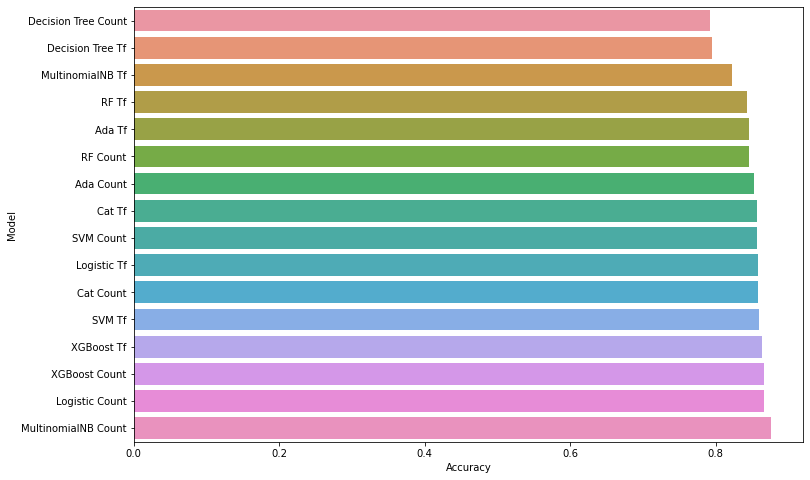

In [137]:
compare = pd.DataFrame({"Model": ["Logistic Count","Logistic Tf", "Decision Tree Count","Decision Tree Tf",
                                  "XGBoost Count", "XGBoost Tf","RF Count", "RF Tf",
                                  "MultinomialNB Count", "MultinomialNB Tf","SVM Count", "SVM Tf", "Ada Count",
                                  "Ada Tf","Cat Count","Cat Tf"],
                        "Accuracy": [log_accuracy_count, log_accuracy_tfidf,dsc_accuracy_count,dsc_accuracy_tfidf,
                                     xgb_accuracy_count, xgb_accuracy_tfidf, rf_accuracy_count,rf_accuracy_tfidf,
                                    mnb_accuracy_count,mnb_accuracy_tfidf,svm_accuracy_count,svm_accuracy_tfidf,
                                    ada_accuracy_count,ada_accuracy_tfidf,cat_accuracy_count,cat_accuracy_tfidf]})

compare = compare.sort_values(by="Accuracy", ascending=True)

plt.figure(figsize=(12,8))
ax = sns.barplot(x="Accuracy", y="Model", data=compare)

In [138]:
compare.iplot(kind='barh',y=['Accuracy'], x = ['Model'],theme='solar')

In [139]:
compare.iplot(kind='barh',y=['Accuracy'], x = ['Model'],theme='white')

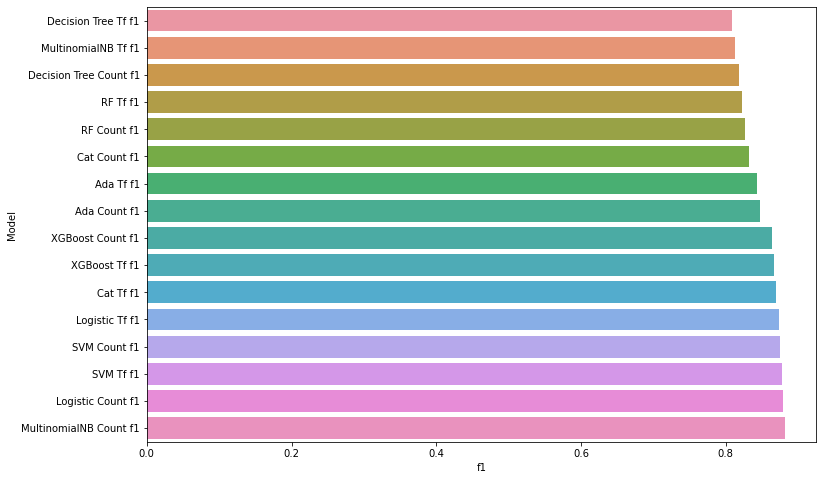

In [141]:
comparef1 = pd.DataFrame({"Model": ["Logistic Count f1","Logistic Tf f1", "Decision Tree Count f1","Decision Tree Tf f1",
                                  "XGBoost Count f1", "XGBoost Tf f1","RF Count f1", "RF Tf f1",
                                  "MultinomialNB Count f1", "MultinomialNB Tf f1","SVM Count f1", "SVM Tf f1",
                                    "Ada Count f1", "Ada Tf f1","Cat Count f1", "Cat Tf f1"],
                        "f1": [f1_log_accuracy_count, f1_log_accuracy_tfidf,f1_dsc_accuracy_count,f1_dsc_accuracy_tfidf,
                                     f1_xgb_accuracy_count, f1_xgb_accuracy_tfidf, f1_rf_accuracy_count,f1_rf_accuracy_tfidf,
                                    f1_mnb_accuracy_count,f1_mnb_accuracy_tfidf,f1_svm_accuracy_count,f1_svm_accuracy_tfidf,
                                    f1_ada_accuracy_count,f1_ada_accuracy_tfidf,f1_cat_accuracy_count,f1_cat_accuracy_tfidf]})

comparef1 = comparef1.sort_values(by="f1", ascending=True)

plt.figure(figsize=(12,8))
ax = sns.barplot(x="f1", y="Model", data=comparef1)


In [142]:
comparef1.iplot(kind='barh',y=['f1'], x = ['Model'],theme='white')

In [71]:
#Accuracy is used when the True Positives and True negatives are more important while F1-score is used when the False Negatives and False Positives are crucial.
#Accuracy can be used when the class distribution is similar while F1-score is a better metric when there are imbalanced classes as in the above case.

___

<p style="text-align: center;"><img src="https://docs.google.com/uc?id=1lY0Uj5R04yMY3-ZppPWxqCr5pvBLYPnV" class="img-fluid" alt="CLRSWY"></p>

___

In [52]:
from sklearn.model_selection import GridSearchCV
xgb_params = {"n_estimators": [50, 300], "subsample":[0.5,1], "max_depth":[3,7], "learning_rate":[0.1,0.3]}
xgb_count_grid = GridSearchCV(XGBClassifier(), xgb_params, cv = 3, verbose = 1).fit(X_train_count, y_train)
#n_jobs = -1
print(xgb_count_grid.best_params_)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:  3.2min finished


{'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 300, 'subsample': 1}


In [53]:
xgb_count_tuned = XGBClassifier(learning_rate= 0.3, max_depth= 3, 
                                n_estimators= 300, subsample= 1).fit(X_train_count, y_train)
y_pred = xgb_count_tuned.predict(X_test_count)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[ 427  393]
 [ 158 3551]]
              precision    recall  f1-score   support

           0       0.73      0.52      0.61       820
           1       0.90      0.96      0.93      3709

    accuracy                           0.88      4529
   macro avg       0.82      0.74      0.77      4529
weighted avg       0.87      0.88      0.87      4529



In [54]:
from sklearn.model_selection import GridSearchCV
xgb_params = {"n_estimators": [50, 400], "subsample":[0.5,1], "max_depth":[3,7], "learning_rate":[0.1,0.3]}
xgb_tfidf_grid = GridSearchCV(XGBClassifier(), xgb_params, cv = 3, verbose = 1,n_jobs = -1).fit(X_train_tfidf, y_train)
#n_jobs = -1
print(xgb_tfidf_grid.best_params_)

Fitting 3 folds for each of 16 candidates, totalling 48 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 4 concurrent workers.
[Parallel(n_jobs=-1)]: Done  48 out of  48 | elapsed:  5.9min finished


{'learning_rate': 0.3, 'max_depth': 3, 'n_estimators': 400, 'subsample': 1}


In [55]:
xgb_tfidf_tuned = XGBClassifier(learning_rate= 0.3, max_depth= 3, 
                                n_estimators= 400, subsample= 1).fit(X_train_tfidf, y_train)
y_pred = xgb_tfidf_tuned.predict(X_test_count)
print(confusion_matrix(y_test, y_pred))
print(classification_report(y_test, y_pred))

[[ 411  409]
 [ 181 3528]]
              precision    recall  f1-score   support

           0       0.69      0.50      0.58       820
           1       0.90      0.95      0.92      3709

    accuracy                           0.87      4529
   macro avg       0.80      0.73      0.75      4529
weighted avg       0.86      0.87      0.86      4529



In [56]:
#With tunnning also its close to regular ones. i will check with SMOTE. 
#At the end i will compare SMOTE and regular results.

# SMOTE

In [77]:
from collections import Counter
counter = Counter(y_train)
print(counter)

Counter({1: 14831, 0: 3281})


In [90]:
#X_train_count
#X_train_tfidf

from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE

over = SMOTE(sampling_strategy=0.3)
under = RandomUnderSampler(sampling_strategy=0.6)
from imblearn.pipeline import Pipeline
steps = [('o', over), ('u', under)]
pipeline = Pipeline(steps=steps)
X_smote, y_smote = pipeline.fit_resample(X_train_count, y_train)

print(Counter(y_smote))

Counter({1: 7415, 0: 4449})


In [97]:
from imblearn.under_sampling import RandomUnderSampler
from imblearn.over_sampling import SMOTE
over = SMOTE(sampling_strategy=0.3)
under = RandomUnderSampler(sampling_strategy=0.8)
from imblearn.pipeline import Pipeline
steps = [('u', under)]
pipeline = Pipeline(steps=steps)
X_smote, y_smote = pipeline.fit_resample(X_train_count, y_train)
print(Counter(y_smote))

Counter({1: 4101, 0: 3281})


In [98]:
from sklearn.metrics import classification_report, confusion_matrix
log_classifier2 = linear_model.LogisticRegression(max_iter=1000)
log_classifier2.fit(X_smote, y_smote)
y_pred = log_classifier2.predict(X_test_count)
print(confusion_matrix(y_test,y_pred))
print(classification_report(y_test, y_pred))

log_classifier2 = linear_model.LogisticRegression(max_iter=1000)
log_classifier2.fit(X_smote, y_smote)
log_accuracy_count2 = model_selection.cross_val_score(log_classifier2,
                                           X_test_count,
                                           y_test,
                                           cv = 10).mean()
f1_log_accuracy_count2 = f1_score(y_test, y_pred)
print("Log Regression Count Vectors f12:",f1_log_accuracy_count2)
print("Log Regression Count Vectors Accuracy2:", log_accuracy_count2)


[[ 653  167]
 [ 523 3186]]
              precision    recall  f1-score   support

           0       0.56      0.80      0.65       820
           1       0.95      0.86      0.90      3709

    accuracy                           0.85      4529
   macro avg       0.75      0.83      0.78      4529
weighted avg       0.88      0.85      0.86      4529

Log Regression Count Vectors f12: 0.9022939677145285
Log Regression Count Vectors Accuracy2: 0.866190490144367


In [99]:
print("Log Regression Count Vectors f1:",f1_log_accuracy_count)
print("Log Regression Count Vectors Accuracy:", log_accuracy_count)

print("Log Regression Count Vectors f12:",f1_log_accuracy_count2)
print("Log Regression Count Vectors Accuracy2:", log_accuracy_count2)

Log Regression Count Vectors f1: 0.9294616812516573
Log Regression Count Vectors Accuracy: 0.866190490144367
Log Regression Count Vectors f12: 0.9022939677145285
Log Regression Count Vectors Accuracy2: 0.866190490144367


In [100]:
# ibelieve smote is also useless / not effective. os i leave it here.

## MODEL

In [80]:
model = mnb_classifier
import pickle
pickle.dump(model, open('model_nb', 'wb'))

In [81]:
nb_model = pickle.load(open("model_nb", "rb", ))

In [82]:
comment = "this dress very bad, i dont like it"

In [84]:
#nb_model.predict(comment)

In [85]:
vect = CountVectorizer()
vect.fit(X_train)

CountVectorizer()

In [91]:
#transformed_comment = vect.transform(comment)

In [92]:
comment_s = pd.Series(comment)

In [93]:
transformed_comment = vect.transform(comment_s)

In [95]:
transformed_comment.toarray()

array([[0, 0, 0, ..., 0, 0, 0]])

In [96]:
c = pd.DataFrame(transformed_comment.toarray())
c

,0,1,2,3,4,5,6,7,8,9,...,3732,3733,3734,3735,3736,3737,3738,3739,3740,3741
0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [97]:
nb_model.predict(transformed_comment) # prediction is 0

array([0])

In [98]:
nb_model.predict(transformed_comment)[0] # prediction 0

0

In [119]:
#model save and load
model = mnb_classifier
import pickle
pickle.dump(model, open('model_nb', 'wb'))
nb_model = pickle.load(open("model_nb", "rb", ))

#try
comment = "ugly"
vect = CountVectorizer().fit(X_train)
comment_s = pd.Series(comment)
transformed_comment = vect.transform(comment_s)
nb_model.predict(transformed_comment) # prediction is 1

array([0])

#Thanks !